# <font color='blue'><u>I. Data Preprocessing & Visualisation</u></font>

In [495]:
# !pip install jupyter_contrib_nbextensions

<IPython.core.display.Javascript object>

In [496]:
# !jupyter contrib nbextension install

<IPython.core.display.Javascript object>

In [497]:
# ! pip install nb_black

# A simple extension for Jupyter Notebook and Jupyter Lab to beautify Python code automatically using Black.

# Please note that since the Black package only supports Python 3.6+, so YAPF package will be used for the lower versions. If you edit the code while running the cell, the formatting is not submitted to the Jupyter notebook and instead silently suppressed, so you have to stick with the edited, but unformatted code.

<IPython.core.display.Javascript object>

In [498]:
# pip install statsmodels

<IPython.core.display.Javascript object>

In [499]:
%load_ext nb_black

The nb_black extension is already loaded. To reload it, use:
  %reload_ext nb_black


<IPython.core.display.Javascript object>

## INDEX
**[1. Import the packages ](#0)**
    
**[2. Read the data](#1)**

**[3. Preliminary Data Exploration](#2)**

   **[ 3.1 Summary Statistics and Data Types](#2.1)**
        
   **[ 3.2 Plot the Data](#2.2)**
        
**[4. Further Data Exploration and Preprocessing](#3)**

**[5. Weather Data Feature Engineering](#4)**

**[6. Joining Weather Data and Telemetry Data](#5)**


## <font color='Dodgerblue'>1. Import the required packages</font><a class='anchor' id='0'></a>

In [500]:
import glob  # glob module provides a function for making file lists from directory wildcard searches
import os  # Imports the OS interface module

# For data wrangling
import pandas as pd
import numpy as np

from scipy import interpolate

import datetime as dt

# FOr visualising the data
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt

from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import kpss
import statsmodels.api as sm

<IPython.core.display.Javascript object>

## <font color='Dodgerblue'>2. Read the datasets</font><a class='anchor' id='1'></a>

In [501]:
os.getcwd()

'C:\\Users\\admin\\OneDrive - University of South Wales\\8 MS4T01 Data Science Project'

<IPython.core.display.Javascript object>

In [502]:
# path = ''
# os.chdir(path)

<IPython.core.display.Javascript object>

In [503]:
# Reading the asset data
folder_name = (
    "AssetsData"  # specifies the folder in which the raw data sets are available
)
file_type = "csv"  # specifies the type of raw data files
seperator = ","  # specifies the data seperator in the file

# The below for loop reads every file in the specified folder.
# Then the files are concatenated and assigned to a data frame called 'Crimes'
tm_data = pd.concat(
    [pd.read_csv(f, sep=seperator) for f in glob.glob(folder_name + "/*." + file_type)],
    ignore_index=True,
)

<IPython.core.display.Javascript object>

In [504]:
tm_data.shape

(418606, 8)

<IPython.core.display.Javascript object>

In [505]:
# Viewing the first 5 records of the imported and concatenated dataframe
tm_data.head()

,snoIdentifier,tidIdentifier,FullDate,Reading,BST,Invalid,Suspect,FullDate1
0,1,E09474,2019-01-01 00:00:00.000,42.10,N,N,N,2019-01-01 00:00:00
1,1,E09474,2019-01-01 00:15:00.000,32.13,N,N,N,2019-01-01 00:15:00
2,1,E09474,2019-01-01 00:30:00.000,30.31,N,N,N,2019-01-01 00:30:00
3,1,E09474,2019-01-01 00:45:00.000,40.08,N,N,N,2019-01-01 00:45:00
4,1,E09474,2019-01-01 01:00:00.000,34.63,N,N,N,2019-01-01 01:00:00


<IPython.core.display.Javascript object>

In [506]:
# Reading external data- weather data
folder_name = (
    "ExternalData"  # specifies the folder in which the raw data sets are available
)
file_type = "csv"  # specifies the type of raw data files
seperator = ","  # specifies the data seperator in the file
# The below for loop reads every file in the specified folder.
# Then the files are concatenated and assigned to a data frame called 'Crimes'
ext_data = pd.concat(
    [pd.read_csv(f, sep=seperator) for f in glob.glob(folder_name + "/*." + file_type)],
    ignore_index=True,
)

<IPython.core.display.Javascript object>

In [507]:
ext_data.shape

(105216, 36)

<IPython.core.display.Javascript object>

In [508]:
ext_data.head()

,time,tempC,tempF,windspeedMiles,windspeedKmph,winddirDegree,winddir16Point,weatherCode,weatherIconUrl,weatherDesc,...,FeelsLikeC,FeelsLikeF,uvIndex,date,maxtempC,mintempC,avgtempC,totalSnow_cm,city,loc_coordinates
0,0,5,42,5,9,268,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,3,37,1,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968"
1,100,5,41,6,9,271,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,2,36,1,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968"
2,200,5,41,6,10,273,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,2,36,1,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968"
3,300,5,41,7,11,276,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,2,36,1,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968"
4,400,5,41,7,11,278,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,2,36,1,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968"


<IPython.core.display.Javascript object>

## <font color='Dodgerblue'>3. Preliminary Data Exploration</font><a class='anchor' id='2'></a>

##### <font color=green>3.1 Summary Statistics and Data Types</font><a class='anchor' id='2.1'></a>

In [509]:
# Obtaining the information about the 'tm_data' dataframe
tm_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418606 entries, 0 to 418605
Data columns (total 8 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   snoIdentifier  418606 non-null  int64  
 1   tidIdentifier  418606 non-null  object 
 2   FullDate       418606 non-null  object 
 3   Reading        418606 non-null  float64
 4   BST            418606 non-null  object 
 5   Invalid        418606 non-null  object 
 6   Suspect        418606 non-null  object 
 7   FullDate1      418558 non-null  object 
dtypes: float64(1), int64(1), object(6)
memory usage: 25.5+ MB


<IPython.core.display.Javascript object>

In [510]:
tm_data.nunique()

snoIdentifier         2
tidIdentifier         4
FullDate         105224
Reading           50001
BST                   2
Invalid               2
Suspect               1
FullDate1        105212
dtype: int64

<IPython.core.display.Javascript object>

In [511]:
# Obtaining the summary statistics of the main interested variable, the 'telemtry reading', of the 'tm_data' dataframe
tm_data["Reading"].describe()

count    418606.000000
mean         21.787455
std          23.361488
min        -311.040000
25%           2.025000
50%          13.340000
75%          38.250000
max         298.170000
Name: Reading, dtype: float64

<IPython.core.display.Javascript object>

In [512]:
# Each Asset in the data set has a unique identifier when 'snoIdentifier' and 'tidIdentifier' are concatenated.
# Hence, combining them and creating a field with unique asset ID
tm_data["AssetID"] = tm_data["snoIdentifier"].map(str) + tm_data["tidIdentifier"].map(
    str
)
tm_data.head()

,snoIdentifier,tidIdentifier,FullDate,Reading,BST,Invalid,Suspect,FullDate1,AssetID
0,1,E09474,2019-01-01 00:00:00.000,42.10,N,N,N,2019-01-01 00:00:00,1E09474
1,1,E09474,2019-01-01 00:15:00.000,32.13,N,N,N,2019-01-01 00:15:00,1E09474
2,1,E09474,2019-01-01 00:30:00.000,30.31,N,N,N,2019-01-01 00:30:00,1E09474
3,1,E09474,2019-01-01 00:45:00.000,40.08,N,N,N,2019-01-01 00:45:00,1E09474
4,1,E09474,2019-01-01 01:00:00.000,34.63,N,N,N,2019-01-01 01:00:00,1E09474


<IPython.core.display.Javascript object>

In [513]:
# Obtaining descriptive statistics of the 'Reading' by AssetID
tm_data.groupby("AssetID")["Reading"].describe()

,count,mean,std,min,25%,50%,75%,max
AssetID,,,,,,,,
1E09474,105212.0,49.170512,20.020341,-295.710,34.27000,45.830,63.2325,298.170
1E18034,105191.0,3.581180,2.336838,0.000,2.16000,3.400,4.5000,81.920
3E03007,105181.0,32.324082,13.130965,-311.040,22.07672,29.120,43.0300,295.350
3E43383,103022.0,1.654445,1.927774,-32.644,0.90600,1.361,1.9170,25.713


<IPython.core.display.Javascript object>

In [514]:
tm_data.groupby(["AssetID", "FullDate"]).agg({"Reading": ["sum"]})["Reading"].describe()

,sum
count,418606.000000
mean,21.787455
std,23.361488
min,-311.040000
25%,2.025000
50%,13.340000
75%,38.250000
max,298.170000


<IPython.core.display.Javascript object>

In [515]:
# Checking the number of missing values in the key variable 'Reading'
tm_data["Reading"].isna().sum()

0

<IPython.core.display.Javascript object>

In [516]:
# There are two date fields in the data set. Checking the missing values in each. 'FullDate1' has 48 missing values
tm_data["FullDate1"].isna().sum()

48

<IPython.core.display.Javascript object>

In [517]:
#'FullDate' has no missing values. Thus, decided to keep only 'FullDate' field
tm_data["FullDate"].isna().sum()

0

<IPython.core.display.Javascript object>

In [518]:
# Dropping the column 'FullDate1' as it has missing values and not needed
tm_data.drop("FullDate1", axis=1, inplace=True)
tm_data.head()

,snoIdentifier,tidIdentifier,FullDate,Reading,BST,Invalid,Suspect,AssetID
0,1,E09474,2019-01-01 00:00:00.000,42.10,N,N,N,1E09474
1,1,E09474,2019-01-01 00:15:00.000,32.13,N,N,N,1E09474
2,1,E09474,2019-01-01 00:30:00.000,30.31,N,N,N,1E09474
3,1,E09474,2019-01-01 00:45:00.000,40.08,N,N,N,1E09474
4,1,E09474,2019-01-01 01:00:00.000,34.63,N,N,N,1E09474


<IPython.core.display.Javascript object>

In [519]:
# The flag 'Invalid' indicates that the asset reading is unrealistic and the logger picked up an invalid record
# or even the asset might have been offline for maintenance.

# Taking a count of invalid records
tm_data[tm_data["Invalid"] == "Y"].count()

snoIdentifier    4633
tidIdentifier    4633
FullDate         4633
Reading          4633
BST              4633
Invalid          4633
Suspect          4633
AssetID          4633
dtype: int64

<IPython.core.display.Javascript object>

In [520]:
# Replacing the invalid readings with null
tm_data.loc[(tm_data["Invalid"] == "Y"), "Reading"] = None

<IPython.core.display.Javascript object>

In [521]:
# InvalidValMapping = {'Invalid': {'Y': 'None'}}
# InvalidValMapping.items()

<IPython.core.display.Javascript object>

In [522]:
# tm_data.replace(InvalidValMapping, inplace = True)

<IPython.core.display.Javascript object>

In [523]:
# checking the count of values after replacing invalid readings with null
tm_data[tm_data["Invalid"] == "Y"].count()

snoIdentifier    4633
tidIdentifier    4633
FullDate         4633
Reading             0
BST              4633
Invalid          4633
Suspect          4633
AssetID          4633
dtype: int64

<IPython.core.display.Javascript object>

In [524]:
# Obtaining the dataframe information to check the non-null count of 'Reading'
tm_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418606 entries, 0 to 418605
Data columns (total 8 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   snoIdentifier  418606 non-null  int64  
 1   tidIdentifier  418606 non-null  object 
 2   FullDate       418606 non-null  object 
 3   Reading        413973 non-null  float64
 4   BST            418606 non-null  object 
 5   Invalid        418606 non-null  object 
 6   Suspect        418606 non-null  object 
 7   AssetID        418606 non-null  object 
dtypes: float64(1), int64(1), object(6)
memory usage: 25.5+ MB


<IPython.core.display.Javascript object>

In [525]:
tm_data["Invalid"].unique()

array(['N', 'Y'], dtype=object)

<IPython.core.display.Javascript object>

In [526]:
# Checking that the null value count of readings is now equal to the invalid record count
tm_data["Reading"].isna().sum()

4633

<IPython.core.display.Javascript object>

##### <font color=green>3.2 Plotting the Data</font><a class='anchor' id='2.2'></a>

array([[<AxesSubplot:title={'center':'1E09474'}>,
        <AxesSubplot:title={'center':'1E18034'}>],
       [<AxesSubplot:title={'center':'3E03007'}>,
        <AxesSubplot:title={'center':'3E43383'}>]], dtype=object)

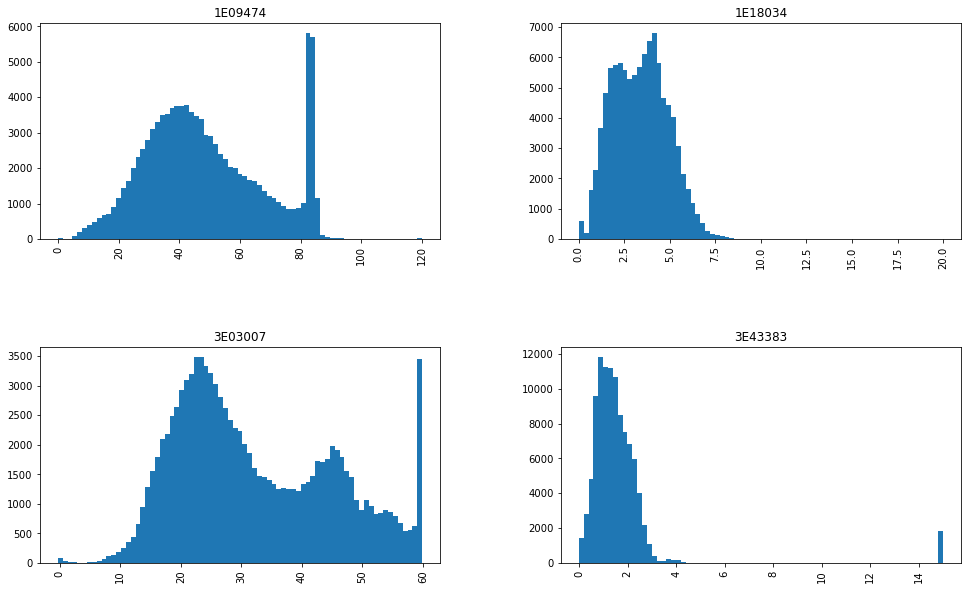

<IPython.core.display.Javascript object>

In [527]:
# Plotting histograms of readings by assetID
tm_data["Reading"].hist(by=tm_data["AssetID"], figsize=(16, 10), bins=75)

AssetID
1E09474    AxesSubplot(0.125,0.125;0.775x0.755)
1E18034    AxesSubplot(0.125,0.125;0.775x0.755)
3E03007    AxesSubplot(0.125,0.125;0.775x0.755)
3E43383    AxesSubplot(0.125,0.125;0.775x0.755)
Name: Reading, dtype: object

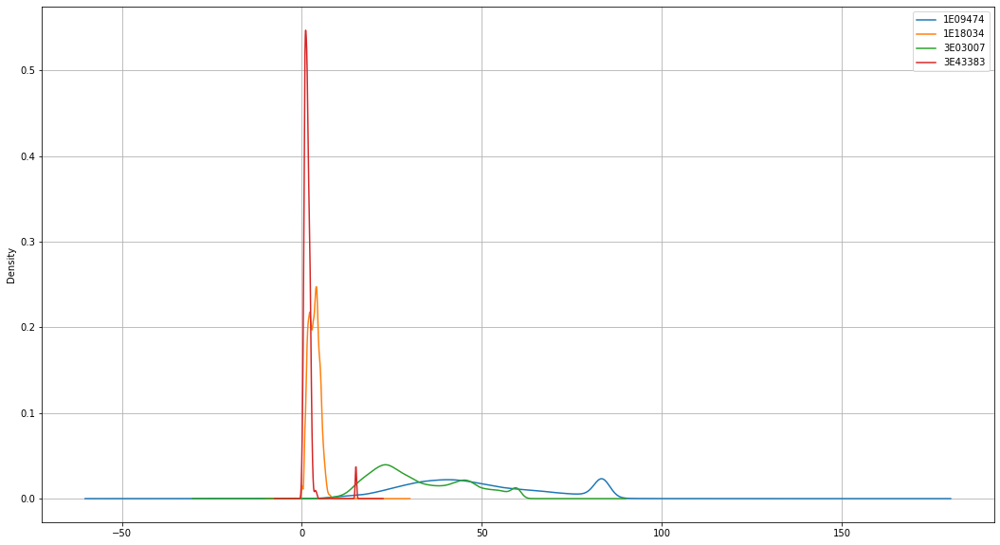

<IPython.core.display.Javascript object>

In [528]:
# Kernal density plots of the 4 assets
groups = tm_data.groupby("AssetID")
groups["Reading"].plot(kind="density", grid=True, legend=True)

In [529]:
# Checking the data type of 'FullDate' field
type(tm_data["FullDate"])

pandas.core.series.Series

<IPython.core.display.Javascript object>

In [530]:
# Creating new features using 'FullDate' such as, year, month and year-month combination as these maybe useful in future analysis
# https://towardsdatascience.com/8-visualizations-with-python-to-handle-multiple-time-series-data-19b5b2e66dd0

# Creating lists with splitted data from 'FullDate' field
list_YM = [i.split(" ")[0][:-3] for i in list(tm_data["FullDate"])]
list_Year = [i.split(" ")[0][0:4] for i in list(tm_data["FullDate"])]
list_Month = [i.split(" ")[0][5:7] for i in list(tm_data["FullDate"])]

# Assigning the above created lists to dataframe columns
tm_data["YM"] = list_YM
tm_data["Year"] = list_Year
tm_data["Month"] = list_Month
tm_data.head()

,snoIdentifier,tidIdentifier,FullDate,Reading,BST,Invalid,Suspect,AssetID,YM,Year,Month
0,1,E09474,2019-01-01 00:00:00.000,42.10,N,N,N,1E09474,2019-01,2019,01
1,1,E09474,2019-01-01 00:15:00.000,32.13,N,N,N,1E09474,2019-01,2019,01
2,1,E09474,2019-01-01 00:30:00.000,30.31,N,N,N,1E09474,2019-01,2019,01
3,1,E09474,2019-01-01 00:45:00.000,40.08,N,N,N,1E09474,2019-01,2019,01
4,1,E09474,2019-01-01 01:00:00.000,34.63,N,N,N,1E09474,2019-01,2019,01


<IPython.core.display.Javascript object>

In [531]:
# Converting the 'Fulldate' field data type from object to datetime
tm_data["FullDate"] = pd.to_datetime(tm_data["FullDate"], format="%Y-%m-%d %H:%M:%S")

<IPython.core.display.Javascript object>

In [532]:
type(tm_data["FullDate"])

pandas.core.series.Series

<IPython.core.display.Javascript object>

In [533]:
tm_data["FullDate"].dtypes

dtype('<M8[ns]')

<IPython.core.display.Javascript object>

In [534]:
tm_data["FullDate"].min()

Timestamp('2019-01-01 00:00:00')

<IPython.core.display.Javascript object>

In [535]:
tm_data["FullDate"].max()

Timestamp('2021-12-31 23:45:00')

<IPython.core.display.Javascript object>

##### <font color=green>Plotting the Time Series</font>

In [536]:
tm_data_plot = tm_data[["FullDate", "Reading", "AssetID"]].copy()

<IPython.core.display.Javascript object>

<AxesSubplot:xlabel='FullDate'>

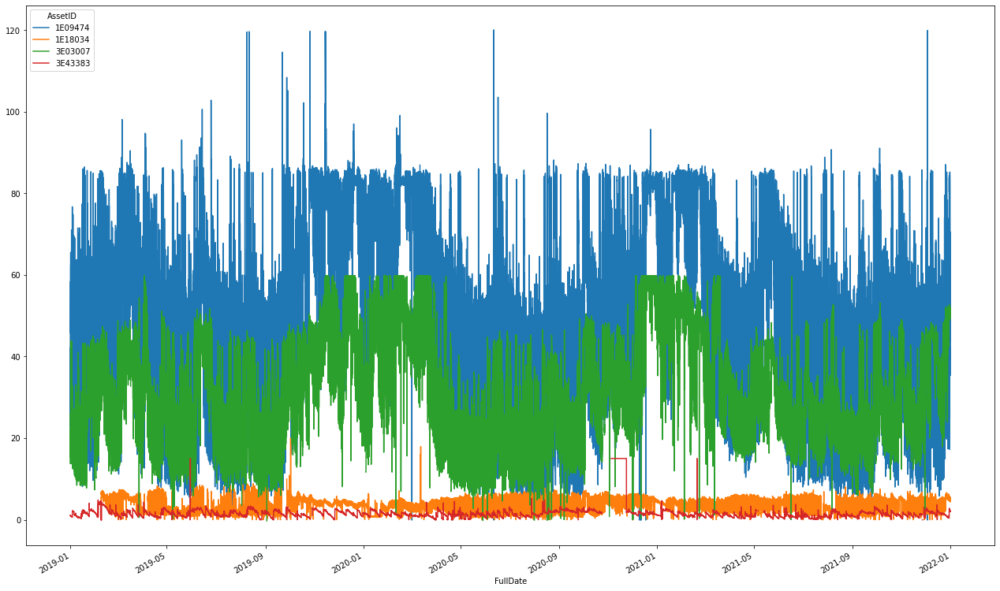

<IPython.core.display.Javascript object>

In [537]:
tm_data_plot.pivot_table(index='FullDate',columns='AssetID',values='Reading').plot(figsize=(22,14))


array([<AxesSubplot:xlabel='FullDate'>, <AxesSubplot:xlabel='FullDate'>,
       <AxesSubplot:xlabel='FullDate'>, <AxesSubplot:xlabel='FullDate'>],
      dtype=object)

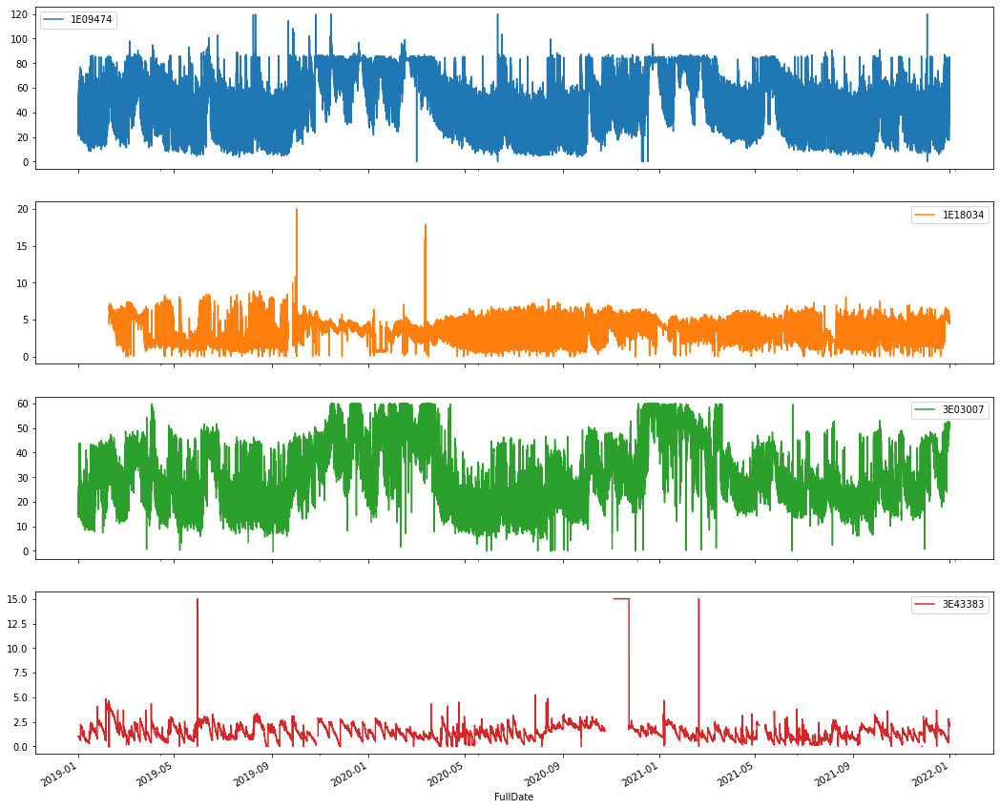

<IPython.core.display.Javascript object>

In [538]:
tm_data_plot.pivot_table(index="FullDate", columns="AssetID", values="Reading").plot(
    figsize=(18, 16), subplots=True
)

## <font color='Dodgerblue'>4. Further Data Exploration and Preprocessing</font><a class='anchor' id='3'></a>

In [539]:
tm_data = tm_data.sort_values(by=["AssetID", "FullDate"])

# Check time intervals
tm_data["delta_premerge"] = tm_data["FullDate"] - tm_data["FullDate"].shift(1)

tm_data[["FullDate", "delta_premerge"]].head()

,FullDate,delta_premerge
0,2019-01-01 00:00:00,NaT
1,2019-01-01 00:15:00,0 days 00:15:00
2,2019-01-01 00:30:00,0 days 00:15:00
3,2019-01-01 00:45:00,0 days 00:15:00
4,2019-01-01 01:00:00,0 days 00:15:00


<IPython.core.display.Javascript object>

In [540]:
tm_data["delta_premerge"].sum(), tm_data["delta_premerge"].count()

(Timedelta('1095 days 23:45:00'), 418605)

<IPython.core.display.Javascript object>

In [541]:
tm_data["delta_premerge"].value_counts()

0 days 00:15:00         418541
0 days 00:30:00             18
0 days 00:45:00              5
-1096 days +00:15:00         3
0 days 01:30:00              2
0 days 01:00:00              2
0 days 00:15:01              2
0 days 02:30:00              2
0 days 00:14:59              2
0 days 03:15:00              1
0 days 00:14:57              1
0 days 00:02:54              1
6 days 23:30:00              1
0 days 06:45:00              1
0 days 00:47:19              1
0 days 01:15:00              1
0 days 07:45:00              1
0 days 00:06:01              1
11 days 09:30:00             1
0 days 02:15:00              1
0 days 07:00:00              1
1 days 03:45:00              1
0 days 00:13:59              1
0 days 00:00:10              1
0 days 06:30:00              1
0 days 00:08:49              1
0 days 01:45:00              1
0 days 04:00:00              1
0 days 00:12:41              1
0 days 00:01:01              1
0 days 03:00:00              1
0 days 06:15:00              1
0 days 1

<IPython.core.display.Javascript object>

In [542]:
# https://www.plus2net.com/python/pandas-dt-timedelta64.php
tm_data["delta_pm_mins"] = tm_data["delta_premerge"] / np.timedelta64(1, "m")
tm_data

,snoIdentifier,tidIdentifier,FullDate,Reading,BST,Invalid,Suspect,AssetID,YM,Year,Month,delta_premerge,delta_pm_mins
0,1,E09474,2019-01-01 00:00:00,42.100,N,N,N,1E09474,2019-01,2019,01,NaT,NaN
1,1,E09474,2019-01-01 00:15:00,32.130,N,N,N,1E09474,2019-01,2019,01,0 days 00:15:00,15.0
2,1,E09474,2019-01-01 00:30:00,30.310,N,N,N,1E09474,2019-01,2019,01,0 days 00:15:00,15.0
3,1,E09474,2019-01-01 00:45:00,40.080,N,N,N,1E09474,2019-01,2019,01,0 days 00:15:00,15.0
4,1,E09474,2019-01-01 01:00:00,34.630,N,N,N,1E09474,2019-01,2019,01,0 days 00:15:00,15.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
418601,3,E43383,2021-12-31 22:45:00,2.105,N,N,N,3E43383,2021-12,2021,12,0 days 00:15:00,15.0
418602,3,E43383,2021-12-31 23:00:00,2.118,N,N,N,3E43383,2021-12,2021,12,0 days 00:15:00,15.0
418603,3,E43383,2021-12-31 23:15:00,2.111,N,N,N,3E43383,2021-12,2021,12,0 days 00:15:00,15.0
418604,3,E43383,2021-12-31 23:30:00,2.104,N,N,N,3E43383,2021-12,2021,12,0 days 00:15:00,15.0


<IPython.core.display.Javascript object>

In [543]:
tm_data["delta_pm_mins"].value_counts()

 1.500000e+01    418541
 3.000000e+01        18
 4.500000e+01         5
-1.578225e+06         3
 1.498333e+01         2
 1.501667e+01         2
 6.000000e+01         2
 9.000000e+01         2
 1.500000e+02         2
 1.665000e+03         1
 2.400000e+02         1
 4.050000e+02         1
 3.750000e+02         1
 1.200000e+02         1
 3.900000e+02         1
 1.016667e+00         1
 1.210000e+01         1
 6.016667e+00         1
 4.731667e+01         1
 5.000000e-02         1
 1.398333e+01         1
 4.650000e+02         1
 7.500000e+01         1
 1.005000e+04         1
 1.800000e+02         1
 1.350000e+02         1
 1.050000e+02         1
 1.495000e+01         1
 1.268333e+01         1
 1.950000e+02         1
 1.666667e-01         1
 2.900000e+00         1
 9.150000e+02         1
 1.641000e+04         1
 8.816667e+00         1
 1.095000e+03         1
 4.200000e+02         1
Name: delta_pm_mins, dtype: int64

<IPython.core.display.Javascript object>

In [544]:
# https://www.codegrepper.com/code-examples/python/how+to+split+date+and+time+column+in+python
tm_data["Date"] = pd.to_datetime(tm_data["FullDate"]).dt.date
tm_data["Time"] = pd.to_datetime(tm_data["FullDate"]).dt.time
tm_data

,snoIdentifier,tidIdentifier,FullDate,Reading,BST,Invalid,Suspect,AssetID,YM,Year,Month,delta_premerge,delta_pm_mins,Date,Time
0,1,E09474,2019-01-01 00:00:00,42.100,N,N,N,1E09474,2019-01,2019,01,NaT,NaN,2019-01-01,00:00:00
1,1,E09474,2019-01-01 00:15:00,32.130,N,N,N,1E09474,2019-01,2019,01,0 days 00:15:00,15.0,2019-01-01,00:15:00
2,1,E09474,2019-01-01 00:30:00,30.310,N,N,N,1E09474,2019-01,2019,01,0 days 00:15:00,15.0,2019-01-01,00:30:00
3,1,E09474,2019-01-01 00:45:00,40.080,N,N,N,1E09474,2019-01,2019,01,0 days 00:15:00,15.0,2019-01-01,00:45:00
4,1,E09474,2019-01-01 01:00:00,34.630,N,N,N,1E09474,2019-01,2019,01,0 days 00:15:00,15.0,2019-01-01,01:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
418601,3,E43383,2021-12-31 22:45:00,2.105,N,N,N,3E43383,2021-12,2021,12,0 days 00:15:00,15.0,2021-12-31,22:45:00
418602,3,E43383,2021-12-31 23:00:00,2.118,N,N,N,3E43383,2021-12,2021,12,0 days 00:15:00,15.0,2021-12-31,23:00:00
418603,3,E43383,2021-12-31 23:15:00,2.111,N,N,N,3E43383,2021-12,2021,12,0 days 00:15:00,15.0,2021-12-31,23:15:00
418604,3,E43383,2021-12-31 23:30:00,2.104,N,N,N,3E43383,2021-12,2021,12,0 days 00:15:00,15.0,2021-12-31,23:30:00


<IPython.core.display.Javascript object>

In [545]:
tm_data["Date"].min()

datetime.date(2019, 1, 1)

<IPython.core.display.Javascript object>

In [546]:
tm_data["Date"].max()

datetime.date(2021, 12, 31)

<IPython.core.display.Javascript object>

In [547]:
tm_data["Time"].min()

datetime.time(0, 0)

<IPython.core.display.Javascript object>

In [548]:
tm_data["Time"].max()

datetime.time(23, 45)

<IPython.core.display.Javascript object>

In [549]:
type(tm_data["Time"])

pandas.core.series.Series

<IPython.core.display.Javascript object>

In [550]:
tm_data["OriginalRecord"] = "Y"
tm_data

,snoIdentifier,tidIdentifier,FullDate,Reading,BST,Invalid,Suspect,AssetID,YM,Year,Month,delta_premerge,delta_pm_mins,Date,Time,OriginalRecord
0,1,E09474,2019-01-01 00:00:00,42.100,N,N,N,1E09474,2019-01,2019,01,NaT,NaN,2019-01-01,00:00:00,Y
1,1,E09474,2019-01-01 00:15:00,32.130,N,N,N,1E09474,2019-01,2019,01,0 days 00:15:00,15.0,2019-01-01,00:15:00,Y
2,1,E09474,2019-01-01 00:30:00,30.310,N,N,N,1E09474,2019-01,2019,01,0 days 00:15:00,15.0,2019-01-01,00:30:00,Y
3,1,E09474,2019-01-01 00:45:00,40.080,N,N,N,1E09474,2019-01,2019,01,0 days 00:15:00,15.0,2019-01-01,00:45:00,Y
4,1,E09474,2019-01-01 01:00:00,34.630,N,N,N,1E09474,2019-01,2019,01,0 days 00:15:00,15.0,2019-01-01,01:00:00,Y
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
418601,3,E43383,2021-12-31 22:45:00,2.105,N,N,N,3E43383,2021-12,2021,12,0 days 00:15:00,15.0,2021-12-31,22:45:00,Y
418602,3,E43383,2021-12-31 23:00:00,2.118,N,N,N,3E43383,2021-12,2021,12,0 days 00:15:00,15.0,2021-12-31,23:00:00,Y
418603,3,E43383,2021-12-31 23:15:00,2.111,N,N,N,3E43383,2021-12,2021,12,0 days 00:15:00,15.0,2021-12-31,23:15:00,Y
418604,3,E43383,2021-12-31 23:30:00,2.104,N,N,N,3E43383,2021-12,2021,12,0 days 00:15:00,15.0,2021-12-31,23:30:00,Y


<IPython.core.display.Javascript object>

In [551]:
BaseTS = (
    pd.date_range("2019-01-01 00:00:00", "2021-12-31 23:45:00", freq="15T")
    .to_frame(name="date")
    .reset_index(drop=True)
)
BaseTS

,date
0,2019-01-01 00:00:00
1,2019-01-01 00:15:00
2,2019-01-01 00:30:00
3,2019-01-01 00:45:00
4,2019-01-01 01:00:00
...,...
105211,2021-12-31 22:45:00
105212,2021-12-31 23:00:00
105213,2021-12-31 23:15:00
105214,2021-12-31 23:30:00


<IPython.core.display.Javascript object>

In [552]:
Assets = pd.DataFrame(tm_data["AssetID"].unique(), columns=["Asset_ID"])
Assets

,Asset_ID
0,1E09474
1,1E18034
2,3E03007
3,3E43383


<IPython.core.display.Javascript object>

In [553]:
# Cartesian Join
ExpTS = Assets.assign(key=1).merge(BaseTS.assign(key=1), on="key").drop("key", axis=1)
ExpTS.columns = ["AssetID", "FullDate"]
ExpTS = ExpTS.sort_values(by=["AssetID", "FullDate"]).reset_index(drop=True)
ExpTS

,AssetID,FullDate
0,1E09474,2019-01-01 00:00:00
1,1E09474,2019-01-01 00:15:00
2,1E09474,2019-01-01 00:30:00
3,1E09474,2019-01-01 00:45:00
4,1E09474,2019-01-01 01:00:00
...,...,...
420859,3E43383,2021-12-31 22:45:00
420860,3E43383,2021-12-31 23:00:00
420861,3E43383,2021-12-31 23:15:00
420862,3E43383,2021-12-31 23:30:00


<IPython.core.display.Javascript object>

In [554]:
# Newly inserted code. Because Need date and time seperately for full expected dataset as it is needed in merging weather data
ExpTS["Date"] = pd.to_datetime(ExpTS["FullDate"]).dt.date
ExpTS["Time"] = pd.to_datetime(ExpTS["FullDate"]).dt.time
ExpTS

,AssetID,FullDate,Date,Time
0,1E09474,2019-01-01 00:00:00,2019-01-01,00:00:00
1,1E09474,2019-01-01 00:15:00,2019-01-01,00:15:00
2,1E09474,2019-01-01 00:30:00,2019-01-01,00:30:00
3,1E09474,2019-01-01 00:45:00,2019-01-01,00:45:00
4,1E09474,2019-01-01 01:00:00,2019-01-01,01:00:00
...,...,...,...,...
420859,3E43383,2021-12-31 22:45:00,2021-12-31,22:45:00
420860,3E43383,2021-12-31 23:00:00,2021-12-31,23:00:00
420861,3E43383,2021-12-31 23:15:00,2021-12-31,23:15:00
420862,3E43383,2021-12-31 23:30:00,2021-12-31,23:30:00


<IPython.core.display.Javascript object>

In [555]:
# Nely added 'date' and 'time' fields to merge on
tm_data_merge = pd.merge(
    ExpTS, tm_data, on=["AssetID", "FullDate", "Date", "Time"], how="left"
)
tm_data_merge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 420864 entries, 0 to 420863
Data columns (total 16 columns):
 #   Column          Non-Null Count   Dtype          
---  ------          --------------   -----          
 0   AssetID         420864 non-null  object         
 1   FullDate        420864 non-null  datetime64[ns] 
 2   Date            420864 non-null  object         
 3   Time            420864 non-null  object         
 4   snoIdentifier   418598 non-null  float64        
 5   tidIdentifier   418598 non-null  object         
 6   Reading         413965 non-null  float64        
 7   BST             418598 non-null  object         
 8   Invalid         418598 non-null  object         
 9   Suspect         418598 non-null  object         
 10  YM              418598 non-null  object         
 11  Year            418598 non-null  object         
 12  Month           418598 non-null  object         
 13  delta_premerge  418597 non-null  timedelta64[ns]
 14  delta_pm_mins   4185

<IPython.core.display.Javascript object>

In [556]:
tm_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 418606 entries, 0 to 418605
Data columns (total 16 columns):
 #   Column          Non-Null Count   Dtype          
---  ------          --------------   -----          
 0   snoIdentifier   418606 non-null  int64          
 1   tidIdentifier   418606 non-null  object         
 2   FullDate        418606 non-null  datetime64[ns] 
 3   Reading         413973 non-null  float64        
 4   BST             418606 non-null  object         
 5   Invalid         418606 non-null  object         
 6   Suspect         418606 non-null  object         
 7   AssetID         418606 non-null  object         
 8   YM              418606 non-null  object         
 9   Year            418606 non-null  object         
 10  Month           418606 non-null  object         
 11  delta_premerge  418605 non-null  timedelta64[ns]
 12  delta_pm_mins   418605 non-null  float64        
 13  Date            418606 non-null  object         
 14  Time            4186

<IPython.core.display.Javascript object>

In [557]:
420864 - 418598

2266

<IPython.core.display.Javascript object>

In [558]:
# 8 records which had a different frquency had been dropped anyway when merging
418606 - 418598

8

<IPython.core.display.Javascript object>

In [559]:
tm_data_merge

,AssetID,FullDate,Date,Time,snoIdentifier,tidIdentifier,Reading,BST,Invalid,Suspect,YM,Year,Month,delta_premerge,delta_pm_mins,OriginalRecord
0,1E09474,2019-01-01 00:00:00,2019-01-01,00:00:00,1.0,E09474,42.100,N,N,N,2019-01,2019,01,NaT,NaN,Y
1,1E09474,2019-01-01 00:15:00,2019-01-01,00:15:00,1.0,E09474,32.130,N,N,N,2019-01,2019,01,0 days 00:15:00,15.0,Y
2,1E09474,2019-01-01 00:30:00,2019-01-01,00:30:00,1.0,E09474,30.310,N,N,N,2019-01,2019,01,0 days 00:15:00,15.0,Y
3,1E09474,2019-01-01 00:45:00,2019-01-01,00:45:00,1.0,E09474,40.080,N,N,N,2019-01,2019,01,0 days 00:15:00,15.0,Y
4,1E09474,2019-01-01 01:00:00,2019-01-01,01:00:00,1.0,E09474,34.630,N,N,N,2019-01,2019,01,0 days 00:15:00,15.0,Y
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
420859,3E43383,2021-12-31 22:45:00,2021-12-31,22:45:00,3.0,E43383,2.105,N,N,N,2021-12,2021,12,0 days 00:15:00,15.0,Y
420860,3E43383,2021-12-31 23:00:00,2021-12-31,23:00:00,3.0,E43383,2.118,N,N,N,2021-12,2021,12,0 days 00:15:00,15.0,Y
420861,3E43383,2021-12-31 23:15:00,2021-12-31,23:15:00,3.0,E43383,2.111,N,N,N,2021-12,2021,12,0 days 00:15:00,15.0,Y
420862,3E43383,2021-12-31 23:30:00,2021-12-31,23:30:00,3.0,E43383,2.104,N,N,N,2021-12,2021,12,0 days 00:15:00,15.0,Y


<IPython.core.display.Javascript object>

In [560]:
# replacing na values in 'OriginalRecord' with N
tm_data_merge["OriginalRecord"].fillna("N", inplace=True)

<IPython.core.display.Javascript object>

In [561]:
tm_data_merge["OriginalRecord"].value_counts()

Y    418598
N      2266
Name: OriginalRecord, dtype: int64

<IPython.core.display.Javascript object>

In [562]:
tm_data_merge[pd.isnull(tm_data_merge).any(axis=1)]

,AssetID,FullDate,Date,Time,snoIdentifier,tidIdentifier,Reading,BST,Invalid,Suspect,YM,Year,Month,delta_premerge,delta_pm_mins,OriginalRecord
0,1E09474,2019-01-01 00:00:00,2019-01-01,00:00:00,1.0,E09474,42.1,N,N,N,2019-01,2019,01,NaT,NaN,Y
4275,1E09474,2019-02-14 12:45:00,2019-02-14,12:45:00,1.0,E09474,NaN,N,Y,N,2019-02,2019,02,0 days 00:15:00,15.0,Y
21074,1E09474,2019-08-08 12:30:00,2019-08-08,12:30:00,1.0,E09474,NaN,Y,Y,N,2019-08,2019,08,0 days 00:15:00,15.0,Y
41799,1E09474,2020-03-11 09:45:00,2020-03-11,09:45:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,N
49185,1E09474,2020-05-27 08:15:00,2020-05-27,08:15:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
417678,3E43383,2021-11-28 19:30:00,2021-11-28,19:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,N
417679,3E43383,2021-11-28 19:45:00,2021-11-28,19:45:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,N
417680,3E43383,2021-11-28 20:00:00,2021-11-28,20:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,N
417681,3E43383,2021-11-28 20:15:00,2021-11-28,20:15:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,N


<IPython.core.display.Javascript object>

In [563]:
tm_data_merge["Reading"].isna().sum()

6899

<IPython.core.display.Javascript object>

In [564]:
# Finding missing values after groupby
g = tm_data_merge.groupby("AssetID")
g.count().rsub(g.size(), axis=0)

,FullDate,Date,Time,snoIdentifier,tidIdentifier,Reading,BST,Invalid,Suspect,YM,Year,Month,delta_premerge,delta_pm_mins,OriginalRecord
AssetID,,,,,,,,,,,,,,,
1E09474,0,0,0,4,4,9,4,4,4,4,4,4,5,5,0
1E18034,0,0,0,25,25,4326,25,25,25,25,25,25,25,25,0
3E03007,0,0,0,43,43,120,43,43,43,43,43,43,43,43,0
3E43383,0,0,0,2194,2194,2444,2194,2194,2194,2194,2194,2194,2194,2194,0


<IPython.core.display.Javascript object>

In [565]:
# Function that calculates the percentage of missing values
def calc_percent_NAs(df):
    nans = pd.DataFrame(
        df.isnull().sum().sort_values(ascending=False) / len(df), columns=["percent"]
    )
    idx = nans["percent"] > 0
    return nans[idx]

<IPython.core.display.Javascript object>

In [566]:
# Let's take a look at top ten columns with missing values
calc_percent_NAs(tm_data_merge).head(1)

,percent
Reading,0.016392


<IPython.core.display.Javascript object>

Text(0, 0.5, 'Telemetry Reading')

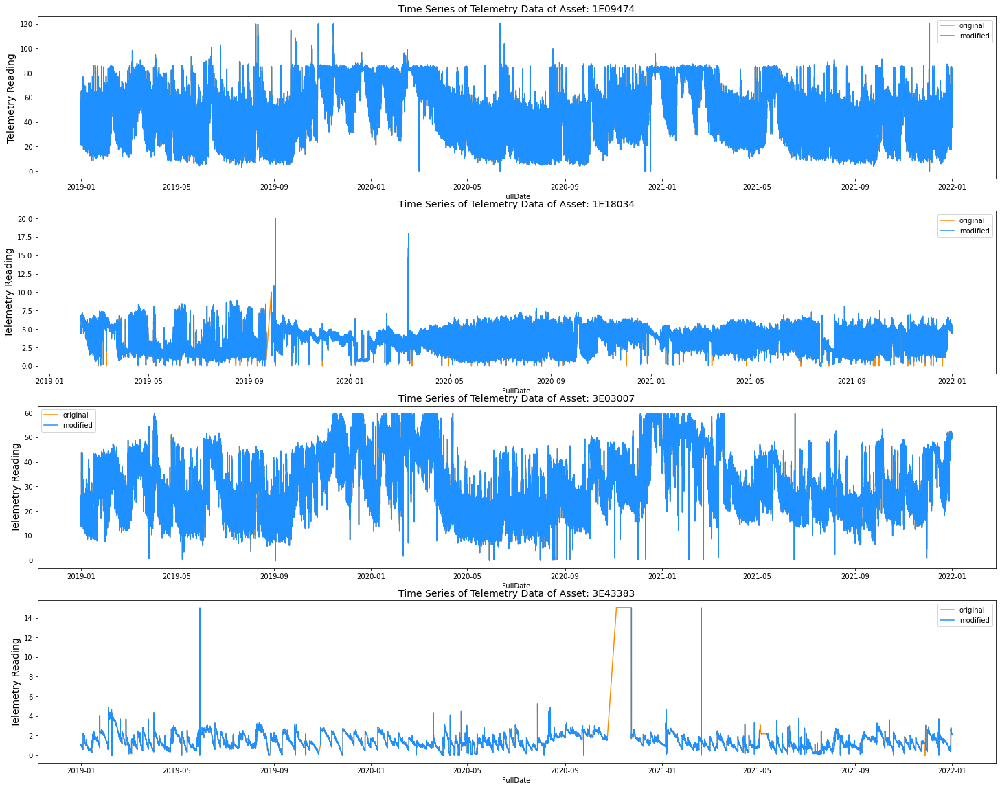

<IPython.core.display.Javascript object>

In [567]:
f, ax = plt.subplots(nrows=4, ncols=1, figsize=(25, 20))

original_1E09474 = tm_data_merge[tm_data_merge["AssetID"] == "1E09474"][
    "Reading"
].copy()
tmdata_1E09474 = tm_data_merge[tm_data_merge["AssetID"] == "1E09474"]["Reading"].copy()
tmdata_1E09474 = tmdata_1E09474.replace(0, np.nan)

sns.lineplot(
    x=tm_data_merge["FullDate"],
    y=original_1E09474,
    ax=ax[0],
    color="darkorange",
    label="original",
)
sns.lineplot(
    x=tm_data_merge["FullDate"],
    y=tmdata_1E09474.fillna(np.inf),
    ax=ax[0],
    color="dodgerblue",
    label="modified",
)
ax[0].set_title("Time Series of Telemetry Data of Asset: 1E09474", fontsize=14)
ax[0].set_ylabel(ylabel="Telemetry Reading", fontsize=14)


original_1E18034 = tm_data_merge[tm_data_merge["AssetID"] == "1E18034"][
    "Reading"
].copy()
tmdata_1E18034 = tm_data_merge[tm_data_merge["AssetID"] == "1E18034"]["Reading"].copy()
tmdata_1E18034 = tmdata_1E18034.replace(0, np.nan)

sns.lineplot(
    x=tm_data_merge["FullDate"],
    y=original_1E18034,
    ax=ax[1],
    color="darkorange",
    label="original",
)
sns.lineplot(
    x=tm_data_merge["FullDate"],
    y=tmdata_1E18034.fillna(np.inf),
    ax=ax[1],
    color="dodgerblue",
    label="modified",
)
ax[1].set_title("Time Series of Telemetry Data of Asset: 1E18034", fontsize=14)
ax[1].set_ylabel(ylabel="Telemetry Reading", fontsize=14)


original_3E03007 = tm_data_merge[tm_data_merge["AssetID"] == "3E03007"][
    "Reading"
].copy()
tmdata_3E03007 = tm_data_merge[tm_data_merge["AssetID"] == "3E03007"]["Reading"].copy()
tmdata_3E03007 = tmdata_3E03007.replace(0, np.nan)

sns.lineplot(
    x=tm_data_merge["FullDate"],
    y=original_3E03007,
    ax=ax[2],
    color="darkorange",
    label="original",
)
sns.lineplot(
    x=tm_data_merge["FullDate"],
    y=tmdata_3E03007.fillna(np.inf),
    ax=ax[2],
    color="dodgerblue",
    label="modified",
)
ax[2].set_title("Time Series of Telemetry Data of Asset: 3E03007", fontsize=14)
ax[2].set_ylabel(ylabel="Telemetry Reading", fontsize=14)


original_3E43383 = tm_data_merge[tm_data_merge["AssetID"] == "3E43383"][
    "Reading"
].copy()
tmdata_3E43383 = tm_data_merge[tm_data_merge["AssetID"] == "3E43383"]["Reading"].copy()
tmdata_3E43383 = tmdata_3E43383.replace(0, np.nan)

sns.lineplot(
    x=tm_data_merge["FullDate"],
    y=original_3E43383,
    ax=ax[3],
    color="darkorange",
    label="original",
)
sns.lineplot(
    x=tm_data_merge["FullDate"],
    y=tmdata_3E43383.fillna(np.inf),
    ax=ax[3],
    color="dodgerblue",
    label="modified",
)
ax[3].set_title("Time Series of Telemetry Data of Asset: 3E43383", fontsize=14)
ax[3].set_ylabel(ylabel="Telemetry Reading", fontsize=14)

Text(0, 0.5, 'Asset 3E43383 Reading')

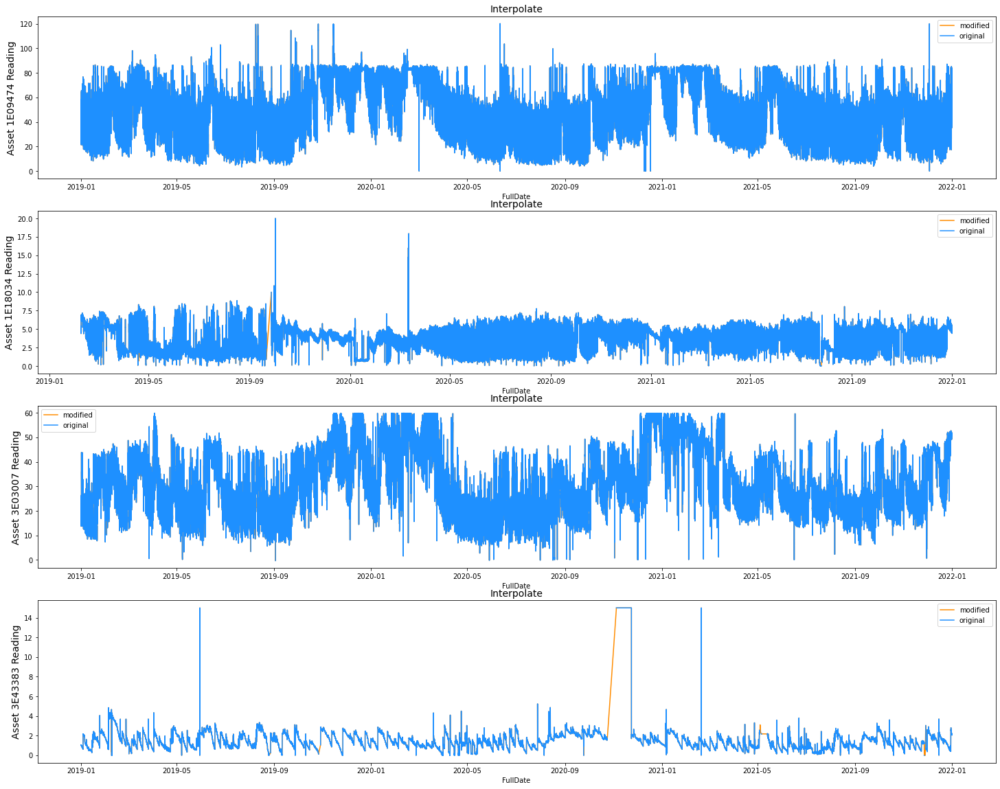

<IPython.core.display.Javascript object>

In [568]:
# lInear inerpolation for each column

f, ax = plt.subplots(nrows=4, ncols=1, figsize=(25, 20))

sns.lineplot(
    x=tm_data_merge["FullDate"],
    y=tmdata_1E09474.interpolate(),
    ax=ax[0],
    color="darkorange",
    label="modified",
)
sns.lineplot(
    x=tm_data_merge["FullDate"],
    y=tmdata_1E09474.fillna(np.inf),
    ax=ax[0],
    color="dodgerblue",
    label="original",
)
ax[0].set_title(f"Interpolate", fontsize=14)
ax[0].set_ylabel(ylabel="Asset 1E09474 Reading", fontsize=14)

sns.lineplot(
    x=tm_data_merge["FullDate"],
    y=tmdata_1E18034.interpolate(),
    ax=ax[1],
    color="darkorange",
    label="modified",
)
sns.lineplot(
    x=tm_data_merge["FullDate"],
    y=tmdata_1E18034.fillna(np.inf),
    ax=ax[1],
    color="dodgerblue",
    label="original",
)
ax[1].set_title(f"Interpolate", fontsize=14)
ax[1].set_ylabel(ylabel="Asset 1E18034 Reading", fontsize=14)

sns.lineplot(
    x=tm_data_merge["FullDate"],
    y=tmdata_3E03007.interpolate(),
    ax=ax[2],
    color="darkorange",
    label="modified",
)
sns.lineplot(
    x=tm_data_merge["FullDate"],
    y=tmdata_3E03007.fillna(np.inf),
    ax=ax[2],
    color="dodgerblue",
    label="original",
)
ax[2].set_title(f"Interpolate", fontsize=14)
ax[2].set_ylabel(ylabel="Asset 3E03007 Reading", fontsize=14)

sns.lineplot(
    x=tm_data_merge["FullDate"],
    y=tmdata_3E43383.interpolate(),
    ax=ax[3],
    color="darkorange",
    label="modified",
)
sns.lineplot(
    x=tm_data_merge["FullDate"],
    y=tmdata_3E43383.fillna(np.inf),
    ax=ax[3],
    color="dodgerblue",
    label="original",
)
ax[3].set_title(f"Interpolate", fontsize=14)
ax[3].set_ylabel(ylabel="Asset 3E43383 Reading", fontsize=14)

In [569]:
tm_data_merge.head()

,AssetID,FullDate,Date,Time,snoIdentifier,tidIdentifier,Reading,BST,Invalid,Suspect,YM,Year,Month,delta_premerge,delta_pm_mins,OriginalRecord
0,1E09474,2019-01-01 00:00:00,2019-01-01,00:00:00,1.0,E09474,42.10,N,N,N,2019-01,2019,01,NaT,NaN,Y
1,1E09474,2019-01-01 00:15:00,2019-01-01,00:15:00,1.0,E09474,32.13,N,N,N,2019-01,2019,01,0 days 00:15:00,15.0,Y
2,1E09474,2019-01-01 00:30:00,2019-01-01,00:30:00,1.0,E09474,30.31,N,N,N,2019-01,2019,01,0 days 00:15:00,15.0,Y
3,1E09474,2019-01-01 00:45:00,2019-01-01,00:45:00,1.0,E09474,40.08,N,N,N,2019-01,2019,01,0 days 00:15:00,15.0,Y
4,1E09474,2019-01-01 01:00:00,2019-01-01,01:00:00,1.0,E09474,34.63,N,N,N,2019-01,2019,01,0 days 00:15:00,15.0,Y


<IPython.core.display.Javascript object>

#### <font color=green>Missing Value Spotting and Imputations</font>

In [570]:
tm_data_merge = tm_data_merge.sort_values(by=["AssetID", "FullDate"])
# tm_data_NASpot = tm_data_merge[tm_data_merge['AssetID']=='1E09474'].copy()
tm_data_NASpot_all = tm_data_merge.copy()

# obtaining the count of consecutive NAs in the 'Reading'
import math

# checkdf=pd.read_csv('dummy.csv')
A = []
count = 0
NAsum = 0
current_group = 0
prev_na = False

for i, row in tm_data_NASpot_all.iterrows():
    reading = row["Reading"]
    if math.isnan(reading):
        if prev_na == False:
            current_group += 1
            prev_na = True
        A.append(current_group)
    else:
        A.append(0)
        prev_na = False

#     if i >10:
#         break

tm_data_NASpot_all["NAgroup"] = A
tm_data_NASpot_all

,AssetID,FullDate,Date,Time,snoIdentifier,tidIdentifier,Reading,BST,Invalid,Suspect,YM,Year,Month,delta_premerge,delta_pm_mins,OriginalRecord,NAgroup
0,1E09474,2019-01-01 00:00:00,2019-01-01,00:00:00,1.0,E09474,42.100,N,N,N,2019-01,2019,01,NaT,NaN,Y,0
1,1E09474,2019-01-01 00:15:00,2019-01-01,00:15:00,1.0,E09474,32.130,N,N,N,2019-01,2019,01,0 days 00:15:00,15.0,Y,0
2,1E09474,2019-01-01 00:30:00,2019-01-01,00:30:00,1.0,E09474,30.310,N,N,N,2019-01,2019,01,0 days 00:15:00,15.0,Y,0
3,1E09474,2019-01-01 00:45:00,2019-01-01,00:45:00,1.0,E09474,40.080,N,N,N,2019-01,2019,01,0 days 00:15:00,15.0,Y,0
4,1E09474,2019-01-01 01:00:00,2019-01-01,01:00:00,1.0,E09474,34.630,N,N,N,2019-01,2019,01,0 days 00:15:00,15.0,Y,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
420859,3E43383,2021-12-31 22:45:00,2021-12-31,22:45:00,3.0,E43383,2.105,N,N,N,2021-12,2021,12,0 days 00:15:00,15.0,Y,0
420860,3E43383,2021-12-31 23:00:00,2021-12-31,23:00:00,3.0,E43383,2.118,N,N,N,2021-12,2021,12,0 days 00:15:00,15.0,Y,0
420861,3E43383,2021-12-31 23:15:00,2021-12-31,23:15:00,3.0,E43383,2.111,N,N,N,2021-12,2021,12,0 days 00:15:00,15.0,Y,0
420862,3E43383,2021-12-31 23:30:00,2021-12-31,23:30:00,3.0,E43383,2.104,N,N,N,2021-12,2021,12,0 days 00:15:00,15.0,Y,0


<IPython.core.display.Javascript object>

In [571]:
tm_data_NASpot_all.to_csv("NASpotter_all.csv", index=False)

<IPython.core.display.Javascript object>

In [572]:
tm_data_NASpot_all["NAgroup"].value_counts(ascending=False).head(45)

0     413965
10      3698
60      1093
72       669
11       601
58       246
70       110
76        72
77        60
17        49
71        30
67        27
66        26
75        25
14        24
59        15
65        12
68        11
54         9
55         9
35         8
74         7
34         6
61         5
62         5
30         4
21         4
22         4
31         3
64         3
20         3
36         3
37         2
57         2
12         2
73         2
63         2
25         2
33         2
48         2
56         2
69         2
28         2
27         2
6          1
Name: NAgroup, dtype: int64

<IPython.core.display.Javascript object>

#### One-hot encoding for categorical varibles

#https://medium.com/@kyawsawhtoon/a-guide-to-knn-imputation-95e2dc496e

In [573]:
# One-hot encoding for categorical varibles
# converting each category into a binary data column by assigning 1 or 0

# making a list of categorical variables with text data
cat_variables = tm_data_merge[["BST", "Invalid", "Suspect", "OriginalRecord"]]

# Generating dummy variables by using ‘.get_dummies’ attribute of Pandas data frame package
# we are setting “drop_first” parameters as True in order to prevent the Dummy Variable Trap
cat_dummies = pd.get_dummies(cat_variables, drop_first=True)
cat_dummies.head()

,BST_Y,Invalid_Y,OriginalRecord_Y
0,0,0,1
1,0,0,1
2,0,0,1
3,0,0,1
4,0,0,1


<IPython.core.display.Javascript object>

In [574]:
# Dropping the original “Sex” and “Embarked” columns from the data frame and adding the dummy variables.
tm_data_merge = tm_data_merge.drop(
    ["BST", "Invalid", "Suspect", "OriginalRecord"], axis=1
)
tm_data_merge = pd.concat([tm_data_merge, cat_dummies], axis=1)
tm_data_merge.head()

,AssetID,FullDate,Date,Time,snoIdentifier,tidIdentifier,Reading,YM,Year,Month,delta_premerge,delta_pm_mins,BST_Y,Invalid_Y,OriginalRecord_Y
0,1E09474,2019-01-01 00:00:00,2019-01-01,00:00:00,1.0,E09474,42.10,2019-01,2019,01,NaT,NaN,0,0,1
1,1E09474,2019-01-01 00:15:00,2019-01-01,00:15:00,1.0,E09474,32.13,2019-01,2019,01,0 days 00:15:00,15.0,0,0,1
2,1E09474,2019-01-01 00:30:00,2019-01-01,00:30:00,1.0,E09474,30.31,2019-01,2019,01,0 days 00:15:00,15.0,0,0,1
3,1E09474,2019-01-01 00:45:00,2019-01-01,00:45:00,1.0,E09474,40.08,2019-01,2019,01,0 days 00:15:00,15.0,0,0,1
4,1E09474,2019-01-01 01:00:00,2019-01-01,01:00:00,1.0,E09474,34.63,2019-01,2019,01,0 days 00:15:00,15.0,0,0,1


<IPython.core.display.Javascript object>

##### <font color=green>Exploring the best missing value imputation methods asset-wise</font>

##### i. Testing the best interpolation method for Asset #2

In [575]:
# For Asset 2

# Filtering a subset of data for Asset 2
tmdata_impute_test = tm_data_merge[tm_data_merge["AssetID"] == "1E18034"].copy()
tmdata_impute_test = tmdata_impute_test[
    (tmdata_impute_test["FullDate"] >= "2019-02-08 12:30:00")
    & (tmdata_impute_test["FullDate"] <= "2019-09-21 06:45:00")
]
tmdata_impute_test

,AssetID,FullDate,Date,Time,snoIdentifier,tidIdentifier,Reading,YM,Year,Month,delta_premerge,delta_pm_mins,BST_Y,Invalid_Y,OriginalRecord_Y
108914,1E18034,2019-02-08 12:30:00,2019-02-08,12:30:00,1.0,E18034,5.39,2019-02,2019,02,0 days 00:15:00,15.0,0,0,1
108915,1E18034,2019-02-08 12:45:00,2019-02-08,12:45:00,1.0,E18034,4.39,2019-02,2019,02,0 days 00:15:00,15.0,0,0,1
108916,1E18034,2019-02-08 13:00:00,2019-02-08,13:00:00,1.0,E18034,6.86,2019-02,2019,02,0 days 00:15:00,15.0,0,0,1
108917,1E18034,2019-02-08 13:15:00,2019-02-08,13:15:00,1.0,E18034,6.63,2019-02,2019,02,0 days 00:15:00,15.0,0,0,1
108918,1E18034,2019-02-08 13:30:00,2019-02-08,13:30:00,1.0,E18034,6.71,2019-02,2019,02,0 days 00:15:00,15.0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130487,1E18034,2019-09-21 05:45:00,2019-09-21,05:45:00,1.0,E18034,3.68,2019-09,2019,09,0 days 00:15:00,15.0,1,0,1
130488,1E18034,2019-09-21 06:00:00,2019-09-21,06:00:00,1.0,E18034,3.62,2019-09,2019,09,0 days 00:15:00,15.0,1,0,1
130489,1E18034,2019-09-21 06:15:00,2019-09-21,06:15:00,1.0,E18034,3.80,2019-09,2019,09,0 days 00:15:00,15.0,1,0,1
130490,1E18034,2019-09-21 06:30:00,2019-09-21,06:30:00,1.0,E18034,4.50,2019-09,2019,09,0 days 00:15:00,15.0,1,0,1


<IPython.core.display.Javascript object>

In [576]:
tmdata_impute_test["NAReading"] = tmdata_impute_test["Reading"].copy()

<IPython.core.display.Javascript object>

In [577]:
tmdata_impute_test["NAReading"].loc[tmdata_impute_test["NAReading"] <= 1] = None

C:\Users\admin\anaconda3\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


<IPython.core.display.Javascript object>

In [578]:
tmdata_impute_test

,AssetID,FullDate,Date,Time,snoIdentifier,tidIdentifier,Reading,YM,Year,Month,delta_premerge,delta_pm_mins,BST_Y,Invalid_Y,OriginalRecord_Y,NAReading
108914,1E18034,2019-02-08 12:30:00,2019-02-08,12:30:00,1.0,E18034,5.39,2019-02,2019,02,0 days 00:15:00,15.0,0,0,1,5.39
108915,1E18034,2019-02-08 12:45:00,2019-02-08,12:45:00,1.0,E18034,4.39,2019-02,2019,02,0 days 00:15:00,15.0,0,0,1,4.39
108916,1E18034,2019-02-08 13:00:00,2019-02-08,13:00:00,1.0,E18034,6.86,2019-02,2019,02,0 days 00:15:00,15.0,0,0,1,6.86
108917,1E18034,2019-02-08 13:15:00,2019-02-08,13:15:00,1.0,E18034,6.63,2019-02,2019,02,0 days 00:15:00,15.0,0,0,1,6.63
108918,1E18034,2019-02-08 13:30:00,2019-02-08,13:30:00,1.0,E18034,6.71,2019-02,2019,02,0 days 00:15:00,15.0,0,0,1,6.71
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130487,1E18034,2019-09-21 05:45:00,2019-09-21,05:45:00,1.0,E18034,3.68,2019-09,2019,09,0 days 00:15:00,15.0,1,0,1,3.68
130488,1E18034,2019-09-21 06:00:00,2019-09-21,06:00:00,1.0,E18034,3.62,2019-09,2019,09,0 days 00:15:00,15.0,1,0,1,3.62
130489,1E18034,2019-09-21 06:15:00,2019-09-21,06:15:00,1.0,E18034,3.80,2019-09,2019,09,0 days 00:15:00,15.0,1,0,1,3.80
130490,1E18034,2019-09-21 06:30:00,2019-09-21,06:30:00,1.0,E18034,4.50,2019-09,2019,09,0 days 00:15:00,15.0,1,0,1,4.50


<IPython.core.display.Javascript object>

In [579]:
# tmdata_A1clean.loc[:] = None
tmdata_A2clean = tmdata_impute_test.copy()

<IPython.core.display.Javascript object>

In [580]:
# Interpolating data for Asset 2
# imputing using the rolling average
tmdata_A2clean = tmdata_A2clean.assign(
    FillMean=tmdata_A2clean.NAReading.fillna(tmdata_A2clean.NAReading.mean())
)
tmdata_A2clean = tmdata_A2clean.assign(
    FillMedian=tmdata_A2clean.NAReading.fillna(tmdata_A2clean.NAReading.median())
)
# tmdata_A1clean = tmdata_A1clean.assign(RollingMean24=tmdata_A1clean.NAReading.fillna(tmdata_A1clean.NAReading.rolling(24,min_periods=1,).mean()))
# tmdata_A1clean = tmdata_A1clean.assign(RollingMean36=tmdata_A1clean.NAReading.fillna(tmdata_A1clean.NAReading.rolling(36,min_periods=1,).mean()))
# tmdata_A1clean = tmdata_A1clean.assign(RollingMean48=tmdata_A1clean.NAReading.fillna(tmdata_A1clean.NAReading.rolling(48,min_periods=1,).mean()))
# tmdata_A1clean = tmdata_A1clean.assign(RollingMean72=tmdata_A1clean.NAReading.fillna(tmdata_A1clean.NAReading.rolling(72,min_periods=1,).mean()))
tmdata_A2clean = tmdata_A2clean.assign(
    RollingMean96=tmdata_A2clean.NAReading.fillna(
        tmdata_A2clean.NAReading.rolling(96, min_periods=1,).mean()
    )
)
# tmdata_A1clean = tmdata_A1clean.assign(RollingMedian=tmdata_A1clean.NAReading.fillna(tmdata_A1clean.NAReading.rolling(24,min_periods=1,).median()))
tmdata_A2clean = tmdata_A2clean.assign(
    InterpolateLinear=tmdata_A2clean.NAReading.interpolate(method="linear")
)
tmdata_A2clean = tmdata_A2clean.assign(
    InterpolateSpline2=tmdata_A2clean.NAReading.interpolate(method="spline", order=2)
)
tmdata_A2clean = tmdata_A2clean.assign(
    InterpolateSpline3=tmdata_A2clean.NAReading.interpolate(method="spline", order=3)
)

<IPython.core.display.Javascript object>

In [581]:
tmdata_A2clean.to_csv("A2ImpCheck.csv", index=False)

<IPython.core.display.Javascript object>

In [582]:
# Scoring the results and see which is better
from sklearn.metrics import r2_score

results = [
    (method, r2_score(tmdata_A2clean.Reading, tmdata_A2clean[method]))
    for method in list(tmdata_A2clean)[17:]
]
results_df = pd.DataFrame(np.array(results), columns=["Method", "R_squared"])
results_df.sort_values(by="R_squared", ascending=False)

,Method,R_squared
3,InterpolateSpline2,0.9640056041026618
4,InterpolateSpline3,0.9621201047554547
2,InterpolateLinear,0.9602148192304949
0,FillMedian,0.958782113882248
1,RollingMean96,0.9527706109795354


<IPython.core.display.Javascript object>

In [583]:
results_df.to_csv("results_A2ImpCheck.csv", index=False)

<IPython.core.display.Javascript object>

In [584]:
# create an Empty DataFrame object
# tmdata_impute_test = pd.DataFrame()

<IPython.core.display.Javascript object>

##### ii. Testing the best interpolation method for Asset #1

In [585]:
# For Asset 1

# Filtering a subset of data for Asset 1
tmdata_impute_test = tm_data_merge[tm_data_merge["AssetID"] == "1E09474"].copy()
tmdata_impute_test = tmdata_impute_test[
    (tmdata_impute_test["FullDate"] >= "2019-02-14 13:00:00")
    & (tmdata_impute_test["FullDate"] <= "2019-08-08 12:15:00")
]
tmdata_impute_test.head()

,AssetID,FullDate,Date,Time,snoIdentifier,tidIdentifier,Reading,YM,Year,Month,delta_premerge,delta_pm_mins,BST_Y,Invalid_Y,OriginalRecord_Y
4276,1E09474,2019-02-14 13:00:00,2019-02-14,13:00:00,1.0,E09474,61.34,2019-02,2019,02,0 days 00:15:00,15.0,0,0,1
4277,1E09474,2019-02-14 13:15:00,2019-02-14,13:15:00,1.0,E09474,63.67,2019-02,2019,02,0 days 00:15:00,15.0,0,0,1
4278,1E09474,2019-02-14 13:30:00,2019-02-14,13:30:00,1.0,E09474,64.52,2019-02,2019,02,0 days 00:15:00,15.0,0,0,1
4279,1E09474,2019-02-14 13:45:00,2019-02-14,13:45:00,1.0,E09474,63.28,2019-02,2019,02,0 days 00:15:00,15.0,0,0,1
4280,1E09474,2019-02-14 14:00:00,2019-02-14,14:00:00,1.0,E09474,56.03,2019-02,2019,02,0 days 00:15:00,15.0,0,0,1


<IPython.core.display.Javascript object>

In [586]:
tmdata_impute_test["NAReading"] = tmdata_impute_test["Reading"].copy()

<IPython.core.display.Javascript object>

In [587]:
tmdata_impute_test["NAReading"].loc[tmdata_impute_test["NAReading"] <= 10] = None
tmdata_impute_test.head()

C:\Users\admin\anaconda3\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


,AssetID,FullDate,Date,Time,snoIdentifier,tidIdentifier,Reading,YM,Year,Month,delta_premerge,delta_pm_mins,BST_Y,Invalid_Y,OriginalRecord_Y,NAReading
4276,1E09474,2019-02-14 13:00:00,2019-02-14,13:00:00,1.0,E09474,61.34,2019-02,2019,02,0 days 00:15:00,15.0,0,0,1,61.34
4277,1E09474,2019-02-14 13:15:00,2019-02-14,13:15:00,1.0,E09474,63.67,2019-02,2019,02,0 days 00:15:00,15.0,0,0,1,63.67
4278,1E09474,2019-02-14 13:30:00,2019-02-14,13:30:00,1.0,E09474,64.52,2019-02,2019,02,0 days 00:15:00,15.0,0,0,1,64.52
4279,1E09474,2019-02-14 13:45:00,2019-02-14,13:45:00,1.0,E09474,63.28,2019-02,2019,02,0 days 00:15:00,15.0,0,0,1,63.28
4280,1E09474,2019-02-14 14:00:00,2019-02-14,14:00:00,1.0,E09474,56.03,2019-02,2019,02,0 days 00:15:00,15.0,0,0,1,56.03


<IPython.core.display.Javascript object>

In [588]:
# tmdata_A1clean.loc[:] = None
tmdata_A1clean = tmdata_impute_test.copy()

<IPython.core.display.Javascript object>

In [589]:
# Interpolating data for Asset 1
# imputing using the rolling average
tmdata_A1clean = tmdata_A1clean.assign(
    FillMean=tmdata_A1clean.NAReading.fillna(tmdata_A1clean.NAReading.mean())
)
tmdata_A1clean = tmdata_A1clean.assign(
    FillMedian=tmdata_A1clean.NAReading.fillna(tmdata_A1clean.NAReading.median())
)
tmdata_A1clean = tmdata_A1clean.assign(
    RollingMean96=tmdata_A1clean.NAReading.fillna(
        tmdata_A1clean.NAReading.rolling(96, min_periods=1,).mean()
    )
)
tmdata_A1clean = tmdata_A1clean.assign(
    InterpolateLinear=tmdata_A1clean.NAReading.interpolate(method="linear")
)
tmdata_A1clean = tmdata_A1clean.assign(
    InterpolateSpline2=tmdata_A1clean.NAReading.interpolate(method="spline", order=2)
)
tmdata_A1clean = tmdata_A1clean.assign(
    InterpolateSpline3=tmdata_A1clean.NAReading.interpolate(method="spline", order=3)
)

<IPython.core.display.Javascript object>

In [590]:
tmdata_A1clean.to_csv("A1ImpCheck.csv", index=False)

<IPython.core.display.Javascript object>

In [591]:
# Scoring the results and see which is better
from sklearn.metrics import r2_score

results = [
    (method, r2_score(tmdata_A1clean.Reading, tmdata_A1clean[method]))
    for method in list(tmdata_A1clean)[17:]
]
results_df = pd.DataFrame(np.array(results), columns=["Method", "R_squared"])
results_df.sort_values(by="R_squared", ascending=False)

,Method,R_squared
2,InterpolateLinear,0.9911731662162709
4,InterpolateSpline3,0.9887247989073958
1,RollingMean96,0.9815420950882644
3,InterpolateSpline2,0.9710401284688275
0,FillMedian,0.9695139593555331


<IPython.core.display.Javascript object>

In [592]:
results_df.to_csv("results_A1ImpCheck.csv", index=False)

<IPython.core.display.Javascript object>

##### iii. Testing the best interpolation method for Asset #3

In [593]:
# For Asset 3

# Filtering a subset of data for Asset 3
tmdata_impute_test = tm_data_merge[tm_data_merge["AssetID"] == "3E03007"].copy()
tmdata_impute_test = tmdata_impute_test[
    (tmdata_impute_test["FullDate"] >= "2019-09-02 17:45:00")
    & (tmdata_impute_test["FullDate"] <= "2019-12-16 13:15:00")
]
tmdata_impute_test.head()

,AssetID,FullDate,Date,Time,snoIdentifier,tidIdentifier,Reading,YM,Year,Month,delta_premerge,delta_pm_mins,BST_Y,Invalid_Y,OriginalRecord_Y
233927,3E03007,2019-09-02 17:45:00,2019-09-02,17:45:00,3.0,E03007,16.69,2019-09,2019,09,0 days 00:15:00,15.0,1,0,1
233928,3E03007,2019-09-02 18:00:00,2019-09-02,18:00:00,3.0,E03007,16.78,2019-09,2019,09,0 days 00:15:00,15.0,1,0,1
233929,3E03007,2019-09-02 18:15:00,2019-09-02,18:15:00,3.0,E03007,17.93,2019-09,2019,09,0 days 00:15:00,15.0,1,0,1
233930,3E03007,2019-09-02 18:30:00,2019-09-02,18:30:00,3.0,E03007,24.47,2019-09,2019,09,0 days 00:15:00,15.0,1,0,1
233931,3E03007,2019-09-02 18:45:00,2019-09-02,18:45:00,3.0,E03007,23.02,2019-09,2019,09,0 days 00:15:00,15.0,1,0,1


<IPython.core.display.Javascript object>

In [594]:
tmdata_impute_test["NAReading"] = tmdata_impute_test["Reading"].copy()

<IPython.core.display.Javascript object>

In [595]:
tmdata_impute_test["NAReading"].loc[tmdata_impute_test["NAReading"] <= 15] = None
tmdata_impute_test.head()

C:\Users\admin\anaconda3\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


,AssetID,FullDate,Date,Time,snoIdentifier,tidIdentifier,Reading,YM,Year,Month,delta_premerge,delta_pm_mins,BST_Y,Invalid_Y,OriginalRecord_Y,NAReading
233927,3E03007,2019-09-02 17:45:00,2019-09-02,17:45:00,3.0,E03007,16.69,2019-09,2019,09,0 days 00:15:00,15.0,1,0,1,16.69
233928,3E03007,2019-09-02 18:00:00,2019-09-02,18:00:00,3.0,E03007,16.78,2019-09,2019,09,0 days 00:15:00,15.0,1,0,1,16.78
233929,3E03007,2019-09-02 18:15:00,2019-09-02,18:15:00,3.0,E03007,17.93,2019-09,2019,09,0 days 00:15:00,15.0,1,0,1,17.93
233930,3E03007,2019-09-02 18:30:00,2019-09-02,18:30:00,3.0,E03007,24.47,2019-09,2019,09,0 days 00:15:00,15.0,1,0,1,24.47
233931,3E03007,2019-09-02 18:45:00,2019-09-02,18:45:00,3.0,E03007,23.02,2019-09,2019,09,0 days 00:15:00,15.0,1,0,1,23.02


<IPython.core.display.Javascript object>

In [596]:
# tmdata_A3clean.loc[:] = None
tmdata_A3clean = tmdata_impute_test.copy()

<IPython.core.display.Javascript object>

In [597]:
# Interpolating data for Asset 3
# imputing using the rolling average
tmdata_A3clean = tmdata_A3clean.assign(
    FillMean=tmdata_A3clean.NAReading.fillna(tmdata_A3clean.NAReading.mean())
)
tmdata_A3clean = tmdata_A3clean.assign(
    FillMedian=tmdata_A3clean.NAReading.fillna(tmdata_A3clean.NAReading.median())
)
tmdata_A3clean = tmdata_A3clean.assign(
    RollingMean96=tmdata_A3clean.NAReading.fillna(
        tmdata_A3clean.NAReading.rolling(96, min_periods=1,).mean()
    )
)
tmdata_A3clean = tmdata_A3clean.assign(
    InterpolateLinear=tmdata_A3clean.NAReading.interpolate(method="linear")
)
tmdata_A3clean = tmdata_A3clean.assign(
    InterpolateSpline2=tmdata_A3clean.NAReading.interpolate(method="spline", order=2)
)
tmdata_A3clean = tmdata_A3clean.assign(
    InterpolateSpline3=tmdata_A3clean.NAReading.interpolate(method="spline", order=3)
)

<IPython.core.display.Javascript object>

In [598]:
tmdata_A3clean.to_csv("A3ImpCheck.csv", index=False)

<IPython.core.display.Javascript object>

In [599]:
# Scoring the results and see which is better
from sklearn.metrics import r2_score

results = [
    (method, r2_score(tmdata_A3clean.Reading, tmdata_A3clean[method]))
    for method in list(tmdata_A3clean)[17:]
]
results_df = pd.DataFrame(np.array(results), columns=["Method", "R_squared"])
results_df.sort_values(by="R_squared", ascending=False)

,Method,R_squared
2,InterpolateLinear,0.9955187664460295
3,InterpolateSpline2,0.9954489777966032
4,InterpolateSpline3,0.9954185418532197
1,RollingMean96,0.9823424064411295
0,FillMedian,0.8664059917408979


<IPython.core.display.Javascript object>

In [600]:
results_df.to_csv("results_A3ImpCheck.csv", index=False)

<IPython.core.display.Javascript object>

##### iv. Testing the best interpolation method for Asset #4

In [601]:
# For Asset 4

# Filtering a subset of data for Asset 4
tmdata_impute_test = tm_data_merge[tm_data_merge["AssetID"] == "3E43383"].copy()
tmdata_impute_test = tmdata_impute_test[
    (tmdata_impute_test["FullDate"] >= "2019-03-02 06:45:00")
    & (tmdata_impute_test["FullDate"] <= "2019-10-26 19:30:00")
]
tmdata_impute_test.head()

,AssetID,FullDate,Date,Time,snoIdentifier,tidIdentifier,Reading,YM,Year,Month,delta_premerge,delta_pm_mins,BST_Y,Invalid_Y,OriginalRecord_Y
321435,3E43383,2019-03-02 06:45:00,2019-03-02,06:45:00,3.0,E43383,0.156,2019-03,2019,03,0 days 00:15:00,15.0,0,0,1
321436,3E43383,2019-03-02 07:00:00,2019-03-02,07:00:00,3.0,E43383,0.957,2019-03,2019,03,0 days 00:15:00,15.0,0,0,1
321437,3E43383,2019-03-02 07:15:00,2019-03-02,07:15:00,3.0,E43383,0.950,2019-03,2019,03,0 days 00:15:00,15.0,0,0,1
321438,3E43383,2019-03-02 07:30:00,2019-03-02,07:30:00,3.0,E43383,0.950,2019-03,2019,03,0 days 00:15:00,15.0,0,0,1
321439,3E43383,2019-03-02 07:45:00,2019-03-02,07:45:00,3.0,E43383,0.971,2019-03,2019,03,0 days 00:15:00,15.0,0,0,1


<IPython.core.display.Javascript object>

In [602]:
tmdata_impute_test["NAReading"] = tmdata_impute_test["Reading"].copy()

<IPython.core.display.Javascript object>

In [603]:
tmdata_impute_test["NAReading"].loc[tmdata_impute_test["NAReading"] <= 1] = None
tmdata_impute_test.head()

C:\Users\admin\anaconda3\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


,AssetID,FullDate,Date,Time,snoIdentifier,tidIdentifier,Reading,YM,Year,Month,delta_premerge,delta_pm_mins,BST_Y,Invalid_Y,OriginalRecord_Y,NAReading
321435,3E43383,2019-03-02 06:45:00,2019-03-02,06:45:00,3.0,E43383,0.156,2019-03,2019,03,0 days 00:15:00,15.0,0,0,1,NaN
321436,3E43383,2019-03-02 07:00:00,2019-03-02,07:00:00,3.0,E43383,0.957,2019-03,2019,03,0 days 00:15:00,15.0,0,0,1,NaN
321437,3E43383,2019-03-02 07:15:00,2019-03-02,07:15:00,3.0,E43383,0.950,2019-03,2019,03,0 days 00:15:00,15.0,0,0,1,NaN
321438,3E43383,2019-03-02 07:30:00,2019-03-02,07:30:00,3.0,E43383,0.950,2019-03,2019,03,0 days 00:15:00,15.0,0,0,1,NaN
321439,3E43383,2019-03-02 07:45:00,2019-03-02,07:45:00,3.0,E43383,0.971,2019-03,2019,03,0 days 00:15:00,15.0,0,0,1,NaN


<IPython.core.display.Javascript object>

In [604]:
# tmdata_A4clean.loc[:] = None
tmdata_A4clean = tmdata_impute_test.copy()

<IPython.core.display.Javascript object>

In [605]:
# Interpolating data for Asset 4
# imputing using the rolling average
tmdata_A4clean = tmdata_A4clean.assign(
    FillMean=tmdata_A4clean.NAReading.fillna(tmdata_A4clean.NAReading.mean())
)
tmdata_A4clean = tmdata_A4clean.assign(
    FillMedian=tmdata_A4clean.NAReading.fillna(tmdata_A4clean.NAReading.median())
)
# tmdata_A4clean = tmdata_A4clean.assign(RollingMean96=tmdata_A4clean.NAReading.fillna(tmdata_A4clean.NAReading.rolling(96,min_periods=1,).mean()))
tmdata_A4clean = tmdata_A4clean.assign(
    InterpolateLinear=tmdata_A4clean.NAReading.interpolate(
        method="linear", limit_direction="both"
    )
)
tmdata_A4clean = tmdata_A4clean.assign(
    InterpolateSpline2=tmdata_A4clean.NAReading.interpolate(
        method="spline", order=2, limit_direction="both"
    )
)
tmdata_A4clean = tmdata_A4clean.assign(
    InterpolateSpline3=tmdata_A4clean.NAReading.interpolate(
        method="spline", order=3, limit_direction="both"
    )
)

<IPython.core.display.Javascript object>

In [606]:
tmdata_A4clean.to_csv("A4ImpCheck.csv", index=False)

<IPython.core.display.Javascript object>

In [607]:
# Scoring the results and see which is better
from sklearn.metrics import r2_score

results = [
    (method, r2_score(tmdata_A4clean.Reading, tmdata_A4clean[method]))
    for method in list(tmdata_A4clean)[17:]
]
results_df = pd.DataFrame(np.array(results), columns=["Method", "R_squared"])
results_df.sort_values(by="R_squared", ascending=False)

,Method,R_squared
1,InterpolateLinear,0.6744078513798423
0,FillMedian,0.37184621863271117
3,InterpolateSpline3,0.2827636658956111
2,InterpolateSpline2,0.27854647459883375


<IPython.core.display.Javascript object>

In [608]:
results_df.to_csv("results_A4ImpCheck.csv", index=False)

<IPython.core.display.Javascript object>

In [609]:
# Checking the datetime stamp so ffirst non-null readings of the assets - to aid imputation decisions
print(
    tm_data_merge.iloc[
        tm_data_merge.groupby("AssetID")["Reading"].apply(
            lambda x: x.first_valid_index()
            if not x.first_valid_index() is None
            else x.index[0]
        )
    ]
)

        AssetID            FullDate        Date      Time  snoIdentifier  \
0       1E09474 2019-01-01 00:00:00  2019-01-01  00:00:00            1.0   
108914  1E18034 2019-02-08 12:30:00  2019-02-08  12:30:00            1.0   
210432  3E03007 2019-01-01 00:00:00  2019-01-01  00:00:00            3.0   
315648  3E43383 2019-01-01 00:00:00  2019-01-01  00:00:00            3.0   

       tidIdentifier  Reading       YM  Year Month       delta_premerge  \
0             E09474   42.100  2019-01  2019    01                  NaT   
108914        E18034    5.390  2019-02  2019    02      0 days 00:15:00   
210432        E03007   25.980  2019-01  2019    01 -1096 days +00:15:00   
315648        E43383    1.032  2019-01  2019    01 -1096 days +00:15:00   

        delta_pm_mins  BST_Y  Invalid_Y  OriginalRecord_Y  
0                 NaN      0          0                 1  
108914           15.0      0          0                 1  
210432     -1578225.0      0          0                 1  
315

<IPython.core.display.Javascript object>

##### <font color=green>Missing value imputation asset-wise</font>

##### i. A#1 Missing value imputation

In [610]:
# #Missing value imputation using interpolation
# #tm_data_clean['Reading']=tm_data_clean['Reading'].interpolate(method ='linear', limit = 2)

# tm_data_clean.groupby('AssetID')['Reading'].apply(lambda x : x.interpolate(method = "spline", order = 1, limit=2, limit_direction = "both"))
# print (tm_data_clean)

tmdata_impute1 = tm_data_merge[tm_data_merge["AssetID"] == "1E09474"].copy()
# tmdata_impute = tm_data_merge.copy()
tmdata_impute1 = tmdata_impute1.assign(
    Reading_Imp=tmdata_impute1.Reading.interpolate(method="linear")
)
tmdata_impute1.head()

,AssetID,FullDate,Date,Time,snoIdentifier,tidIdentifier,Reading,YM,Year,Month,delta_premerge,delta_pm_mins,BST_Y,Invalid_Y,OriginalRecord_Y,Reading_Imp
0,1E09474,2019-01-01 00:00:00,2019-01-01,00:00:00,1.0,E09474,42.10,2019-01,2019,01,NaT,NaN,0,0,1,42.10
1,1E09474,2019-01-01 00:15:00,2019-01-01,00:15:00,1.0,E09474,32.13,2019-01,2019,01,0 days 00:15:00,15.0,0,0,1,32.13
2,1E09474,2019-01-01 00:30:00,2019-01-01,00:30:00,1.0,E09474,30.31,2019-01,2019,01,0 days 00:15:00,15.0,0,0,1,30.31
3,1E09474,2019-01-01 00:45:00,2019-01-01,00:45:00,1.0,E09474,40.08,2019-01,2019,01,0 days 00:15:00,15.0,0,0,1,40.08
4,1E09474,2019-01-01 01:00:00,2019-01-01,01:00:00,1.0,E09474,34.63,2019-01,2019,01,0 days 00:15:00,15.0,0,0,1,34.63


<IPython.core.display.Javascript object>

##### ii. A#2 Missing value imputation

In [611]:
tmdata_impute2 = tm_data_merge[tm_data_merge["AssetID"] == "1E18034"].copy()
tmdata_impute2 = tmdata_impute2[(tmdata_impute2["FullDate"] >= "2019-02-08 12:30:00")]
# tmdata_impute = tm_data_merge.copy()
tmdata_impute2 = tmdata_impute2.assign(
    Reading_Imp=tmdata_impute2.Reading.interpolate(method="spline", order=2)
)
tmdata_impute2.head()

# Testing suggested spline order 2 was best. However it doesnt work weel when the column starts with missing values itself even if
# limit direction is given as both. Asset 4  test showed that linear works best with both directions when there are missing values
# at the start itself. Thus, used that here as well.

# however, it interpolated the same value 3000 odd times, so decided to stip off that period.

,AssetID,FullDate,Date,Time,snoIdentifier,tidIdentifier,Reading,YM,Year,Month,delta_premerge,delta_pm_mins,BST_Y,Invalid_Y,OriginalRecord_Y,Reading_Imp
108914,1E18034,2019-02-08 12:30:00,2019-02-08,12:30:00,1.0,E18034,5.39,2019-02,2019,02,0 days 00:15:00,15.0,0,0,1,5.39
108915,1E18034,2019-02-08 12:45:00,2019-02-08,12:45:00,1.0,E18034,4.39,2019-02,2019,02,0 days 00:15:00,15.0,0,0,1,4.39
108916,1E18034,2019-02-08 13:00:00,2019-02-08,13:00:00,1.0,E18034,6.86,2019-02,2019,02,0 days 00:15:00,15.0,0,0,1,6.86
108917,1E18034,2019-02-08 13:15:00,2019-02-08,13:15:00,1.0,E18034,6.63,2019-02,2019,02,0 days 00:15:00,15.0,0,0,1,6.63
108918,1E18034,2019-02-08 13:30:00,2019-02-08,13:30:00,1.0,E18034,6.71,2019-02,2019,02,0 days 00:15:00,15.0,0,0,1,6.71


<IPython.core.display.Javascript object>

##### iii. A#3 Missing value imputation

In [612]:
tmdata_impute3 = tm_data_merge[tm_data_merge["AssetID"] == "3E03007"].copy()
# tmdata_impute = tm_data_merge.copy()
tmdata_impute3 = tmdata_impute3.assign(
    Reading_Imp=tmdata_impute3.Reading.interpolate(method="linear")
)
tmdata_impute3.head()

,AssetID,FullDate,Date,Time,snoIdentifier,tidIdentifier,Reading,YM,Year,Month,delta_premerge,delta_pm_mins,BST_Y,Invalid_Y,OriginalRecord_Y,Reading_Imp
210432,3E03007,2019-01-01 00:00:00,2019-01-01,00:00:00,3.0,E03007,25.98,2019-01,2019,01,-1096 days +00:15:00,-1578225.0,0,0,1,25.98
210433,3E03007,2019-01-01 00:15:00,2019-01-01,00:15:00,3.0,E03007,23.47,2019-01,2019,01,0 days 00:15:00,15.0,0,0,1,23.47
210434,3E03007,2019-01-01 00:30:00,2019-01-01,00:30:00,3.0,E03007,23.99,2019-01,2019,01,0 days 00:15:00,15.0,0,0,1,23.99
210435,3E03007,2019-01-01 00:45:00,2019-01-01,00:45:00,3.0,E03007,23.57,2019-01,2019,01,0 days 00:15:00,15.0,0,0,1,23.57
210436,3E03007,2019-01-01 01:00:00,2019-01-01,01:00:00,3.0,E03007,22.47,2019-01,2019,01,0 days 00:15:00,15.0,0,0,1,22.47


<IPython.core.display.Javascript object>

##### iv. A#4 Missing value imputation

In [613]:
tmdata_impute4 = tm_data_merge[tm_data_merge["AssetID"] == "3E43383"].copy()
# tmdata_impute = tm_data_merge.copy()
tmdata_impute4 = tmdata_impute4.assign(
    Reading_Imp=tmdata_impute4.Reading.interpolate(method="linear")
)
tmdata_impute4.head()

,AssetID,FullDate,Date,Time,snoIdentifier,tidIdentifier,Reading,YM,Year,Month,delta_premerge,delta_pm_mins,BST_Y,Invalid_Y,OriginalRecord_Y,Reading_Imp
315648,3E43383,2019-01-01 00:00:00,2019-01-01,00:00:00,3.0,E43383,1.032,2019-01,2019,01,-1096 days +00:15:00,-1578225.0,0,0,1,1.032
315649,3E43383,2019-01-01 00:15:00,2019-01-01,00:15:00,3.0,E43383,1.049,2019-01,2019,01,0 days 00:15:00,15.0,0,0,1,1.049
315650,3E43383,2019-01-01 00:30:00,2019-01-01,00:30:00,3.0,E43383,1.037,2019-01,2019,01,0 days 00:15:00,15.0,0,0,1,1.037
315651,3E43383,2019-01-01 00:45:00,2019-01-01,00:45:00,3.0,E43383,1.031,2019-01,2019,01,0 days 00:15:00,15.0,0,0,1,1.031
315652,3E43383,2019-01-01 01:00:00,2019-01-01,01:00:00,3.0,E43383,1.018,2019-01,2019,01,0 days 00:15:00,15.0,0,0,1,1.018


<IPython.core.display.Javascript object>

In [614]:
# Appending the DataFrames
tmdata_impute = tmdata_impute1.append(
    [tmdata_impute2, tmdata_impute3, tmdata_impute4], ignore_index=True
)
print(tmdata_impute)

        AssetID            FullDate        Date      Time  snoIdentifier  \
0       1E09474 2019-01-01 00:00:00  2019-01-01  00:00:00            1.0   
1       1E09474 2019-01-01 00:15:00  2019-01-01  00:15:00            1.0   
2       1E09474 2019-01-01 00:30:00  2019-01-01  00:30:00            1.0   
3       1E09474 2019-01-01 00:45:00  2019-01-01  00:45:00            1.0   
4       1E09474 2019-01-01 01:00:00  2019-01-01  01:00:00            1.0   
...         ...                 ...         ...       ...            ...   
417161  3E43383 2021-12-31 22:45:00  2021-12-31  22:45:00            3.0   
417162  3E43383 2021-12-31 23:00:00  2021-12-31  23:00:00            3.0   
417163  3E43383 2021-12-31 23:15:00  2021-12-31  23:15:00            3.0   
417164  3E43383 2021-12-31 23:30:00  2021-12-31  23:30:00            3.0   
417165  3E43383 2021-12-31 23:45:00  2021-12-31  23:45:00            3.0   

       tidIdentifier  Reading       YM  Year Month  delta_premerge  \
0             E09

<IPython.core.display.Javascript object>

In [615]:
# Flag_map = {'Y': 1, 'N': 0}
# tmdata_impute['BST'] = tmdata_impute['BST'].map(Flag_map)
# tmdata_impute['Invalid'] = tmdata_impute['Invalid'].map(Flag_map)
# tmdata_impute['Suspect'] = tmdata_impute['Suspect'].map(Flag_map)
# tmdata_impute['OriginalRecord'] = tmdata_impute['OriginalRecord'].map(Flag_map)

<IPython.core.display.Javascript object>

In [616]:
tmdata_impute.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 417166 entries, 0 to 417165
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype          
---  ------            --------------   -----          
 0   AssetID           417166 non-null  object         
 1   FullDate          417166 non-null  datetime64[ns] 
 2   Date              417166 non-null  object         
 3   Time              417166 non-null  object         
 4   snoIdentifier     414900 non-null  float64        
 5   tidIdentifier     414900 non-null  object         
 6   Reading           413965 non-null  float64        
 7   YM                414900 non-null  object         
 8   Year              414900 non-null  object         
 9   Month             414900 non-null  object         
 10  delta_premerge    414899 non-null  timedelta64[ns]
 11  delta_pm_mins     414899 non-null  float64        
 12  BST_Y             417166 non-null  uint8          
 13  Invalid_Y         417166 non-null  uint8    

<IPython.core.display.Javascript object>

In [617]:
# tmdata_impute[['BST','Invalid','Suspect']] = tmdata_impute[['BST','Invalid','Suspect']].astype(int)

<IPython.core.display.Javascript object>

In [618]:
# Writing the data to a csv file =
tmdata_impute.to_csv("tmdata_imputed.csv", index=False)

<IPython.core.display.Javascript object>

In [619]:
tmdata_impute["Reading_Imp"].describe()

count    417166.000000
mean         21.817506
std          23.351704
min          -0.290000
25%           2.034000
50%          13.120000
75%          38.340000
max         120.090000
Name: Reading_Imp, dtype: float64

<IPython.core.display.Javascript object>

In [620]:
# Obtaining descriptive statistics of the 'Reading' by AssetID
tmdata_impute.groupby("AssetID")["Reading_Imp"].describe()

,count,mean,std,min,25%,50%,75%,max
AssetID,,,,,,,,
1E09474,105216.0,49.172386,19.941289,-0.090,34.270,45.830,63.230,120.090
1E18034,101518.0,3.379566,1.499020,0.000,2.170,3.390,4.440,20.000
3E03007,105216.0,32.341606,12.937097,-0.290,22.090,29.140,43.030,59.870
3E43383,105216.0,1.728432,2.055535,-0.012,0.914,1.377,1.956,15.012


<IPython.core.display.Javascript object>

In [621]:
# Finding missing values after groupby
g = tmdata_impute.groupby("AssetID")
g.count().rsub(g.size(), axis=0)

,FullDate,Date,Time,snoIdentifier,tidIdentifier,Reading,YM,Year,Month,delta_premerge,delta_pm_mins,BST_Y,Invalid_Y,OriginalRecord_Y,Reading_Imp
AssetID,,,,,,,,,,,,,,,
1E09474,0,0,0,4,4,9,4,4,4,5,5,0,0,0,0
1E18034,0,0,0,25,25,628,25,25,25,25,25,0,0,0,0
3E03007,0,0,0,43,43,120,43,43,43,43,43,0,0,0,0
3E43383,0,0,0,2194,2194,2444,2194,2194,2194,2194,2194,0,0,0,0


<IPython.core.display.Javascript object>

In [622]:
tmdata_sd = tmdata_impute[["AssetID", "FullDate", "Reading_Imp"]].copy()
tmdata_sd = tmdata_sd.set_index("FullDate").groupby("AssetID").resample("H").std()
tmdata_sd.rename(columns={"Reading_Imp": "ImpReading_sd"}, inplace=True)
tmdata_sd

ImpReading_sd
AssetID FullDate                          
1E09474 2019-01-01 00:00:00       5.805552
        2019-01-01 01:00:00       4.455801
        2019-01-01 02:00:00       4.461181
        2019-01-01 03:00:00       5.636790
        2019-01-01 04:00:00       2.737436
...                                    ...
3E43383 2021-12-31 19:00:00       0.008098
        2021-12-31 20:00:00       0.006702
        2021-12-31 21:00:00       0.013672
        2021-12-31 22:00:00       0.015692
        2021-12-31 23:00:00       0.023700

[104292 rows x 1 columns]

<IPython.core.display.Javascript object>

In [623]:
tmdata_sd["ImpReading_sd"].groupby("AssetID").describe()

,count,mean,std,min,25%,50%,75%,max
AssetID,,,,,,,,
1E09474,26304.0,5.381084,3.114218,0.0,3.284630,5.131927,7.182439,59.329384
1E18034,25380.0,0.743994,0.555329,0.0,0.297262,0.654675,1.105101,7.018015
3E03007,26304.0,2.096230,1.750977,0.0,0.927624,1.608693,2.817422,31.166826
3E43383,26304.0,0.023675,0.100036,0.0,0.005852,0.010408,0.019468,6.386247


<IPython.core.display.Javascript object>

In [624]:
tmdata_impute.groupby("AssetID")["Reading_Imp"].describe()

,count,mean,std,min,25%,50%,75%,max
AssetID,,,,,,,,
1E09474,105216.0,49.172386,19.941289,-0.090,34.270,45.830,63.230,120.090
1E18034,101518.0,3.379566,1.499020,0.000,2.170,3.390,4.440,20.000
3E03007,105216.0,32.341606,12.937097,-0.290,22.090,29.140,43.030,59.870
3E43383,105216.0,1.728432,2.055535,-0.012,0.914,1.377,1.956,15.012


<IPython.core.display.Javascript object>

array([[<AxesSubplot:title={'center':'1E09474'}>,
        <AxesSubplot:title={'center':'1E18034'}>],
       [<AxesSubplot:title={'center':'3E03007'}>,
        <AxesSubplot:title={'center':'3E43383'}>]], dtype=object)

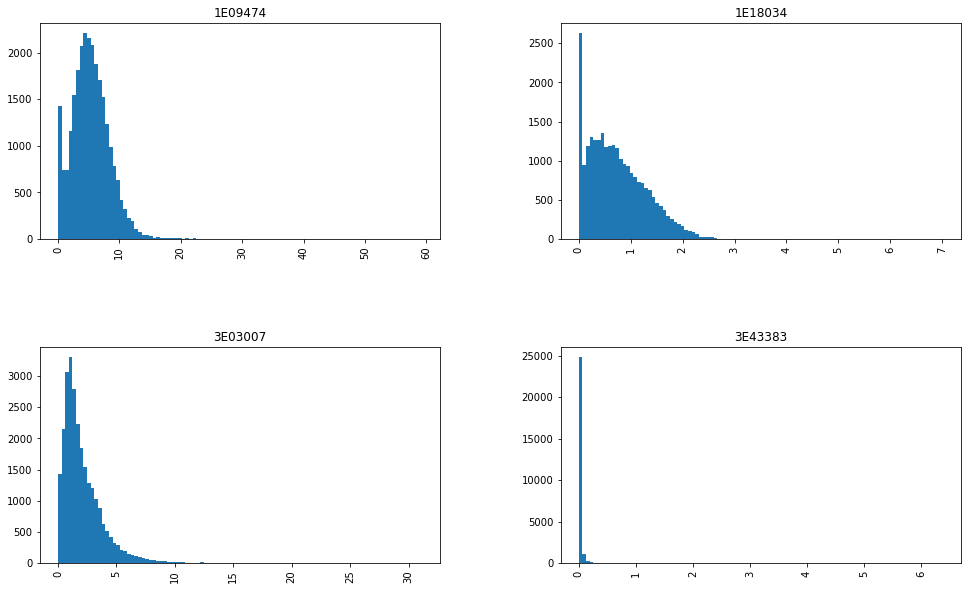

<IPython.core.display.Javascript object>

In [625]:
# Plotting histograms of readings by assetID
tmdata_sd = tmdata_sd.reset_index()
tmdata_sd["ImpReading_sd"].hist(by=tmdata_sd["AssetID"], figsize=(16, 10), bins=100)

### <font color='red'>Resampling the Asset Data</font>

In [626]:
tmdata_resample = tmdata_impute[["AssetID", "FullDate", "Reading_Imp"]].copy()
tmdata_resample = (
    tmdata_resample.set_index("FullDate").groupby("AssetID").resample("H").mean()
)

<IPython.core.display.Javascript object>

In [627]:
tmdata_resample

Reading_Imp
AssetID FullDate                        
1E09474 2019-01-01 00:00:00     36.15500
        2019-01-01 01:00:00     35.84500
        2019-01-01 02:00:00     37.18000
        2019-01-01 03:00:00     29.71000
        2019-01-01 04:00:00     34.90250
...                                  ...
3E43383 2021-12-31 19:00:00      2.10575
        2021-12-31 20:00:00      2.11675
        2021-12-31 21:00:00      2.10575
        2021-12-31 22:00:00      2.12225
        2021-12-31 23:00:00      2.09950

[104292 rows x 1 columns]

<IPython.core.display.Javascript object>

In [628]:
# Obtaining descriptive statistics of the 'Reading' by AssetID
tmdata_resample.groupby("AssetID")["Reading_Imp"].describe()

,count,mean,std,min,25%,50%,75%,max
AssetID,,,,,,,,
1E09474,26304.0,49.172386,19.200904,-0.090,34.739375,45.587500,63.4400,119.7100
1E18034,25380.0,3.379596,1.265181,0.000,2.450000,3.402500,4.1450,13.7225
3E03007,26304.0,32.341606,12.719200,-0.130,22.136339,29.145849,42.8300,59.8375
3E43383,26304.0,1.728432,2.053635,-0.012,0.917187,1.378000,1.9545,15.0120


<IPython.core.display.Javascript object>

In [629]:
tmdata_resample["Reading_Imp"].describe()

count    104292.000000
mean         21.817425
std          23.160794
min          -0.130000
25%           2.157688
50%          14.396045
75%          38.535625
max         119.710000
Name: Reading_Imp, dtype: float64

<IPython.core.display.Javascript object>

array([<AxesSubplot:xlabel='FullDate'>, <AxesSubplot:xlabel='FullDate'>,
       <AxesSubplot:xlabel='FullDate'>, <AxesSubplot:xlabel='FullDate'>],
      dtype=object)

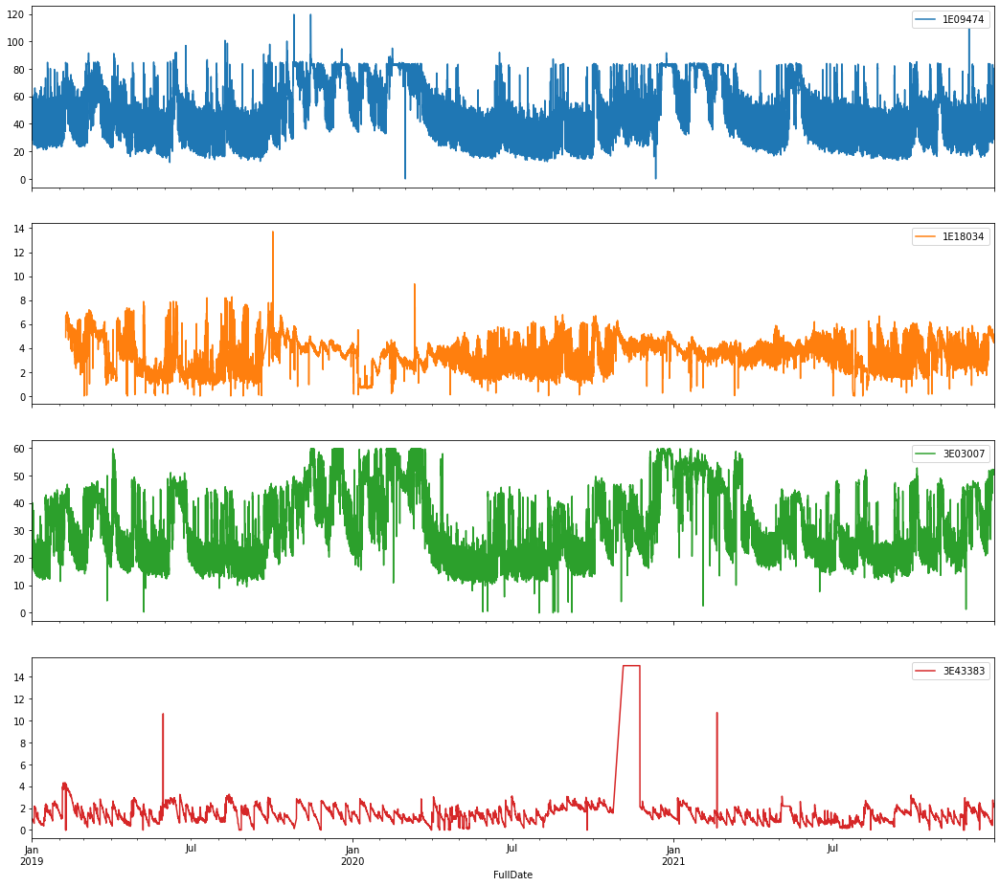

<IPython.core.display.Javascript object>

In [630]:
tmdata_resample.pivot_table(
    index="FullDate", columns="AssetID", values="Reading_Imp"
).plot(figsize=(18, 16), subplots=True)

In [631]:
tmdata_resample.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 104292 entries, ('1E09474', Timestamp('2019-01-01 00:00:00')) to ('3E43383', Timestamp('2021-12-31 23:00:00'))
Data columns (total 1 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Reading_Imp  104292 non-null  float64
dtypes: float64(1)
memory usage: 2.3+ MB


<IPython.core.display.Javascript object>

In [632]:
# Writing the data to a csv file =
tmdata_resample.to_csv("tmdata_resample.csv")

<IPython.core.display.Javascript object>

Creating a resampled df to merge with weather data

In [633]:
ExpTS2 = ExpTS.set_index(["AssetID", "FullDate"])
ExpTS2

Date      Time
AssetID FullDate                                 
1E09474 2019-01-01 00:00:00  2019-01-01  00:00:00
        2019-01-01 00:15:00  2019-01-01  00:15:00
        2019-01-01 00:30:00  2019-01-01  00:30:00
        2019-01-01 00:45:00  2019-01-01  00:45:00
        2019-01-01 01:00:00  2019-01-01  01:00:00
...                                 ...       ...
3E43383 2021-12-31 22:45:00  2021-12-31  22:45:00
        2021-12-31 23:00:00  2021-12-31  23:00:00
        2021-12-31 23:15:00  2021-12-31  23:15:00
        2021-12-31 23:30:00  2021-12-31  23:30:00
        2021-12-31 23:45:00  2021-12-31  23:45:00

[420864 rows x 2 columns]

<IPython.core.display.Javascript object>

In [634]:
# merge = ExpTS2.join(tmdata_resample)
tmdata_resample2 = pd.merge(ExpTS2, tmdata_resample, left_index=True, right_index=True)
tmdata_resample2.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 104292 entries, ('1E09474', Timestamp('2019-01-01 00:00:00')) to ('3E43383', Timestamp('2021-12-31 23:00:00'))
Data columns (total 3 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Date         104292 non-null  object 
 1   Time         104292 non-null  object 
 2   Reading_Imp  104292 non-null  float64
dtypes: float64(1), object(2)
memory usage: 3.9+ MB


<IPython.core.display.Javascript object>

In [635]:
tmdata_resample2

Date      Time  Reading_Imp
AssetID FullDate                                              
1E09474 2019-01-01 00:00:00  2019-01-01  00:00:00     36.15500
        2019-01-01 01:00:00  2019-01-01  01:00:00     35.84500
        2019-01-01 02:00:00  2019-01-01  02:00:00     37.18000
        2019-01-01 03:00:00  2019-01-01  03:00:00     29.71000
        2019-01-01 04:00:00  2019-01-01  04:00:00     34.90250
...                                 ...       ...          ...
3E43383 2021-12-31 19:00:00  2021-12-31  19:00:00      2.10575
        2021-12-31 20:00:00  2021-12-31  20:00:00      2.11675
        2021-12-31 21:00:00  2021-12-31  21:00:00      2.10575
        2021-12-31 22:00:00  2021-12-31  22:00:00      2.12225
        2021-12-31 23:00:00  2021-12-31  23:00:00      2.09950

[104292 rows x 3 columns]

<IPython.core.display.Javascript object>

In [636]:
tmdata_resample2.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 104292 entries, ('1E09474', Timestamp('2019-01-01 00:00:00')) to ('3E43383', Timestamp('2021-12-31 23:00:00'))
Data columns (total 3 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Date         104292 non-null  object 
 1   Time         104292 non-null  object 
 2   Reading_Imp  104292 non-null  float64
dtypes: float64(1), object(2)
memory usage: 3.9+ MB


<IPython.core.display.Javascript object>

## <font color='Dodgerblue'>5. Weather Data Preprocessing</font><a class='anchor' id='4'></a>

In [637]:
# #Reading weather data
# folder_name = 'ExternalData' #specifies the folder in which the raw data sets are available
# file_type = 'csv' #specifies the type of raw data files
# seperator =','  #specifies the data seperator in the file
# #The below for loop reads every file in the specified folder.
# #Then the files are concatenated and assigned to a data frame called 'Crimes'
# ext_data = pd.concat([pd.read_csv(f, sep=seperator) for f in glob.glob(folder_name + "/*."+file_type)],ignore_index=True)

<IPython.core.display.Javascript object>

In [638]:
# ext_data.head()

<IPython.core.display.Javascript object>

In [639]:
ext_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105216 entries, 0 to 105215
Data columns (total 36 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   time             105216 non-null  int64  
 1   tempC            105216 non-null  int64  
 2   tempF            105216 non-null  int64  
 3   windspeedMiles   105216 non-null  int64  
 4   windspeedKmph    105216 non-null  int64  
 5   winddirDegree    105216 non-null  int64  
 6   winddir16Point   105216 non-null  object 
 7   weatherCode      105216 non-null  int64  
 8   weatherIconUrl   105216 non-null  object 
 9   weatherDesc      105216 non-null  object 
 10  precipMM         105216 non-null  float64
 11  precipInches     105216 non-null  float64
 12  humidity         105216 non-null  int64  
 13  visibility       105216 non-null  int64  
 14  visibilityMiles  105216 non-null  int64  
 15  pressure         105216 non-null  int64  
 16  pressureInches   105216 non-null  int6

<IPython.core.display.Javascript object>

In [640]:
minutes = ext_data["time"].astype(str).str[-2:]
ext_data["mins"] = minutes
ext_data.head()

,time,tempC,tempF,windspeedMiles,windspeedKmph,winddirDegree,winddir16Point,weatherCode,weatherIconUrl,weatherDesc,...,FeelsLikeF,uvIndex,date,maxtempC,mintempC,avgtempC,totalSnow_cm,city,loc_coordinates,mins
0,0,5,42,5,9,268,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,37,1,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968",0
1,100,5,41,6,9,271,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,36,1,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968",00
2,200,5,41,6,10,273,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,36,1,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968",00
3,300,5,41,7,11,276,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,36,1,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968",00
4,400,5,41,7,11,278,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,36,1,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968",00


<IPython.core.display.Javascript object>

In [641]:
hour = ext_data["time"].astype(str).str[:-2]
ext_data["hour"] = hour
# ext_data['hour'] = ext_data['hour'].fillna(0)
# ext_data['hour'] = ext_data['hour'].replace(np.nan, 0)
ext_data["hour"] = ext_data["hour"].replace("", 0)
ext_data.head()

,time,tempC,tempF,windspeedMiles,windspeedKmph,winddirDegree,winddir16Point,weatherCode,weatherIconUrl,weatherDesc,...,uvIndex,date,maxtempC,mintempC,avgtempC,totalSnow_cm,city,loc_coordinates,mins,hour
0,0,5,42,5,9,268,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,1,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968",0,0
1,100,5,41,6,9,271,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,1,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968",00,1
2,200,5,41,6,10,273,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,1,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968",00,2
3,300,5,41,7,11,276,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,1,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968",00,3
4,400,5,41,7,11,278,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,1,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968",00,4


<IPython.core.display.Javascript object>

In [642]:
ext_data["Time"] = ext_data["hour"].astype(str) + ":" + ext_data["mins"].astype(str)
ext_data.head()

,time,tempC,tempF,windspeedMiles,windspeedKmph,winddirDegree,winddir16Point,weatherCode,weatherIconUrl,weatherDesc,...,date,maxtempC,mintempC,avgtempC,totalSnow_cm,city,loc_coordinates,mins,hour,Time
0,0,5,42,5,9,268,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968",0,0,0:0
1,100,5,41,6,9,271,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968",00,1,1:00
2,200,5,41,6,10,273,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968",00,2,2:00
3,300,5,41,7,11,276,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968",00,3,3:00
4,400,5,41,7,11,278,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968",00,4,4:00


<IPython.core.display.Javascript object>

In [643]:
ext_data["Time"] = pd.to_datetime(ext_data["Time"], errors="coerce")
ext_data.head()
# ext_data.dtypes

,time,tempC,tempF,windspeedMiles,windspeedKmph,winddirDegree,winddir16Point,weatherCode,weatherIconUrl,weatherDesc,...,date,maxtempC,mintempC,avgtempC,totalSnow_cm,city,loc_coordinates,mins,hour,Time
0,0,5,42,5,9,268,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968",0,0,NaT
1,100,5,41,6,9,271,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968",00,1,2022-11-02 01:00:00
2,200,5,41,6,10,273,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968",00,2,2022-11-02 02:00:00
3,300,5,41,7,11,276,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968",00,3,2022-11-02 03:00:00
4,400,5,41,7,11,278,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968",00,4,2022-11-02 04:00:00


<IPython.core.display.Javascript object>

In [644]:
ext_data["Date_New"] = (ext_data["Time"]).dt.date
ext_data["Time_New"] = (ext_data["Time"]).dt.time
ext_data.head()

,time,tempC,tempF,windspeedMiles,windspeedKmph,winddirDegree,winddir16Point,weatherCode,weatherIconUrl,weatherDesc,...,mintempC,avgtempC,totalSnow_cm,city,loc_coordinates,mins,hour,Time,Date_New,Time_New
0,0,5,42,5,9,268,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,4,7,0.0,Monmouth,"51.803499,-2.7034968",0,0,NaT,NaT,NaT
1,100,5,41,6,9,271,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,4,7,0.0,Monmouth,"51.803499,-2.7034968",00,1,2022-11-02 01:00:00,2022-11-02,01:00:00
2,200,5,41,6,10,273,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,4,7,0.0,Monmouth,"51.803499,-2.7034968",00,2,2022-11-02 02:00:00,2022-11-02,02:00:00
3,300,5,41,7,11,276,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,4,7,0.0,Monmouth,"51.803499,-2.7034968",00,3,2022-11-02 03:00:00,2022-11-02,03:00:00
4,400,5,41,7,11,278,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,4,7,0.0,Monmouth,"51.803499,-2.7034968",00,4,2022-11-02 04:00:00,2022-11-02,04:00:00


<IPython.core.display.Javascript object>

In [645]:
ext_data.drop(["Time", "Date_New"], axis=1, inplace=True)
ext_data.rename(columns={"Time_New": "Time", "date": "Date"}, inplace=True)
ext_data["Time"] = ext_data["Time"].fillna("00:00:00")
ext_data.head()

,time,tempC,tempF,windspeedMiles,windspeedKmph,winddirDegree,winddir16Point,weatherCode,weatherIconUrl,weatherDesc,...,Date,maxtempC,mintempC,avgtempC,totalSnow_cm,city,loc_coordinates,mins,hour,Time
0,0,5,42,5,9,268,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968",0,0,00:00:00
1,100,5,41,6,9,271,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968",00,1,01:00:00
2,200,5,41,6,10,273,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968",00,2,02:00:00
3,300,5,41,7,11,276,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968",00,3,03:00:00
4,400,5,41,7,11,278,W,113,[{'value': 'http://cdn.worldweatheronline.com/...,[{'value': 'Clear'}],...,2019-01-01,9,4,7,0.0,Monmouth,"51.803499,-2.7034968",00,4,04:00:00


<IPython.core.display.Javascript object>

In [646]:
ext_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105216 entries, 0 to 105215
Data columns (total 39 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   time             105216 non-null  int64  
 1   tempC            105216 non-null  int64  
 2   tempF            105216 non-null  int64  
 3   windspeedMiles   105216 non-null  int64  
 4   windspeedKmph    105216 non-null  int64  
 5   winddirDegree    105216 non-null  int64  
 6   winddir16Point   105216 non-null  object 
 7   weatherCode      105216 non-null  int64  
 8   weatherIconUrl   105216 non-null  object 
 9   weatherDesc      105216 non-null  object 
 10  precipMM         105216 non-null  float64
 11  precipInches     105216 non-null  float64
 12  humidity         105216 non-null  int64  
 13  visibility       105216 non-null  int64  
 14  visibilityMiles  105216 non-null  int64  
 15  pressure         105216 non-null  int64  
 16  pressureInches   105216 non-null  int6

<IPython.core.display.Javascript object>

In [647]:
ext_data["Date"] = pd.to_datetime(ext_data["Date"], format="%Y-%m-%d")
ext_data["Date"].dtypes

dtype('<M8[ns]')

<IPython.core.display.Javascript object>

In [648]:
ext_data["Time"] = pd.to_datetime(ext_data["Time"], format="%H:%M:%S")
ext_data["Time"].dtypes

dtype('<M8[ns]')

<IPython.core.display.Javascript object>

In [649]:
ext_data[["Date", "Time"]]

,Date,Time
0,2019-01-01,1900-01-01 00:00:00
1,2019-01-01,1900-01-01 01:00:00
2,2019-01-01,1900-01-01 02:00:00
3,2019-01-01,1900-01-01 03:00:00
4,2019-01-01,1900-01-01 04:00:00
...,...,...
105211,2021-12-31,1900-01-01 19:00:00
105212,2021-12-31,1900-01-01 20:00:00
105213,2021-12-31,1900-01-01 21:00:00
105214,2021-12-31,1900-01-01 22:00:00


<IPython.core.display.Javascript object>

In [650]:
ext_data["Time_New"] = (ext_data["Time"]).dt.time
ext_data[["Date", "Time_New"]]

,Date,Time_New
0,2019-01-01,00:00:00
1,2019-01-01,01:00:00
2,2019-01-01,02:00:00
3,2019-01-01,03:00:00
4,2019-01-01,04:00:00
...,...,...
105211,2021-12-31,19:00:00
105212,2021-12-31,20:00:00
105213,2021-12-31,21:00:00
105214,2021-12-31,22:00:00


<IPython.core.display.Javascript object>

In [651]:
ext_data_clean = ext_data.drop(
    [
        "time",
        "Time",
        "tempF",
        "windspeedMiles",
        "winddir16Point",
        "weatherCode",
        "weatherDesc",
        "city",
        "weatherIconUrl",
        "precipInches",
        "visibilityMiles",
        "pressureInches",
        "HeatIndexF",
        "DewPointF",
        "WindChillF",
        "WindGustMiles",
        "FeelsLikeF",
        "mins",
        "hour",
    ],
    axis=1,
)
ext_data_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105216 entries, 0 to 105215
Data columns (total 21 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   tempC            105216 non-null  int64         
 1   windspeedKmph    105216 non-null  int64         
 2   winddirDegree    105216 non-null  int64         
 3   precipMM         105216 non-null  float64       
 4   humidity         105216 non-null  int64         
 5   visibility       105216 non-null  int64         
 6   pressure         105216 non-null  int64         
 7   cloudcover       105216 non-null  int64         
 8   HeatIndexC       105216 non-null  int64         
 9   DewPointC        105216 non-null  int64         
 10  WindChillC       105216 non-null  int64         
 11  WindGustKmph     105216 non-null  int64         
 12  FeelsLikeC       105216 non-null  int64         
 13  uvIndex          105216 non-null  int64         
 14  Date             105

<IPython.core.display.Javascript object>

In [652]:
ext_data_clean.rename(columns={"Time_New": "Time"}, inplace=True)
ext_data_clean.head()

,tempC,windspeedKmph,winddirDegree,precipMM,humidity,visibility,pressure,cloudcover,HeatIndexC,DewPointC,...,WindGustKmph,FeelsLikeC,uvIndex,Date,maxtempC,mintempC,avgtempC,totalSnow_cm,loc_coordinates,Time
0,5,9,268,0.0,93,10,1036,24,5,4,...,17,3,1,2019-01-01,9,4,7,0.0,"51.803499,-2.7034968",00:00:00
1,5,9,271,0.0,93,10,1036,24,5,4,...,18,2,1,2019-01-01,9,4,7,0.0,"51.803499,-2.7034968",01:00:00
2,5,10,273,0.0,93,10,1035,24,5,4,...,20,2,1,2019-01-01,9,4,7,0.0,"51.803499,-2.7034968",02:00:00
3,5,11,276,0.0,93,10,1035,24,5,4,...,22,2,1,2019-01-01,9,4,7,0.0,"51.803499,-2.7034968",03:00:00
4,5,11,278,0.0,93,10,1035,24,5,4,...,22,2,1,2019-01-01,9,4,7,0.0,"51.803499,-2.7034968",04:00:00


<IPython.core.display.Javascript object>

In [653]:
ext_data_clean.to_csv("extdatacheck.csv", index=False)

<IPython.core.display.Javascript object>

## <font color='red'> Weather Data Merge with Location to get Asset ID</font>

Reading location data

In [654]:
# Merging the location data with weather data
# filepath = 'AssetsData/'
locations = pd.read_csv("Locations.csv")
locations.head()

,Asset,XCoord,YCoord,Lat,Long
0,3E43383,276764.0713,348024.6563,53.015288,-3.838449
1,3E03007,312114.5551,359245.8631,53.123106,-3.314760
2,1E09474,351589.4981,211885.1171,51.803499,-2.703497
3,1E18034,353571.8231,200572.0041,51.701958,-2.673240
4,2E05219,256302.1661,212333.1111,51.791141,-4.084948


<IPython.core.display.Javascript object>

In [655]:
locations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Asset   5 non-null      object 
 1   XCoord  5 non-null      float64
 2   YCoord  5 non-null      float64
 3   Lat     5 non-null      float64
 4   Long    5 non-null      float64
dtypes: float64(4), object(1)
memory usage: 328.0+ bytes


<IPython.core.display.Javascript object>

In [656]:
locations["loc_coordinates"] = (
    locations["Lat"].astype(str) + "," + locations["Long"].astype(str)
)
locations.head()

,Asset,XCoord,YCoord,Lat,Long,loc_coordinates
0,3E43383,276764.0713,348024.6563,53.015288,-3.838449,"53.015288,-3.8384493"
1,3E03007,312114.5551,359245.8631,53.123106,-3.314760,"53.123106,-3.3147597"
2,1E09474,351589.4981,211885.1171,51.803499,-2.703497,"51.803499,-2.7034968"
3,1E18034,353571.8231,200572.0041,51.701958,-2.673240,"51.701958,-2.6732399"
4,2E05219,256302.1661,212333.1111,51.791141,-4.084948,"51.791141,-4.0849477"


<IPython.core.display.Javascript object>

In [657]:
locations.rename(columns={"Asset": "AssetID"}, inplace=True)
locations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   AssetID          5 non-null      object 
 1   XCoord           5 non-null      float64
 2   YCoord           5 non-null      float64
 3   Lat              5 non-null      float64
 4   Long             5 non-null      float64
 5   loc_coordinates  5 non-null      object 
dtypes: float64(4), object(2)
memory usage: 368.0+ bytes


<IPython.core.display.Javascript object>

In [658]:
extdata_merge = pd.merge(ext_data_clean, locations, on=["loc_coordinates"], how="left")
extdata_merge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 105216 entries, 0 to 105215
Data columns (total 26 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   tempC            105216 non-null  int64         
 1   windspeedKmph    105216 non-null  int64         
 2   winddirDegree    105216 non-null  int64         
 3   precipMM         105216 non-null  float64       
 4   humidity         105216 non-null  int64         
 5   visibility       105216 non-null  int64         
 6   pressure         105216 non-null  int64         
 7   cloudcover       105216 non-null  int64         
 8   HeatIndexC       105216 non-null  int64         
 9   DewPointC        105216 non-null  int64         
 10  WindChillC       105216 non-null  int64         
 11  WindGustKmph     105216 non-null  int64         
 12  FeelsLikeC       105216 non-null  int64         
 13  uvIndex          105216 non-null  int64         
 14  Date             105

<IPython.core.display.Javascript object>

In [659]:
extdata_merge.drop(
    ["XCoord", "YCoord", "Lat", "Long", "loc_coordinates"], axis=1, inplace=True
)
extdata_merge.head()

,tempC,windspeedKmph,winddirDegree,precipMM,humidity,visibility,pressure,cloudcover,HeatIndexC,DewPointC,...,WindGustKmph,FeelsLikeC,uvIndex,Date,maxtempC,mintempC,avgtempC,totalSnow_cm,Time,AssetID
0,5,9,268,0.0,93,10,1036,24,5,4,...,17,3,1,2019-01-01,9,4,7,0.0,00:00:00,1E09474
1,5,9,271,0.0,93,10,1036,24,5,4,...,18,2,1,2019-01-01,9,4,7,0.0,01:00:00,1E09474
2,5,10,273,0.0,93,10,1035,24,5,4,...,20,2,1,2019-01-01,9,4,7,0.0,02:00:00,1E09474
3,5,11,276,0.0,93,10,1035,24,5,4,...,22,2,1,2019-01-01,9,4,7,0.0,03:00:00,1E09474
4,5,11,278,0.0,93,10,1035,24,5,4,...,22,2,1,2019-01-01,9,4,7,0.0,04:00:00,1E09474


<IPython.core.display.Javascript object>

In [660]:
extdata_merge["OriginalWeatherRecord"] = "Y"
extdata_merge.head()

,tempC,windspeedKmph,winddirDegree,precipMM,humidity,visibility,pressure,cloudcover,HeatIndexC,DewPointC,...,FeelsLikeC,uvIndex,Date,maxtempC,mintempC,avgtempC,totalSnow_cm,Time,AssetID,OriginalWeatherRecord
0,5,9,268,0.0,93,10,1036,24,5,4,...,3,1,2019-01-01,9,4,7,0.0,00:00:00,1E09474,Y
1,5,9,271,0.0,93,10,1036,24,5,4,...,2,1,2019-01-01,9,4,7,0.0,01:00:00,1E09474,Y
2,5,10,273,0.0,93,10,1035,24,5,4,...,2,1,2019-01-01,9,4,7,0.0,02:00:00,1E09474,Y
3,5,11,276,0.0,93,10,1035,24,5,4,...,2,1,2019-01-01,9,4,7,0.0,03:00:00,1E09474,Y
4,5,11,278,0.0,93,10,1035,24,5,4,...,2,1,2019-01-01,9,4,7,0.0,04:00:00,1E09474,Y


<IPython.core.display.Javascript object>

In [661]:
extdata_merge[["Date", "Time"]]

,Date,Time
0,2019-01-01,00:00:00
1,2019-01-01,01:00:00
2,2019-01-01,02:00:00
3,2019-01-01,03:00:00
4,2019-01-01,04:00:00
...,...,...
105211,2021-12-31,19:00:00
105212,2021-12-31,20:00:00
105213,2021-12-31,21:00:00
105214,2021-12-31,22:00:00


<IPython.core.display.Javascript object>

In [662]:
# tm_data = tm_data.sort_values(by=["AssetID", "FullDate"])

# Check time intervals
extdata_merge2 = extdata_merge[
    [
        "AssetID",
        "Date",
        "Time",
        "tempC",
        "windspeedKmph",
        "winddirDegree",
        "precipMM",
        "humidity",
        "visibility",
        "pressure",
        "cloudcover",
        "HeatIndexC",
        "DewPointC",
        "WindChillC",
        "WindGustKmph",
        "FeelsLikeC",
        "uvIndex",
        "maxtempC",
        "mintempC",
        "avgtempC",
        "totalSnow_cm",
    ]
].copy()
extdata_merge2.set_index(["AssetID", "Date", "Time"], inplace=True)
extdata_merge2 = extdata_merge2.diff()
extdata_merge2.groupby("AssetID").describe()

tempC                                              windspeedKmph  \
           count      mean       std  min  25%  50%  75%  max         count   
AssetID                                                                       
1E09474  26303.0  0.000266  0.865641 -4.0 -1.0  0.0  0.0  5.0       26303.0   
1E18034  26304.0  0.000000  0.857971 -5.0 -1.0  0.0  0.0  4.0       26304.0   
3E03007  26304.0  0.000000  0.802375 -7.0  0.0  0.0  0.0  5.0       26304.0   
3E43383  26304.0 -0.000076  0.800667 -6.0  0.0  0.0  0.0  5.0       26304.0   

                   ... avgtempC      totalSnow_cm                          \
             mean  ...      75%  max        count          mean       std   
AssetID            ...                                                      
1E09474  0.000380  ...      0.0  8.0      26303.0 -1.899404e-20  0.145829   
1E18034  0.000000  ...      0.0  8.0      26304.0 -6.331108e-21  0.075426   
3E03007 -0.000152  ...      0.0  7.0      26304.0 -6.753181e-20  0.485121   
3E43383 -0.000076  ...      0.0  7.0      26304.0  6.753181e-20  0.334139   

                                    
          min  25%  50%  75%   max  
AssetID                             
1E09474 -13.4  0.0  0.0  0.0  13.2  
1E18034  -4.8  0.0  0.0  0.0   4.8  
3E03007 -45.0  0.0  0.0  0.0  45.3  
3E43383 -16.5  0.0  0.0  0.0  12.8  

[4 rows x 144 columns]

<IPython.core.display.Javascript object>

Asset ID = 1E09474


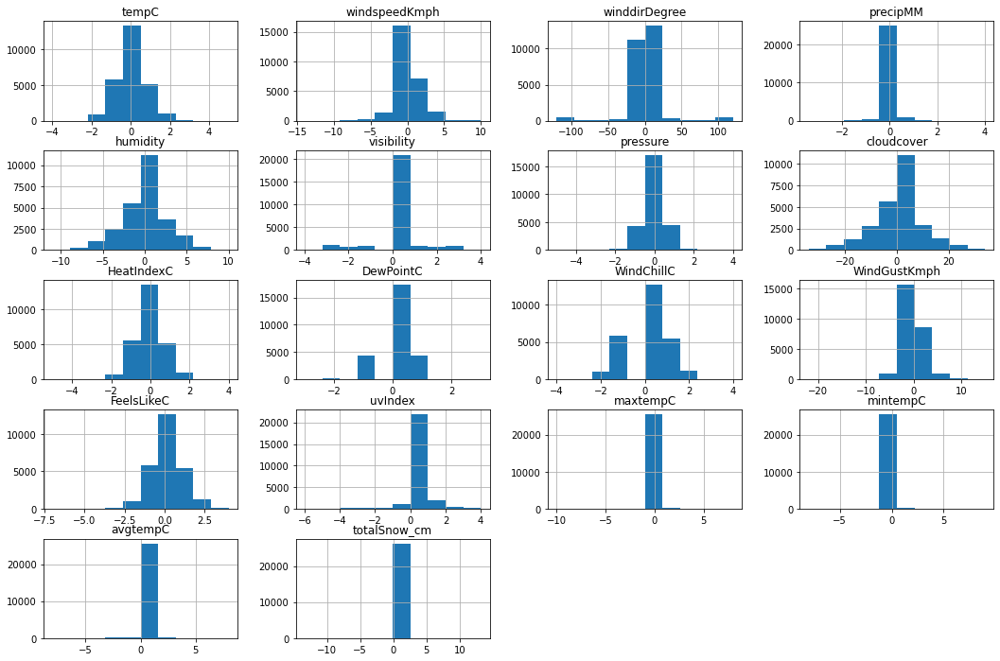

Asset ID = 1E18034


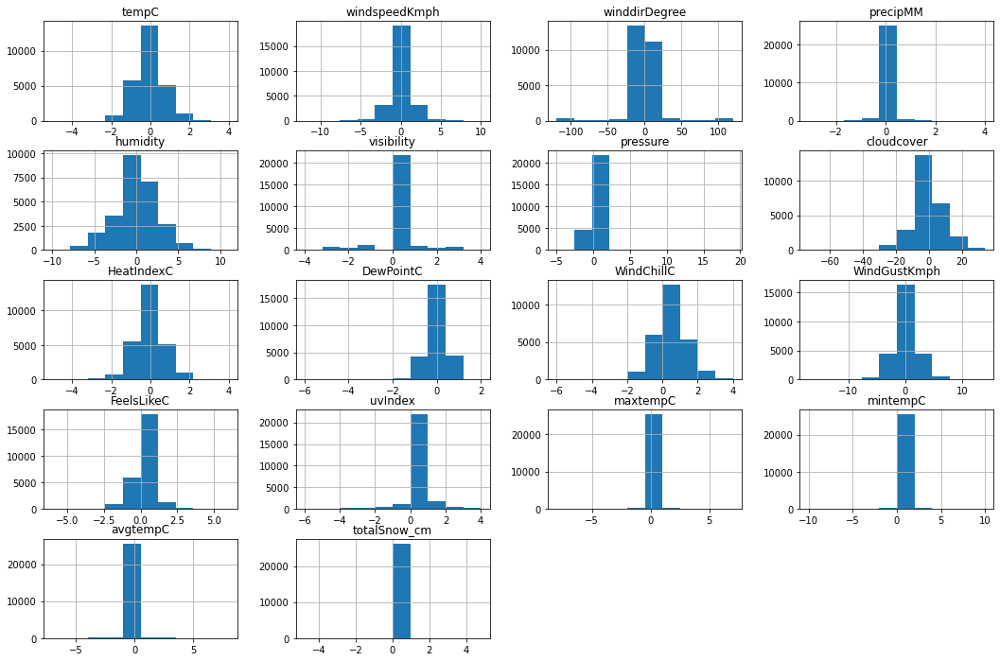

Asset ID = 3E03007


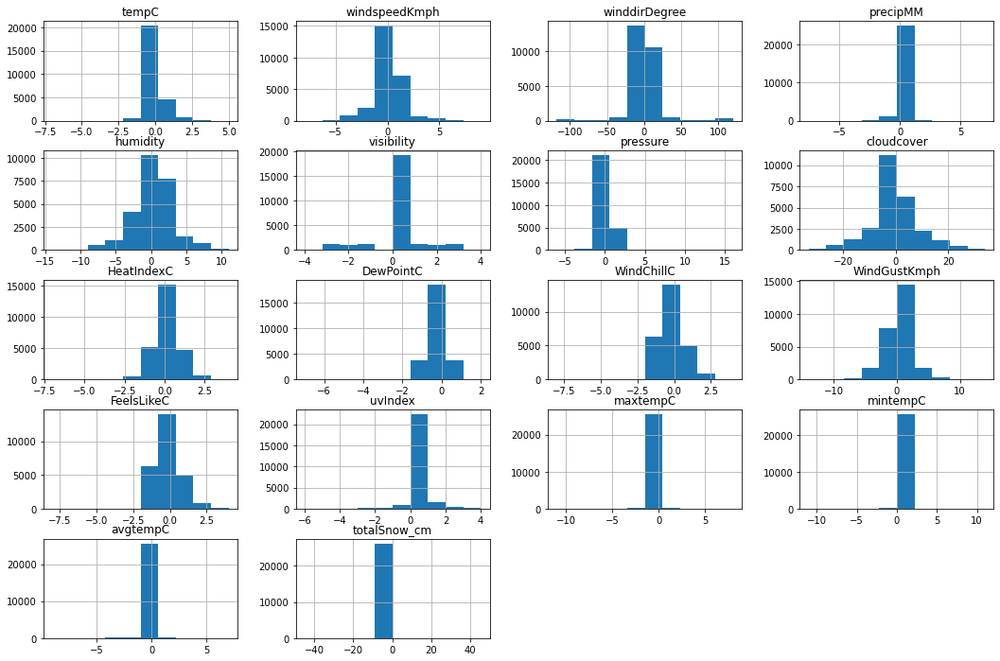

Asset ID = 3E43383


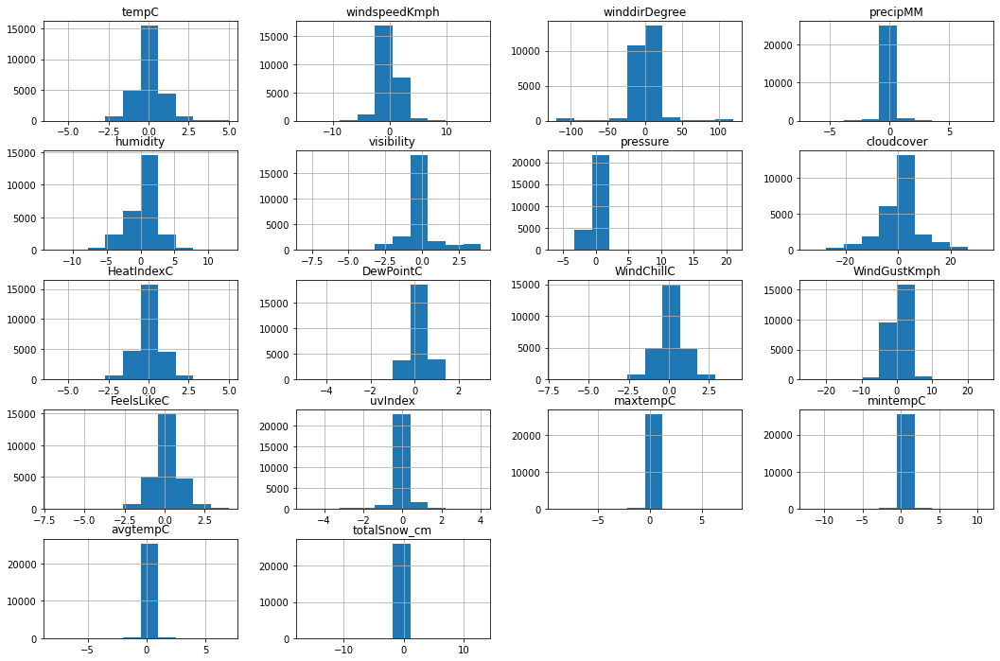

<IPython.core.display.Javascript object>

In [663]:
extdata_merge2 = extdata_merge2.reset_index()
extdata_merge2.drop(["Date", "Time"], axis=1, inplace=True)
for i in extdata_merge2["AssetID"].unique():
    #     plt.suptitle(i, ha="center", fontsize="large")
    print("Asset ID =", i)
    ax = extdata_merge2.loc[extdata_merge2["AssetID"] == i].hist(figsize=(18, 12))
    plt.show()

array([[<AxesSubplot:title={'center':'1E09474'}>,
        <AxesSubplot:title={'center':'1E18034'}>],
       [<AxesSubplot:title={'center':'3E03007'}>,
        <AxesSubplot:title={'center':'3E43383'}>]], dtype=object)

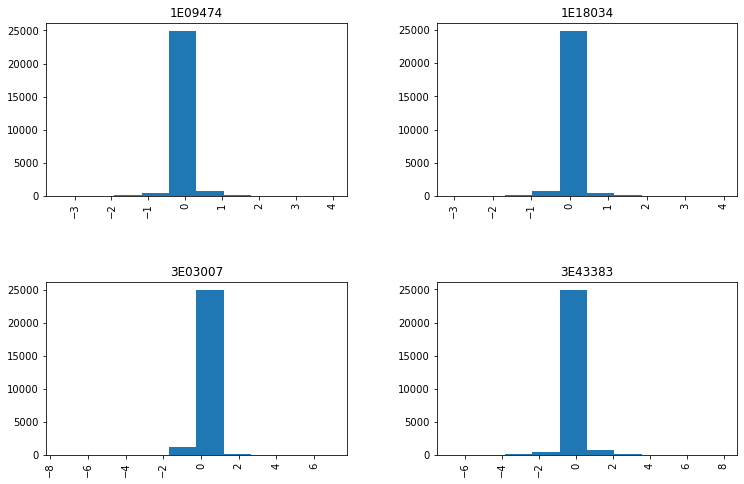

<IPython.core.display.Javascript object>

In [664]:
# Plotting histograms of readings by assetID
extdata_merge2["precipMM"].hist(by=extdata_merge2["AssetID"], figsize=(12, 8))

array([[<AxesSubplot:title={'center':'1E09474'}>,
        <AxesSubplot:title={'center':'1E18034'}>],
       [<AxesSubplot:title={'center':'3E03007'}>,
        <AxesSubplot:title={'center':'3E43383'}>]], dtype=object)

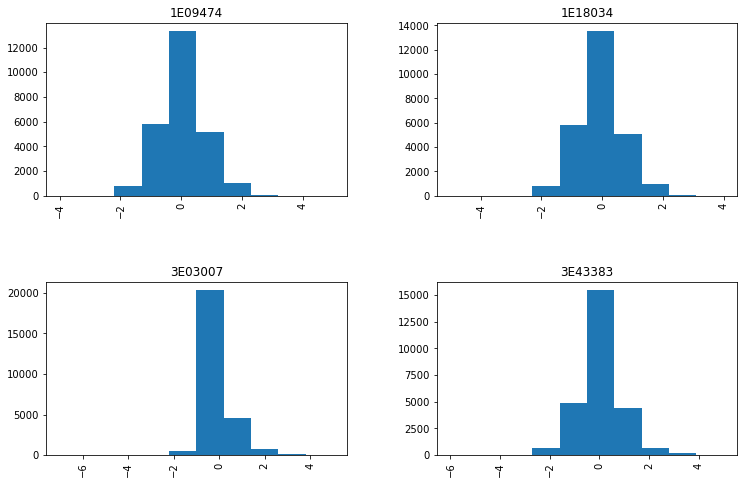

<IPython.core.display.Javascript object>

In [665]:
# Plotting histograms of readings by assetID
extdata_merge2["tempC"].hist(by=extdata_merge2["AssetID"], figsize=(12, 8))

## <font color='red'> Weather Data - Feature Engineering I </font>

In [666]:
# Rainfall lag features

extdata_merge["RF_lag1"] = (
    extdata_merge["precipMM"]
    .shift(1)
    .where(extdata_merge.AssetID.eq(extdata_merge.AssetID.shift(1)))
)
extdata_merge["RF_lag2"] = (
    extdata_merge["precipMM"]
    .shift(2)
    .where(extdata_merge.AssetID.eq(extdata_merge.AssetID.shift(2)))
)
extdata_merge["RF_lag3"] = (
    extdata_merge["precipMM"]
    .shift(3)
    .where(extdata_merge.AssetID.eq(extdata_merge.AssetID.shift(3)))
)
extdata_merge["RF_lag4"] = (
    extdata_merge["precipMM"]
    .shift(4)
    .where(extdata_merge.AssetID.eq(extdata_merge.AssetID.shift(4)))
)
extdata_merge["RF_lag5"] = (
    extdata_merge["precipMM"]
    .shift(5)
    .where(extdata_merge.AssetID.eq(extdata_merge.AssetID.shift(5)))
)
extdata_merge["RF_lag6"] = (
    extdata_merge["precipMM"]
    .shift(6)
    .where(extdata_merge.AssetID.eq(extdata_merge.AssetID.shift(6)))
)
extdata_merge["RF_lag7"] = (
    extdata_merge["precipMM"]
    .shift(7)
    .where(extdata_merge.AssetID.eq(extdata_merge.AssetID.shift(7)))
)
extdata_merge["RF_lag8"] = (
    extdata_merge["precipMM"]
    .shift(8)
    .where(extdata_merge.AssetID.eq(extdata_merge.AssetID.shift(8)))
)
extdata_merge["RF_lag9"] = (
    extdata_merge["precipMM"]
    .shift(9)
    .where(extdata_merge.AssetID.eq(extdata_merge.AssetID.shift(9)))
)
extdata_merge["RF_lag10"] = (
    extdata_merge["precipMM"]
    .shift(10)
    .where(extdata_merge.AssetID.eq(extdata_merge.AssetID.shift(10)))
)
extdata_merge["RF_lag11"] = (
    extdata_merge["precipMM"]
    .shift(11)
    .where(extdata_merge.AssetID.eq(extdata_merge.AssetID.shift(11)))
)
extdata_merge["RF_lag12"] = (
    extdata_merge["precipMM"]
    .shift(12)
    .where(extdata_merge.AssetID.eq(extdata_merge.AssetID.shift(12)))
)
extdata_merge["RF_lag13"] = (
    extdata_merge["precipMM"]
    .shift(13)
    .where(extdata_merge.AssetID.eq(extdata_merge.AssetID.shift(13)))
)
extdata_merge["RF_lag14"] = (
    extdata_merge["precipMM"]
    .shift(14)
    .where(extdata_merge.AssetID.eq(extdata_merge.AssetID.shift(14)))
)
extdata_merge["RF_lag15"] = (
    extdata_merge["precipMM"]
    .shift(15)
    .where(extdata_merge.AssetID.eq(extdata_merge.AssetID.shift(15)))
)
extdata_merge["RF_lag16"] = (
    extdata_merge["precipMM"]
    .shift(16)
    .where(extdata_merge.AssetID.eq(extdata_merge.AssetID.shift(16)))
)
extdata_merge["RF_lag17"] = (
    extdata_merge["precipMM"]
    .shift(17)
    .where(extdata_merge.AssetID.eq(extdata_merge.AssetID.shift(17)))
)
extdata_merge["RF_lag18"] = (
    extdata_merge["precipMM"]
    .shift(18)
    .where(extdata_merge.AssetID.eq(extdata_merge.AssetID.shift(18)))
)
extdata_merge["RF_lag19"] = (
    extdata_merge["precipMM"]
    .shift(19)
    .where(extdata_merge.AssetID.eq(extdata_merge.AssetID.shift(19)))
)
extdata_merge["RF_lag20"] = (
    extdata_merge["precipMM"]
    .shift(20)
    .where(extdata_merge.AssetID.eq(extdata_merge.AssetID.shift(20)))
)
extdata_merge["RF_lag21"] = (
    extdata_merge["precipMM"]
    .shift(21)
    .where(extdata_merge.AssetID.eq(extdata_merge.AssetID.shift(21)))
)
extdata_merge["RF_lag22"] = (
    extdata_merge["precipMM"]
    .shift(22)
    .where(extdata_merge.AssetID.eq(extdata_merge.AssetID.shift(22)))
)
extdata_merge["RF_lag23"] = (
    extdata_merge["precipMM"]
    .shift(23)
    .where(extdata_merge.AssetID.eq(extdata_merge.AssetID.shift(23)))
)

<IPython.core.display.Javascript object>

In [667]:
extdata_merge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 105216 entries, 0 to 105215
Data columns (total 45 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   tempC                  105216 non-null  int64         
 1   windspeedKmph          105216 non-null  int64         
 2   winddirDegree          105216 non-null  int64         
 3   precipMM               105216 non-null  float64       
 4   humidity               105216 non-null  int64         
 5   visibility             105216 non-null  int64         
 6   pressure               105216 non-null  int64         
 7   cloudcover             105216 non-null  int64         
 8   HeatIndexC             105216 non-null  int64         
 9   DewPointC              105216 non-null  int64         
 10  WindChillC             105216 non-null  int64         
 11  WindGustKmph           105216 non-null  int64         
 12  FeelsLikeC             105216 non-null  int6

<IPython.core.display.Javascript object>

In [668]:
extdata_merge

,tempC,windspeedKmph,winddirDegree,precipMM,humidity,visibility,pressure,cloudcover,HeatIndexC,DewPointC,...,RF_lag14,RF_lag15,RF_lag16,RF_lag17,RF_lag18,RF_lag19,RF_lag20,RF_lag21,RF_lag22,RF_lag23
0,5,9,268,0.0,93,10,1036,24,5,4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,5,9,271,0.0,93,10,1036,24,5,4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,5,10,273,0.0,93,10,1035,24,5,4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5,11,276,0.0,93,10,1035,24,5,4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,11,278,0.0,93,10,1035,24,5,4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105211,10,19,203,0.0,95,10,1016,99,10,9,...,0.0,0.0,0.0,0.0,0.0,0.1,0.1,1.2,2.4,1.8
105212,10,19,200,0.0,94,10,1016,99,10,9,...,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.1,1.2,2.4
105213,10,18,197,0.0,92,10,1016,98,10,9,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.1,1.2
105214,10,16,186,0.0,94,7,1015,99,10,9,...,1.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.1


<IPython.core.display.Javascript object>

## <font color='orange'> [for 15-min]Telemetry Data and Weather Data Merge before Part2-Weather Data Feature Engineering</font>

In [669]:
tmdata_impute["Date"] = pd.to_datetime(tmdata_impute["Date"], format="%Y-%m-%d")
# tmdata_impute['Date'] = pd.to_datetime(tmdata_impute['Date'], format = '%Y-%m-%d %H:%M:%S')
tmdata_impute["Date"].dtypes

dtype('<M8[ns]')

<IPython.core.display.Javascript object>

In [670]:
tmdata_impute["Time"] = pd.to_datetime(tmdata_impute["Time"], format="%H:%M:%S")
tmdata_impute["Time"].dtypes

dtype('<M8[ns]')

<IPython.core.display.Javascript object>

In [671]:
extdata_merge["Time"] = pd.to_datetime(extdata_merge["Time"], format="%H:%M:%S")
extdata_merge["Time"].dtypes

dtype('<M8[ns]')

<IPython.core.display.Javascript object>

In [672]:
full_df_wofe = pd.merge(
    tmdata_impute, extdata_merge, on=["AssetID", "Date", "Time"], how="left"
)
full_df_wofe.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 417166 entries, 0 to 417165
Data columns (total 58 columns):
 #   Column                 Non-Null Count   Dtype          
---  ------                 --------------   -----          
 0   AssetID                417166 non-null  object         
 1   FullDate               417166 non-null  datetime64[ns] 
 2   Date                   417166 non-null  datetime64[ns] 
 3   Time                   417166 non-null  datetime64[ns] 
 4   snoIdentifier          414900 non-null  float64        
 5   tidIdentifier          414900 non-null  object         
 6   Reading                413965 non-null  float64        
 7   YM                     414900 non-null  object         
 8   Year                   414900 non-null  object         
 9   Month                  414900 non-null  object         
 10  delta_premerge         414899 non-null  timedelta64[ns]
 11  delta_pm_mins          414899 non-null  float64        
 12  BST_Y                  417166 

<IPython.core.display.Javascript object>

In [673]:
# replacing na values in 'OriginalRecord' with N
full_df_wofe["OriginalWeatherRecord"].fillna("N", inplace=True)

<IPython.core.display.Javascript object>

In [674]:
full_df_wofe["OriginalWeatherRecord"].value_counts()

N    312875
Y    104291
Name: OriginalWeatherRecord, dtype: int64

<IPython.core.display.Javascript object>

In [675]:
full_df_wofe["OriginalWeatherRecord"] = full_df_wofe["OriginalWeatherRecord"].map(
    {"Y": 1, "N": 0}
)

<IPython.core.display.Javascript object>

In [676]:
full_df_wofe["OriginalWeatherRecord"].value_counts()

0    312875
1    104291
Name: OriginalWeatherRecord, dtype: int64

<IPython.core.display.Javascript object>

In [677]:
full_df_wofe.to_csv("fulldf_wo_weatherfeatures.csv", index=False)

<IPython.core.display.Javascript object>

## <font color='orange'> [for 15-min]Weather Data - Interpolate for missing 15-min readings </font>

In [678]:
cols = [
    "tempC",
    "windspeedKmph",
    "winddirDegree",
    "precipMM",
    "humidity",
    "visibility",
    "pressure",
    "cloudcover",
    "HeatIndexC",
    "DewPointC",
    "WindChillC",
    "WindGustKmph",
    "FeelsLikeC",
    "uvIndex",
    "maxtempC",
    "mintempC",
    "avgtempC",
    "totalSnow_cm",
    "RF_lag1",
    "RF_lag2",
    "RF_lag3",
    "RF_lag4",
    "RF_lag5",
    "RF_lag6",
    "RF_lag7",
    "RF_lag8",
    "RF_lag9",
    "RF_lag10",
    "RF_lag11",
    "RF_lag12",
    "RF_lag13",
    "RF_lag14",
    "RF_lag15",
    "RF_lag16",
    "RF_lag17",
    "RF_lag18",
    "RF_lag19",
    "RF_lag20",
    "RF_lag21",
    "RF_lag22",
    "RF_lag23",
]

fulldf_weatherimpute1 = full_df_wofe[full_df_wofe["AssetID"] == "1E09474"].copy()
fulldf_weatherimpute1.loc[:, cols] = fulldf_weatherimpute1.loc[:, cols].bfill().ffill()
fulldf_weatherimpute1.head()

,AssetID,FullDate,Date,Time,snoIdentifier,tidIdentifier,Reading,YM,Year,Month,...,RF_lag14,RF_lag15,RF_lag16,RF_lag17,RF_lag18,RF_lag19,RF_lag20,RF_lag21,RF_lag22,RF_lag23
0,1E09474,2019-01-01 00:00:00,2019-01-01,1900-01-01 00:00:00,1.0,E09474,42.10,2019-01,2019,01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1E09474,2019-01-01 00:15:00,2019-01-01,1900-01-01 00:15:00,1.0,E09474,32.13,2019-01,2019,01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1E09474,2019-01-01 00:30:00,2019-01-01,1900-01-01 00:30:00,1.0,E09474,30.31,2019-01,2019,01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1E09474,2019-01-01 00:45:00,2019-01-01,1900-01-01 00:45:00,1.0,E09474,40.08,2019-01,2019,01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1E09474,2019-01-01 01:00:00,2019-01-01,1900-01-01 01:00:00,1.0,E09474,34.63,2019-01,2019,01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<IPython.core.display.Javascript object>

In [679]:
fulldf_weatherimpute1.to_csv("fulldf_weatherimpute1check.csv", index=False)

<IPython.core.display.Javascript object>

In [680]:
fulldf_weatherimpute1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 105216 entries, 0 to 105215
Data columns (total 58 columns):
 #   Column                 Non-Null Count   Dtype          
---  ------                 --------------   -----          
 0   AssetID                105216 non-null  object         
 1   FullDate               105216 non-null  datetime64[ns] 
 2   Date                   105216 non-null  datetime64[ns] 
 3   Time                   105216 non-null  datetime64[ns] 
 4   snoIdentifier          105212 non-null  float64        
 5   tidIdentifier          105212 non-null  object         
 6   Reading                105207 non-null  float64        
 7   YM                     105212 non-null  object         
 8   Year                   105212 non-null  object         
 9   Month                  105212 non-null  object         
 10  delta_premerge         105211 non-null  timedelta64[ns]
 11  delta_pm_mins          105211 non-null  float64        
 12  BST_Y                  105216 

<IPython.core.display.Javascript object>

In [681]:
fulldf_weatherimpute2 = full_df_wofe[full_df_wofe["AssetID"] == "1E18034"].copy()
fulldf_weatherimpute2.loc[:, cols] = fulldf_weatherimpute2.loc[:, cols].bfill().ffill()
fulldf_weatherimpute2.head()

,AssetID,FullDate,Date,Time,snoIdentifier,tidIdentifier,Reading,YM,Year,Month,...,RF_lag14,RF_lag15,RF_lag16,RF_lag17,RF_lag18,RF_lag19,RF_lag20,RF_lag21,RF_lag22,RF_lag23
105216,1E18034,2019-02-08 12:30:00,2019-02-08,1900-01-01 12:30:00,1.0,E18034,5.39,2019-02,2019,02,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.1
105217,1E18034,2019-02-08 12:45:00,2019-02-08,1900-01-01 12:45:00,1.0,E18034,4.39,2019-02,2019,02,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.1
105218,1E18034,2019-02-08 13:00:00,2019-02-08,1900-01-01 13:00:00,1.0,E18034,6.86,2019-02,2019,02,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.1
105219,1E18034,2019-02-08 13:15:00,2019-02-08,1900-01-01 13:15:00,1.0,E18034,6.63,2019-02,2019,02,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1
105220,1E18034,2019-02-08 13:30:00,2019-02-08,1900-01-01 13:30:00,1.0,E18034,6.71,2019-02,2019,02,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1


<IPython.core.display.Javascript object>

In [682]:
fulldf_weatherimpute3 = full_df_wofe[full_df_wofe["AssetID"] == "3E03007"].copy()
fulldf_weatherimpute3.loc[:, cols] = fulldf_weatherimpute3.loc[:, cols].bfill().ffill()
fulldf_weatherimpute3.head()

,AssetID,FullDate,Date,Time,snoIdentifier,tidIdentifier,Reading,YM,Year,Month,...,RF_lag14,RF_lag15,RF_lag16,RF_lag17,RF_lag18,RF_lag19,RF_lag20,RF_lag21,RF_lag22,RF_lag23
206734,3E03007,2019-01-01 00:00:00,2019-01-01,1900-01-01 00:00:00,3.0,E03007,25.98,2019-01,2019,01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
206735,3E03007,2019-01-01 00:15:00,2019-01-01,1900-01-01 00:15:00,3.0,E03007,23.47,2019-01,2019,01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
206736,3E03007,2019-01-01 00:30:00,2019-01-01,1900-01-01 00:30:00,3.0,E03007,23.99,2019-01,2019,01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
206737,3E03007,2019-01-01 00:45:00,2019-01-01,1900-01-01 00:45:00,3.0,E03007,23.57,2019-01,2019,01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
206738,3E03007,2019-01-01 01:00:00,2019-01-01,1900-01-01 01:00:00,3.0,E03007,22.47,2019-01,2019,01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<IPython.core.display.Javascript object>

In [683]:
fulldf_weatherimpute4 = full_df_wofe[full_df_wofe["AssetID"] == "3E43383"].copy()
fulldf_weatherimpute4.loc[:, cols] = fulldf_weatherimpute4.loc[:, cols].bfill().ffill()
fulldf_weatherimpute4.head()

,AssetID,FullDate,Date,Time,snoIdentifier,tidIdentifier,Reading,YM,Year,Month,...,RF_lag14,RF_lag15,RF_lag16,RF_lag17,RF_lag18,RF_lag19,RF_lag20,RF_lag21,RF_lag22,RF_lag23
311950,3E43383,2019-01-01 00:00:00,2019-01-01,1900-01-01 00:00:00,3.0,E43383,1.032,2019-01,2019,01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
311951,3E43383,2019-01-01 00:15:00,2019-01-01,1900-01-01 00:15:00,3.0,E43383,1.049,2019-01,2019,01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
311952,3E43383,2019-01-01 00:30:00,2019-01-01,1900-01-01 00:30:00,3.0,E43383,1.037,2019-01,2019,01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
311953,3E43383,2019-01-01 00:45:00,2019-01-01,1900-01-01 00:45:00,3.0,E43383,1.031,2019-01,2019,01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
311954,3E43383,2019-01-01 01:00:00,2019-01-01,1900-01-01 01:00:00,3.0,E43383,1.018,2019-01,2019,01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<IPython.core.display.Javascript object>

In [684]:
# Appending the DataFrames
fulldf_weatherimpute = fulldf_weatherimpute1.append(
    [fulldf_weatherimpute2, fulldf_weatherimpute3, fulldf_weatherimpute4],
    ignore_index=True,
)
print(fulldf_weatherimpute)

        AssetID            FullDate       Date                Time  \
0       1E09474 2019-01-01 00:00:00 2019-01-01 1900-01-01 00:00:00   
1       1E09474 2019-01-01 00:15:00 2019-01-01 1900-01-01 00:15:00   
2       1E09474 2019-01-01 00:30:00 2019-01-01 1900-01-01 00:30:00   
3       1E09474 2019-01-01 00:45:00 2019-01-01 1900-01-01 00:45:00   
4       1E09474 2019-01-01 01:00:00 2019-01-01 1900-01-01 01:00:00   
...         ...                 ...        ...                 ...   
417161  3E43383 2021-12-31 22:45:00 2021-12-31 1900-01-01 22:45:00   
417162  3E43383 2021-12-31 23:00:00 2021-12-31 1900-01-01 23:00:00   
417163  3E43383 2021-12-31 23:15:00 2021-12-31 1900-01-01 23:15:00   
417164  3E43383 2021-12-31 23:30:00 2021-12-31 1900-01-01 23:30:00   
417165  3E43383 2021-12-31 23:45:00 2021-12-31 1900-01-01 23:45:00   

        snoIdentifier tidIdentifier  Reading       YM  Year Month  ...  \
0                 1.0        E09474   42.100  2019-01  2019    01  ...   
1          

<IPython.core.display.Javascript object>

In [685]:
fulldf_weatherimpute.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 417166 entries, 0 to 417165
Data columns (total 58 columns):
 #   Column                 Non-Null Count   Dtype          
---  ------                 --------------   -----          
 0   AssetID                417166 non-null  object         
 1   FullDate               417166 non-null  datetime64[ns] 
 2   Date                   417166 non-null  datetime64[ns] 
 3   Time                   417166 non-null  datetime64[ns] 
 4   snoIdentifier          414900 non-null  float64        
 5   tidIdentifier          414900 non-null  object         
 6   Reading                413965 non-null  float64        
 7   YM                     414900 non-null  object         
 8   Year                   414900 non-null  object         
 9   Month                  414900 non-null  object         
 10  delta_premerge         414899 non-null  timedelta64[ns]
 11  delta_pm_mins          414899 non-null  float64        
 12  BST_Y                  417166 

<IPython.core.display.Javascript object>

## <font color='orange'> [for 15-min]Weather Data - Feature Engineering II </font>

In [686]:
fulldf_weatherimpute.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 417166 entries, 0 to 417165
Data columns (total 58 columns):
 #   Column                 Non-Null Count   Dtype          
---  ------                 --------------   -----          
 0   AssetID                417166 non-null  object         
 1   FullDate               417166 non-null  datetime64[ns] 
 2   Date                   417166 non-null  datetime64[ns] 
 3   Time                   417166 non-null  datetime64[ns] 
 4   snoIdentifier          414900 non-null  float64        
 5   tidIdentifier          414900 non-null  object         
 6   Reading                413965 non-null  float64        
 7   YM                     414900 non-null  object         
 8   Year                   414900 non-null  object         
 9   Month                  414900 non-null  object         
 10  delta_premerge         414899 non-null  timedelta64[ns]
 11  delta_pm_mins          414899 non-null  float64        
 12  BST_Y                  417166 

<IPython.core.display.Javascript object>

In [687]:
fulldf_weatherimpute.drop(
    [
        "snoIdentifier",
        "tidIdentifier",
        "YM",
        "Year",
        "Month",
        "delta_premerge",
        "delta_pm_mins",
    ],
    axis=1,
    inplace=True,
)
fulldf_weatherimpute.head()

,AssetID,FullDate,Date,Time,Reading,BST_Y,Invalid_Y,OriginalRecord_Y,Reading_Imp,tempC,...,RF_lag14,RF_lag15,RF_lag16,RF_lag17,RF_lag18,RF_lag19,RF_lag20,RF_lag21,RF_lag22,RF_lag23
0,1E09474,2019-01-01 00:00:00,2019-01-01,1900-01-01 00:00:00,42.10,0,0,1,42.10,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1E09474,2019-01-01 00:15:00,2019-01-01,1900-01-01 00:15:00,32.13,0,0,1,32.13,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1E09474,2019-01-01 00:30:00,2019-01-01,1900-01-01 00:30:00,30.31,0,0,1,30.31,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1E09474,2019-01-01 00:45:00,2019-01-01,1900-01-01 00:45:00,40.08,0,0,1,40.08,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1E09474,2019-01-01 01:00:00,2019-01-01,1900-01-01 01:00:00,34.63,0,0,1,34.63,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<IPython.core.display.Javascript object>

In [688]:
fulldf_weatherimpute.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 417166 entries, 0 to 417165
Data columns (total 51 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   AssetID                417166 non-null  object        
 1   FullDate               417166 non-null  datetime64[ns]
 2   Date                   417166 non-null  datetime64[ns]
 3   Time                   417166 non-null  datetime64[ns]
 4   Reading                413965 non-null  float64       
 5   BST_Y                  417166 non-null  uint8         
 6   Invalid_Y              417166 non-null  uint8         
 7   OriginalRecord_Y       417166 non-null  uint8         
 8   Reading_Imp            417166 non-null  float64       
 9   tempC                  417166 non-null  float64       
 10  windspeedKmph          417166 non-null  float64       
 11  winddirDegree          417166 non-null  float64       
 12  precipMM               417166 non-null  floa

<IPython.core.display.Javascript object>

In [689]:
# cumulative of lag features
LagCols = [
    "RF_lag1",
    "RF_lag2",
    "RF_lag3",
    "RF_lag4",
    "RF_lag5",
    "RF_lag6",
    "RF_lag7",
    "RF_lag8",
    "RF_lag9",
    "RF_lag10",
    "RF_lag11",
    "RF_lag12",
    "RF_lag13",
    "RF_lag14",
    "RF_lag15",
    "RF_lag16",
    "RF_lag17",
    "RF_lag18",
    "RF_lag19",
    "RF_lag20",
    "RF_lag21",
    "RF_lag22",
    "RF_lag23",
]
fulldf_weatherimpute["24HrsCumRainfall"] = fulldf_weatherimpute[
    "precipMM"
] + fulldf_weatherimpute[LagCols].sum(axis=1, skipna=True)
fulldf_weatherimpute["20HrsCumRainfall"] = fulldf_weatherimpute[
    "precipMM"
] + fulldf_weatherimpute.iloc[:, 28:46].sum(axis=1, skipna=True)
fulldf_weatherimpute["16HrsCumRainfall"] = fulldf_weatherimpute[
    "precipMM"
] + fulldf_weatherimpute.iloc[:, 28:42].sum(axis=1, skipna=True)
fulldf_weatherimpute["12HrsCumRainfall"] = fulldf_weatherimpute[
    "precipMM"
] + fulldf_weatherimpute.iloc[:, 28:38].sum(axis=1, skipna=True)
fulldf_weatherimpute["8HrsCumRainfall"] = fulldf_weatherimpute[
    "precipMM"
] + fulldf_weatherimpute.iloc[:, 28:34].sum(axis=1, skipna=True)
fulldf_weatherimpute["4HrsCumRainfall"] = fulldf_weatherimpute[
    "precipMM"
] + fulldf_weatherimpute.iloc[:, 28:30].sum(axis=1, skipna=True)
fulldf_weatherimpute["2HrsCumRainfall"] = fulldf_weatherimpute[
    "precipMM"
] + fulldf_weatherimpute.iloc[:, [28]].sum(axis=1, skipna=True)
fulldf_weatherimpute

,AssetID,FullDate,Date,Time,Reading,BST_Y,Invalid_Y,OriginalRecord_Y,Reading_Imp,tempC,...,RF_lag21,RF_lag22,RF_lag23,24HrsCumRainfall,20HrsCumRainfall,16HrsCumRainfall,12HrsCumRainfall,8HrsCumRainfall,4HrsCumRainfall,2HrsCumRainfall
0,1E09474,2019-01-01 00:00:00,2019-01-01,1900-01-01 00:00:00,42.100,0,0,1,42.100,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1E09474,2019-01-01 00:15:00,2019-01-01,1900-01-01 00:15:00,32.130,0,0,1,32.130,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1E09474,2019-01-01 00:30:00,2019-01-01,1900-01-01 00:30:00,30.310,0,0,1,30.310,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1E09474,2019-01-01 00:45:00,2019-01-01,1900-01-01 00:45:00,40.080,0,0,1,40.080,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1E09474,2019-01-01 01:00:00,2019-01-01,1900-01-01 01:00:00,34.630,0,0,1,34.630,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
417161,3E43383,2021-12-31 22:45:00,2021-12-31,1900-01-01 22:45:00,2.105,0,0,1,2.105,10.0,...,0.0,0.0,0.1,6.1,6.0,4.5,0.4,0.1,0.1,0.1
417162,3E43383,2021-12-31 23:00:00,2021-12-31,1900-01-01 23:00:00,2.118,0,0,1,2.118,10.0,...,0.0,0.0,0.1,6.1,6.0,4.5,0.4,0.1,0.1,0.1
417163,3E43383,2021-12-31 23:15:00,2021-12-31,1900-01-01 23:15:00,2.111,0,0,1,2.111,10.0,...,0.0,0.0,0.1,6.1,6.0,4.5,0.4,0.1,0.1,0.1
417164,3E43383,2021-12-31 23:30:00,2021-12-31,1900-01-01 23:30:00,2.104,0,0,1,2.104,10.0,...,0.0,0.0,0.1,6.1,6.0,4.5,0.4,0.1,0.1,0.1


<IPython.core.display.Javascript object>

In [690]:
# ext_data_clean = ext_data_clean.astype({"precipMM":'float'})


# Metoffice says For synoptic purposes, rain showers are classified as ‘slight’, ‘moderate’, ‘heavy’, or ‘violent’ for rates
# of accumulation of about 0 to 2 mm h–1, 2 to 10 mm h–1, 10 to 50mm h–1, or greater than 50 mm h–1
# https://www.metoffice.gov.uk/binaries/content/assets/metofficegovuk/pdf/research/library-and-archive/library/publications/factsheets/factsheet_3-water-in-the-atmosphere.pdf

# Check if precipitation was above 2 mm to see if it rained significantly
# ext_data_clean['SGFNTRain'] = ext_data_clean['precipMM'].gt(2)

# Another way
# df.loc[df['A'] == df['B'], 'C'] = 0
# df.loc[df['A'] > df['B'], 'C'] = 1
# df.loc[df['A'] < df['B'], 'C'] = -1


def gt_logicalassgn_func(row):
    if row["precipMM"] >= 2:
        val = 1
    #     elif row['precipMM'] < 2:
    #         val = 0
    else:
        val = 0
    return val


fulldf_weatherimpute["SGFNTRain"] = fulldf_weatherimpute.apply(
    gt_logicalassgn_func, axis=1
)
fulldf_weatherimpute.head()

,AssetID,FullDate,Date,Time,Reading,BST_Y,Invalid_Y,OriginalRecord_Y,Reading_Imp,tempC,...,RF_lag22,RF_lag23,24HrsCumRainfall,20HrsCumRainfall,16HrsCumRainfall,12HrsCumRainfall,8HrsCumRainfall,4HrsCumRainfall,2HrsCumRainfall,SGFNTRain
0,1E09474,2019-01-01 00:00:00,2019-01-01,1900-01-01 00:00:00,42.10,0,0,1,42.10,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,1E09474,2019-01-01 00:15:00,2019-01-01,1900-01-01 00:15:00,32.13,0,0,1,32.13,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,1E09474,2019-01-01 00:30:00,2019-01-01,1900-01-01 00:30:00,30.31,0,0,1,30.31,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,1E09474,2019-01-01 00:45:00,2019-01-01,1900-01-01 00:45:00,40.08,0,0,1,40.08,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,1E09474,2019-01-01 01:00:00,2019-01-01,1900-01-01 01:00:00,34.63,0,0,1,34.63,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


<IPython.core.display.Javascript object>

In [691]:
fulldf_weatherimpute["SGFNTRain"].value_counts()

0    411170
1      5996
Name: SGFNTRain, dtype: int64

<IPython.core.display.Javascript object>

In [692]:
# # Another way
# Ref: https://water.usgs.gov/edu/activity-howmuchrain-metric.html#:~:text=Moderate%20rain%3A%20Greater%20than%200.5,than%202%20mm%20per%20hour.
# #Rainfall features
# ext_data_clean.loc[ext_data_clean['precipMM'] < 2, 'RainLevel'] = 0
# ext_data_clean.loc[(ext_data_clean['precipMM'] >= 2) & (ext_data_clean['precipMM'] < 10), 'RainLevel'] = 1
# ext_data_clean.loc[(ext_data_clean['precipMM'] >= 10) & (ext_data_clean['precipMM'] < 50), 'RainLevel'] = 2
# ext_data_clean.loc[ext_data_clean['precipMM'] >= 50, 'RainLevel'] = 3
# ext_data_clean.head()


def logicalassgn_func(row):
    if row["precipMM"] >= 50:
        val = 5
    elif (row["precipMM"] >= 10) & (row["precipMM"] < 50):
        val = 4
    elif (row["precipMM"] >= 2) & (row["precipMM"] < 10):
        val = 3
    elif (row["precipMM"] >= 0.5) & (row["precipMM"] < 2):
        val = 2
    elif (row["precipMM"] > 0.0) & (row["precipMM"] < 0.5):
        val = 1
    else:
        val = 0
    return val


fulldf_weatherimpute["RainLevel"] = fulldf_weatherimpute.apply(
    logicalassgn_func, axis=1
)
fulldf_weatherimpute.head()

,AssetID,FullDate,Date,Time,Reading,BST_Y,Invalid_Y,OriginalRecord_Y,Reading_Imp,tempC,...,RF_lag23,24HrsCumRainfall,20HrsCumRainfall,16HrsCumRainfall,12HrsCumRainfall,8HrsCumRainfall,4HrsCumRainfall,2HrsCumRainfall,SGFNTRain,RainLevel
0,1E09474,2019-01-01 00:00:00,2019-01-01,1900-01-01 00:00:00,42.10,0,0,1,42.10,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0
1,1E09474,2019-01-01 00:15:00,2019-01-01,1900-01-01 00:15:00,32.13,0,0,1,32.13,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0
2,1E09474,2019-01-01 00:30:00,2019-01-01,1900-01-01 00:30:00,30.31,0,0,1,30.31,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0
3,1E09474,2019-01-01 00:45:00,2019-01-01,1900-01-01 00:45:00,40.08,0,0,1,40.08,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0
4,1E09474,2019-01-01 01:00:00,2019-01-01,1900-01-01 01:00:00,34.63,0,0,1,34.63,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0


<IPython.core.display.Javascript object>

In [693]:
fulldf_weatherimpute["RainLevel"].value_counts()

0    302671
1     77659
2     30840
3      5968
4        28
Name: RainLevel, dtype: int64

<IPython.core.display.Javascript object>

In [694]:
# ext_data_clean.loc[(ext_data_clean['tempC'] >= 20) & (ext_data_clean['SGFNTRain'] == 1), 'TempGt20nRain'] = 1


def raintempcomp_func(row):
    if (row["tempC"] >= 20) & (row["SGFNTRain"] == 1):
        val = 1
    else:
        val = 0
    return val


fulldf_weatherimpute["TempGt20nRain"] = fulldf_weatherimpute.apply(
    raintempcomp_func, axis=1
)
fulldf_weatherimpute.head()

,AssetID,FullDate,Date,Time,Reading,BST_Y,Invalid_Y,OriginalRecord_Y,Reading_Imp,tempC,...,24HrsCumRainfall,20HrsCumRainfall,16HrsCumRainfall,12HrsCumRainfall,8HrsCumRainfall,4HrsCumRainfall,2HrsCumRainfall,SGFNTRain,RainLevel,TempGt20nRain
0,1E09474,2019-01-01 00:00:00,2019-01-01,1900-01-01 00:00:00,42.10,0,0,1,42.10,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
1,1E09474,2019-01-01 00:15:00,2019-01-01,1900-01-01 00:15:00,32.13,0,0,1,32.13,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
2,1E09474,2019-01-01 00:30:00,2019-01-01,1900-01-01 00:30:00,30.31,0,0,1,30.31,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
3,1E09474,2019-01-01 00:45:00,2019-01-01,1900-01-01 00:45:00,40.08,0,0,1,40.08,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
4,1E09474,2019-01-01 01:00:00,2019-01-01,1900-01-01 01:00:00,34.63,0,0,1,34.63,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0


<IPython.core.display.Javascript object>

In [695]:
fulldf_weatherimpute["TempGt20nRain"].value_counts()

0    417130
1        36
Name: TempGt20nRain, dtype: int64

<IPython.core.display.Javascript object>

In [696]:
def cum24hr_rflevel_func(row):
    if row["24HrsCumRainfall"] >= 50:
        val = 5
    elif (row["24HrsCumRainfall"] >= 10) & (row["24HrsCumRainfall"] < 50):
        val = 4
    elif (row["24HrsCumRainfall"] >= 2) & (row["24HrsCumRainfall"] < 10):
        val = 3
    elif (row["24HrsCumRainfall"] >= 0.5) & (row["24HrsCumRainfall"] < 2):
        val = 2
    elif (row["24HrsCumRainfall"] > 0.0) & (row["24HrsCumRainfall"] < 0.5):
        val = 1
    else:
        val = 0
    return val


fulldf_weatherimpute["24Hrs_CumRFlevel"] = fulldf_weatherimpute.apply(
    cum24hr_rflevel_func, axis=1
)
fulldf_weatherimpute.head()

,AssetID,FullDate,Date,Time,Reading,BST_Y,Invalid_Y,OriginalRecord_Y,Reading_Imp,tempC,...,20HrsCumRainfall,16HrsCumRainfall,12HrsCumRainfall,8HrsCumRainfall,4HrsCumRainfall,2HrsCumRainfall,SGFNTRain,RainLevel,TempGt20nRain,24Hrs_CumRFlevel
0,1E09474,2019-01-01 00:00:00,2019-01-01,1900-01-01 00:00:00,42.10,0,0,1,42.10,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0
1,1E09474,2019-01-01 00:15:00,2019-01-01,1900-01-01 00:15:00,32.13,0,0,1,32.13,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0
2,1E09474,2019-01-01 00:30:00,2019-01-01,1900-01-01 00:30:00,30.31,0,0,1,30.31,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0
3,1E09474,2019-01-01 00:45:00,2019-01-01,1900-01-01 00:45:00,40.08,0,0,1,40.08,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0
4,1E09474,2019-01-01 01:00:00,2019-01-01,1900-01-01 01:00:00,34.63,0,0,1,34.63,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0


<IPython.core.display.Javascript object>

In [697]:
fulldf_weatherimpute["24Hrs_CumRFlevel"].value_counts()

0    135595
3    111231
2     81436
4     43924
1     43908
5      1072
Name: 24Hrs_CumRFlevel, dtype: int64

<IPython.core.display.Javascript object>

In [698]:
fulldf_weatherimpute.to_csv("fulldf_weatherimpute_withF.csv", index=False)

<IPython.core.display.Javascript object>

## <font color='Dodgerblue'>6. Joining Weather Data and Telemetry Data at Hourly Level</font><a class='anchor' id='5'></a>

In [699]:
# tmdata_impute["Date"] = pd.to_datetime(tmdata_impute["Date"], format="%Y-%m-%d")
# # tmdata_impute['Date'] = pd.to_datetime(tmdata_impute['Date'], format = '%Y-%m-%d %H:%M:%S')
# tmdata_impute["Date"].dtypes

<IPython.core.display.Javascript object>

In [700]:
# tmdata_impute["Time"] = pd.to_datetime(tmdata_impute["Time"], format="%H:%M:%S")
# tmdata_impute["Time"].dtypes

<IPython.core.display.Javascript object>

In [701]:
# extdata_merge['Date'] = pd.to_datetime(extdata_merge['Date'], format = '%Y-%m-%d')
# extdata_merge['Date'].dtypes

<IPython.core.display.Javascript object>

In [702]:
extdata_merge["Time"] = pd.to_datetime(extdata_merge["Time"], format="%H:%M:%S")
extdata_merge["Time"].dtypes

dtype('<M8[ns]')

<IPython.core.display.Javascript object>

### Weather Data Feature Engineering II - Repeat at Hourly Level

In [703]:
extdata_merge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 105216 entries, 0 to 105215
Data columns (total 45 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   tempC                  105216 non-null  int64         
 1   windspeedKmph          105216 non-null  int64         
 2   winddirDegree          105216 non-null  int64         
 3   precipMM               105216 non-null  float64       
 4   humidity               105216 non-null  int64         
 5   visibility             105216 non-null  int64         
 6   pressure               105216 non-null  int64         
 7   cloudcover             105216 non-null  int64         
 8   HeatIndexC             105216 non-null  int64         
 9   DewPointC              105216 non-null  int64         
 10  WindChillC             105216 non-null  int64         
 11  WindGustKmph           105216 non-null  int64         
 12  FeelsLikeC             105216 non-null  int6

<IPython.core.display.Javascript object>

In [704]:
# cumulative of lag features
LagCols = [
    "RF_lag1",
    "RF_lag2",
    "RF_lag3",
    "RF_lag4",
    "RF_lag5",
    "RF_lag6",
    "RF_lag7",
    "RF_lag8",
    "RF_lag9",
    "RF_lag10",
    "RF_lag11",
    "RF_lag12",
    "RF_lag13",
    "RF_lag14",
    "RF_lag15",
    "RF_lag16",
    "RF_lag17",
    "RF_lag18",
    "RF_lag19",
    "RF_lag20",
    "RF_lag21",
    "RF_lag22",
    "RF_lag23",
]
extdata_merge["24HrsCumRainfall"] = extdata_merge["precipMM"] + extdata_merge[
    LagCols
].sum(axis=1, skipna=True)
extdata_merge["20HrsCumRainfall"] = extdata_merge["precipMM"] + extdata_merge.iloc[
    :, 22:40
].sum(axis=1, skipna=True)
extdata_merge["16HrsCumRainfall"] = extdata_merge["precipMM"] + extdata_merge.iloc[
    :, 22:36
].sum(axis=1, skipna=True)
extdata_merge["12HrsCumRainfall"] = extdata_merge["precipMM"] + extdata_merge.iloc[
    :, 22:32
].sum(axis=1, skipna=True)
extdata_merge["8HrsCumRainfall"] = extdata_merge["precipMM"] + extdata_merge.iloc[
    :, 22:28
].sum(axis=1, skipna=True)
extdata_merge["4HrsCumRainfall"] = extdata_merge["precipMM"] + extdata_merge.iloc[
    :, 22:24
].sum(axis=1, skipna=True)
extdata_merge["2HrsCumRainfall"] = extdata_merge["precipMM"] + extdata_merge.iloc[
    :, [22]
].sum(axis=1, skipna=True)
extdata_merge

,tempC,windspeedKmph,winddirDegree,precipMM,humidity,visibility,pressure,cloudcover,HeatIndexC,DewPointC,...,RF_lag21,RF_lag22,RF_lag23,24HrsCumRainfall,20HrsCumRainfall,16HrsCumRainfall,12HrsCumRainfall,8HrsCumRainfall,4HrsCumRainfall,2HrsCumRainfall
0,5,9,268,0.0,93,10,1036,24,5,4,...,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,5,9,271,0.0,93,10,1036,24,5,4,...,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,5,10,273,0.0,93,10,1035,24,5,4,...,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,5,11,276,0.0,93,10,1035,24,5,4,...,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5,11,278,0.0,93,10,1035,24,5,4,...,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105211,10,19,203,0.0,95,10,1016,99,10,9,...,1.2,2.4,1.8,11.5,5.9,5.9,4.4,0.3,0.0,0.0
105212,10,19,200,0.0,94,10,1016,99,10,9,...,0.1,1.2,2.4,9.7,5.9,5.9,2.4,0.0,0.0,0.0
105213,10,18,197,0.0,92,10,1016,98,10,9,...,0.1,0.1,1.2,7.3,5.9,5.9,1.4,0.0,0.0,0.0
105214,10,16,186,0.0,94,7,1015,99,10,9,...,0.0,0.1,0.1,6.1,5.9,5.9,0.9,0.0,0.0,0.0


<IPython.core.display.Javascript object>

In [705]:
def gt_logicalassgn_func(row):
    if row["precipMM"] >= 2:
        val = 1
    #     elif row['precipMM'] < 2:
    #         val = 0
    else:
        val = 0
    return val


extdata_merge["SGFNTRain"] = extdata_merge.apply(gt_logicalassgn_func, axis=1)
extdata_merge.head()

,tempC,windspeedKmph,winddirDegree,precipMM,humidity,visibility,pressure,cloudcover,HeatIndexC,DewPointC,...,RF_lag22,RF_lag23,24HrsCumRainfall,20HrsCumRainfall,16HrsCumRainfall,12HrsCumRainfall,8HrsCumRainfall,4HrsCumRainfall,2HrsCumRainfall,SGFNTRain
0,5,9,268,0.0,93,10,1036,24,5,4,...,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,5,9,271,0.0,93,10,1036,24,5,4,...,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,5,10,273,0.0,93,10,1035,24,5,4,...,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,5,11,276,0.0,93,10,1035,24,5,4,...,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,5,11,278,0.0,93,10,1035,24,5,4,...,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


<IPython.core.display.Javascript object>

In [706]:
extdata_merge["SGFNTRain"].value_counts()

0    103716
1      1500
Name: SGFNTRain, dtype: int64

<IPython.core.display.Javascript object>

In [707]:
def logicalassgn_func(row):
    if row["precipMM"] >= 50:
        val = 5
    elif (row["precipMM"] >= 10) & (row["precipMM"] < 50):
        val = 4
    elif (row["precipMM"] >= 2) & (row["precipMM"] < 10):
        val = 3
    elif (row["precipMM"] >= 0.5) & (row["precipMM"] < 2):
        val = 2
    elif (row["precipMM"] > 0.0) & (row["precipMM"] < 0.5):
        val = 1
    else:
        val = 0
    return val


extdata_merge["RainLevel"] = extdata_merge.apply(logicalassgn_func, axis=1)
extdata_merge.head()

,tempC,windspeedKmph,winddirDegree,precipMM,humidity,visibility,pressure,cloudcover,HeatIndexC,DewPointC,...,RF_lag23,24HrsCumRainfall,20HrsCumRainfall,16HrsCumRainfall,12HrsCumRainfall,8HrsCumRainfall,4HrsCumRainfall,2HrsCumRainfall,SGFNTRain,RainLevel
0,5,9,268,0.0,93,10,1036,24,5,4,...,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0
1,5,9,271,0.0,93,10,1036,24,5,4,...,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0
2,5,10,273,0.0,93,10,1035,24,5,4,...,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0
3,5,11,276,0.0,93,10,1035,24,5,4,...,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0
4,5,11,278,0.0,93,10,1035,24,5,4,...,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0


<IPython.core.display.Javascript object>

In [708]:
extdata_merge["RainLevel"].value_counts()

0    76453
1    19515
2     7748
3     1493
4        7
Name: RainLevel, dtype: int64

<IPython.core.display.Javascript object>

In [709]:
def raintempcomp_func(row):
    if (row["tempC"] >= 20) & (row["SGFNTRain"] == 1):
        val = 1
    else:
        val = 0
    return val


extdata_merge["TempGt20nRain"] = extdata_merge.apply(raintempcomp_func, axis=1)
extdata_merge.head()

,tempC,windspeedKmph,winddirDegree,precipMM,humidity,visibility,pressure,cloudcover,HeatIndexC,DewPointC,...,24HrsCumRainfall,20HrsCumRainfall,16HrsCumRainfall,12HrsCumRainfall,8HrsCumRainfall,4HrsCumRainfall,2HrsCumRainfall,SGFNTRain,RainLevel,TempGt20nRain
0,5,9,268,0.0,93,10,1036,24,5,4,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
1,5,9,271,0.0,93,10,1036,24,5,4,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
2,5,10,273,0.0,93,10,1035,24,5,4,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
3,5,11,276,0.0,93,10,1035,24,5,4,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
4,5,11,278,0.0,93,10,1035,24,5,4,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0


<IPython.core.display.Javascript object>

In [710]:
extdata_merge["TempGt20nRain"].value_counts()

0    105207
1         9
Name: TempGt20nRain, dtype: int64

<IPython.core.display.Javascript object>

In [711]:
def cum24hr_rflevel_func(row):
    if row["24HrsCumRainfall"] >= 50:
        val = 5
    elif (row["24HrsCumRainfall"] >= 10) & (row["24HrsCumRainfall"] < 50):
        val = 4
    elif (row["24HrsCumRainfall"] >= 2) & (row["24HrsCumRainfall"] < 10):
        val = 3
    elif (row["24HrsCumRainfall"] >= 0.5) & (row["24HrsCumRainfall"] < 2):
        val = 2
    elif (row["24HrsCumRainfall"] > 0.0) & (row["24HrsCumRainfall"] < 0.5):
        val = 1
    else:
        val = 0
    return val


extdata_merge["24Hrs_CumRFlevel"] = extdata_merge.apply(cum24hr_rflevel_func, axis=1)
extdata_merge.head()

,tempC,windspeedKmph,winddirDegree,precipMM,humidity,visibility,pressure,cloudcover,HeatIndexC,DewPointC,...,20HrsCumRainfall,16HrsCumRainfall,12HrsCumRainfall,8HrsCumRainfall,4HrsCumRainfall,2HrsCumRainfall,SGFNTRain,RainLevel,TempGt20nRain,24Hrs_CumRFlevel
0,5,9,268,0.0,93,10,1036,24,5,4,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0
1,5,9,271,0.0,93,10,1036,24,5,4,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0
2,5,10,273,0.0,93,10,1035,24,5,4,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0
3,5,11,276,0.0,93,10,1035,24,5,4,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0
4,5,11,278,0.0,93,10,1035,24,5,4,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0


<IPython.core.display.Javascript object>

In [712]:
extdata_merge["24Hrs_CumRFlevel"].value_counts()

0    34343
3    27991
2    20494
1    11109
4    11011
5      268
Name: 24Hrs_CumRFlevel, dtype: int64

<IPython.core.display.Javascript object>

In [713]:
extdata_merge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 105216 entries, 0 to 105215
Data columns (total 56 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   tempC                  105216 non-null  int64         
 1   windspeedKmph          105216 non-null  int64         
 2   winddirDegree          105216 non-null  int64         
 3   precipMM               105216 non-null  float64       
 4   humidity               105216 non-null  int64         
 5   visibility             105216 non-null  int64         
 6   pressure               105216 non-null  int64         
 7   cloudcover             105216 non-null  int64         
 8   HeatIndexC             105216 non-null  int64         
 9   DewPointC              105216 non-null  int64         
 10  WindChillC             105216 non-null  int64         
 11  WindGustKmph           105216 non-null  int64         
 12  FeelsLikeC             105216 non-null  int6

<IPython.core.display.Javascript object>

In [714]:
extdata_merge.to_csv("weather_hourly.csv", index=False)

<IPython.core.display.Javascript object>

In [715]:
tmdata_resample2.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 104292 entries, ('1E09474', Timestamp('2019-01-01 00:00:00')) to ('3E43383', Timestamp('2021-12-31 23:00:00'))
Data columns (total 3 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Date         104292 non-null  object 
 1   Time         104292 non-null  object 
 2   Reading_Imp  104292 non-null  float64
dtypes: float64(1), object(2)
memory usage: 3.9+ MB


<IPython.core.display.Javascript object>

In [716]:
tmdata_resample2["Date"] = pd.to_datetime(tmdata_resample2["Date"], format="%Y-%m-%d")
tmdata_resample2["Date"].dtypes

dtype('<M8[ns]')

<IPython.core.display.Javascript object>

In [717]:
tmdata_resample2["Time"] = pd.to_datetime(tmdata_resample2["Time"], format="%H:%M:%S")
tmdata_resample2["Time"].dtypes

dtype('<M8[ns]')

<IPython.core.display.Javascript object>

In [718]:
tmdata_resetindex = tmdata_resample2.reset_index()
tmdata_resetindex.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 104292 entries, 0 to 104291
Data columns (total 5 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   AssetID      104292 non-null  object        
 1   FullDate     104292 non-null  datetime64[ns]
 2   Date         104292 non-null  datetime64[ns]
 3   Time         104292 non-null  datetime64[ns]
 4   Reading_Imp  104292 non-null  float64       
dtypes: datetime64[ns](3), float64(1), object(1)
memory usage: 4.0+ MB


<IPython.core.display.Javascript object>

In [719]:
tmdata_resetindex.head()

,AssetID,FullDate,Date,Time,Reading_Imp
0,1E09474,2019-01-01 00:00:00,2019-01-01,1900-01-01 00:00:00,36.1550
1,1E09474,2019-01-01 01:00:00,2019-01-01,1900-01-01 01:00:00,35.8450
2,1E09474,2019-01-01 02:00:00,2019-01-01,1900-01-01 02:00:00,37.1800
3,1E09474,2019-01-01 03:00:00,2019-01-01,1900-01-01 03:00:00,29.7100
4,1E09474,2019-01-01 04:00:00,2019-01-01,1900-01-01 04:00:00,34.9025


<IPython.core.display.Javascript object>

In [720]:
tmdata_resetindex["Time_New"] = (tmdata_resetindex["Time"]).dt.time
tmdata_resetindex.drop("Time", axis=1, inplace=True)
tmdata_resetindex.rename(columns={"Time_New": "Time"}, inplace=True)

<IPython.core.display.Javascript object>

In [721]:
tmdata_resetindex

,AssetID,FullDate,Date,Reading_Imp,Time
0,1E09474,2019-01-01 00:00:00,2019-01-01,36.15500,00:00:00
1,1E09474,2019-01-01 01:00:00,2019-01-01,35.84500,01:00:00
2,1E09474,2019-01-01 02:00:00,2019-01-01,37.18000,02:00:00
3,1E09474,2019-01-01 03:00:00,2019-01-01,29.71000,03:00:00
4,1E09474,2019-01-01 04:00:00,2019-01-01,34.90250,04:00:00
...,...,...,...,...,...
104287,3E43383,2021-12-31 19:00:00,2021-12-31,2.10575,19:00:00
104288,3E43383,2021-12-31 20:00:00,2021-12-31,2.11675,20:00:00
104289,3E43383,2021-12-31 21:00:00,2021-12-31,2.10575,21:00:00
104290,3E43383,2021-12-31 22:00:00,2021-12-31,2.12225,22:00:00


<IPython.core.display.Javascript object>

In [722]:
tmdata_resetindex.dtypes

AssetID                object
FullDate       datetime64[ns]
Date           datetime64[ns]
Reading_Imp           float64
Time                   object
dtype: object

<IPython.core.display.Javascript object>

In [723]:
extdata_merge[["Date", "Time"]].head()

,Date,Time
0,2019-01-01,1900-01-01 00:00:00
1,2019-01-01,1900-01-01 01:00:00
2,2019-01-01,1900-01-01 02:00:00
3,2019-01-01,1900-01-01 03:00:00
4,2019-01-01,1900-01-01 04:00:00


<IPython.core.display.Javascript object>

In [724]:
extdata_merge["Time_New"] = (extdata_merge["Time"]).dt.time
extdata_merge.drop("Time", axis=1, inplace=True)
extdata_merge.rename(columns={"Time_New": "Time"}, inplace=True)
extdata_merge[["Date", "Time"]].dtypes

Date    datetime64[ns]
Time            object
dtype: object

<IPython.core.display.Javascript object>

In [725]:
# extdata_merge.info()

<IPython.core.display.Javascript object>

In [726]:
extdata_merge[["Date", "Time"]].head()

,Date,Time
0,2019-01-01,00:00:00
1,2019-01-01,01:00:00
2,2019-01-01,02:00:00
3,2019-01-01,03:00:00
4,2019-01-01,04:00:00


<IPython.core.display.Javascript object>

In [727]:
fulldf_hourly = pd.merge(
    tmdata_resetindex, extdata_merge, on=["AssetID", "Date", "Time"], how="left"
)
# cleanresampledf = pd.concat(
#     [tmdata_resetindex, extdata_merge.set_index(["AssetID", "Date", "Time"])],
#     axis=1,
#     join="inner",
# ).reindex(tmdata_resample2.index)
fulldf_hourly.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 104292 entries, 0 to 104291
Data columns (total 58 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   AssetID                104292 non-null  object        
 1   FullDate               104292 non-null  datetime64[ns]
 2   Date                   104292 non-null  datetime64[ns]
 3   Reading_Imp            104292 non-null  float64       
 4   Time                   104292 non-null  object        
 5   tempC                  104292 non-null  int64         
 6   windspeedKmph          104292 non-null  int64         
 7   winddirDegree          104292 non-null  int64         
 8   precipMM               104292 non-null  float64       
 9   humidity               104292 non-null  int64         
 10  visibility             104292 non-null  int64         
 11  pressure               104292 non-null  int64         
 12  cloudcover             104292 non-null  int6

<IPython.core.display.Javascript object>

In [728]:
fulldf_hourly

,AssetID,FullDate,Date,Reading_Imp,Time,tempC,windspeedKmph,winddirDegree,precipMM,humidity,...,20HrsCumRainfall,16HrsCumRainfall,12HrsCumRainfall,8HrsCumRainfall,4HrsCumRainfall,2HrsCumRainfall,SGFNTRain,RainLevel,TempGt20nRain,24Hrs_CumRFlevel
0,1E09474,2019-01-01 00:00:00,2019-01-01,36.15500,00:00:00,5,9,268,0.0,93,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0
1,1E09474,2019-01-01 01:00:00,2019-01-01,35.84500,01:00:00,5,9,271,0.0,93,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0
2,1E09474,2019-01-01 02:00:00,2019-01-01,37.18000,02:00:00,5,10,273,0.0,93,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0
3,1E09474,2019-01-01 03:00:00,2019-01-01,29.71000,03:00:00,5,11,276,0.0,93,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0
4,1E09474,2019-01-01 04:00:00,2019-01-01,34.90250,04:00:00,5,11,278,0.0,93,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104287,3E43383,2021-12-31 19:00:00,2021-12-31,2.10575,19:00:00,10,19,203,0.0,95,...,5.9,5.9,4.4,0.3,0.0,0.0,0,0,0,4
104288,3E43383,2021-12-31 20:00:00,2021-12-31,2.11675,20:00:00,10,19,200,0.0,94,...,5.9,5.9,2.4,0.0,0.0,0.0,0,0,0,3
104289,3E43383,2021-12-31 21:00:00,2021-12-31,2.10575,21:00:00,10,18,197,0.0,92,...,5.9,5.9,1.4,0.0,0.0,0.0,0,0,0,3
104290,3E43383,2021-12-31 22:00:00,2021-12-31,2.12225,22:00:00,10,16,186,0.0,94,...,5.9,5.9,0.9,0.0,0.0,0.0,0,0,0,3


<IPython.core.display.Javascript object>

In [729]:
fulldf_hourly.to_csv("fulldf_hourly.csv", index=False)

<IPython.core.display.Javascript object>

## <font color='red'> 7. Exploratory Data Analysis </font>

In [730]:
fulldf_weatherimpute[["Reading", "Reading_Imp"]].groupby(
    fulldf_weatherimpute["AssetID"]
).describe()

Reading                                                          \
            count       mean        std    min     25%        50%     75%   
AssetID                                                                     
1E09474  105207.0  49.172075  19.941375 -0.090  34.270  45.830000  63.230   
1E18034  100890.0   3.372927   1.499496  0.000   2.160   3.380000   4.440   
3E03007  105096.0  32.341418  12.937254 -0.290  22.090  29.130015  43.030   
3E43383  102772.0   1.658619   1.920237 -0.012   0.909   1.363000   1.918   

                 Reading_Imp                                               \
             max       count       mean        std    min     25%     50%   
AssetID                                                                     
1E09474  120.090    105216.0  49.172386  19.941289 -0.090  34.270  45.830   
1E18034   20.000    101518.0   3.379566   1.499020  0.000   2.170   3.390   
3E03007   59.870    105216.0  32.341606  12.937097 -0.290  22.090  29.140   
3E43383   15.012    105216.0   1.728432   2.055535 -0.012   0.914   1.377   

                          
            75%      max  
AssetID                   
1E09474  63.230  120.090  
1E18034   4.440   20.000  
3E03007  43.030   59.870  
3E43383   1.956   15.012

<IPython.core.display.Javascript object>

In [731]:
fulldf_hourly[["Reading_Imp"]].groupby(fulldf_hourly["AssetID"]).describe()

Reading_Imp                                                     \
              count       mean        std    min        25%        50%   
AssetID                                                                  
1E09474     26304.0  49.172386  19.200904 -0.090  34.739375  45.587500   
1E18034     25380.0   3.379596   1.265181  0.000   2.450000   3.402500   
3E03007     26304.0  32.341606  12.719200 -0.130  22.136339  29.145849   
3E43383     26304.0   1.728432   2.053635 -0.012   0.917187   1.378000   

                            
             75%       max  
AssetID                     
1E09474  63.4400  119.7100  
1E18034   4.1450   13.7225  
3E03007  42.8300   59.8375  
3E43383   1.9545   15.0120

<IPython.core.display.Javascript object>

<AxesSubplot:xlabel='value', ylabel='AssetID'>

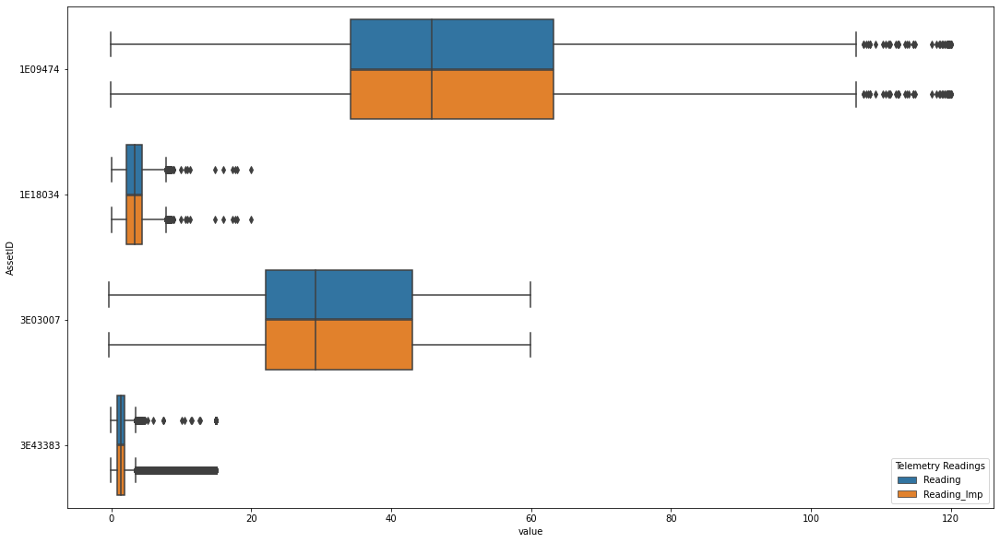

<IPython.core.display.Javascript object>

In [732]:
# Drawing a boxplot
tm_long = pd.melt(
    fulldf_weatherimpute,
    id_vars=["AssetID"],
    value_vars=["Reading", "Reading_Imp"],
    var_name="Telemetry Readings",
)

plt.rcParams["figure.figsize"] = (18, 10)
sns.boxplot(y="AssetID", x="value", data=tm_long, orient="h", hue="Telemetry Readings")

<AxesSubplot:xlabel='value', ylabel='AssetID'>

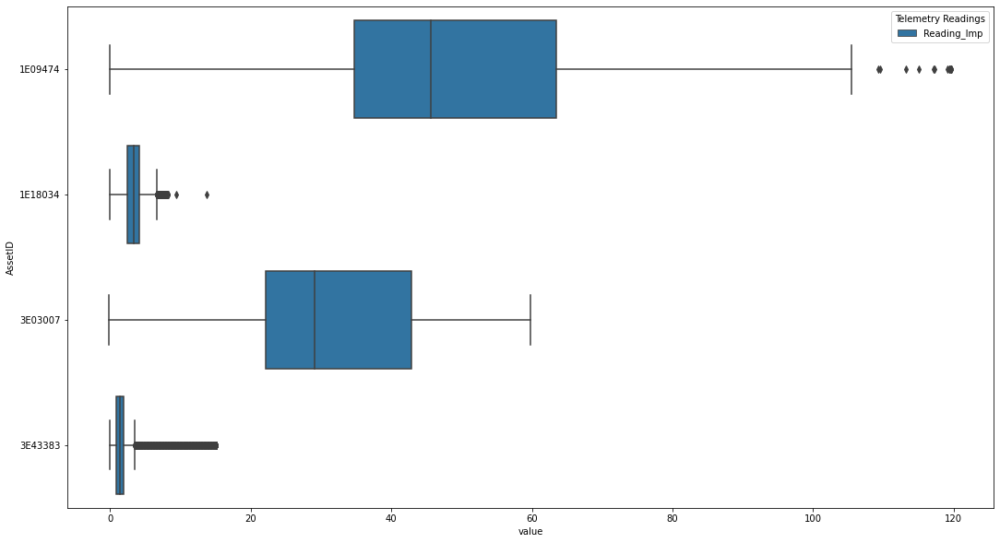

<IPython.core.display.Javascript object>

In [733]:
# Drawing a boxplot - hourly data
tm_long = pd.melt(
    fulldf_hourly,
    id_vars=["AssetID"],
    value_vars=["Reading_Imp"],
    var_name="Telemetry Readings",
)

plt.rcParams["figure.figsize"] = (18, 10)
sns.boxplot(y="AssetID", x="value", data=tm_long, orient="h", hue="Telemetry Readings")

In [734]:
def outliers(telemetry, reading):
    Q1 = telemetry[reading].groupby(telemetry["AssetID"]).quantile(0.25)
    Q3 = telemetry[reading].groupby(telemetry["AssetID"]).quantile(0.75)
    IQR = Q3 - Q1
    upper_limit = Q3 + 1.5 * IQR
    lower_limit = Q1 - 1.5 * IQR
    return upper_limit, lower_limit


upper, lower = outliers(fulldf_hourly, "Reading_Imp")
print("Upper whisker: ", upper)
print("Lower Whisker: ", lower)

Upper whisker:  AssetID
1E09474    106.490938
1E18034      6.687500
3E03007     73.870492
3E43383      3.510469
Name: Reading_Imp, dtype: float64
Lower Whisker:  AssetID
1E09474   -8.311563
1E18034   -0.092500
3E03007   -8.904153
3E43383   -0.638781
Name: Reading_Imp, dtype: float64


<IPython.core.display.Javascript object>

In [735]:
def outliers_3std(telemetry, reading):
    upper_limit = (
        telemetry[reading].groupby(telemetry["AssetID"]).mean()
        + 3 * telemetry[reading].groupby(telemetry["AssetID"]).std()
    )
    lower_limit = (
        telemetry[reading].groupby(telemetry["AssetID"]).mean()
        - 3 * telemetry[reading].groupby(telemetry["AssetID"]).std()
    )
    return upper_limit, lower_limit


upper_limit, lower_limit = outliers_3std(fulldf_hourly, "Reading_Imp")
print("Upper limit: ", upper_limit)
print("Lower Limit: ", lower_limit)

Upper limit:  AssetID
1E09474    106.775096
1E18034      7.175138
3E03007     70.499207
3E43383      7.889338
Name: Reading_Imp, dtype: float64
Lower Limit:  AssetID
1E09474   -8.430325
1E18034   -0.415947
3E03007   -5.815995
3E43383   -4.432473
Name: Reading_Imp, dtype: float64


<IPython.core.display.Javascript object>

In [736]:
# Converting the 'Fulldate' field data type from object to datetime
# fulldf_weatherimpute['FullDate'] = pd.to_datetime(fulldf_weatherimpute['FullDate'], format = '%Y-%m-%d %H:%M:%S')

<IPython.core.display.Javascript object>

In [737]:
# fulldf_weatherimpute['FullDate'].dtypes

<IPython.core.display.Javascript object>

In [738]:
# telemetry.pivot_table(index='FullDate',columns='AssetID',values='Reading_Imp').plot(figsize=(18,16),subplots=True)

<IPython.core.display.Javascript object>

In [739]:
df_1E09474 = fulldf_hourly.loc[fulldf_hourly["AssetID"] == "1E09474"].set_index(
    "FullDate"
)
df_1E18034 = fulldf_hourly.loc[fulldf_hourly["AssetID"] == "1E18034"].set_index(
    "FullDate"
)
df_3E03007 = fulldf_hourly.loc[fulldf_hourly["AssetID"] == "3E03007"].set_index(
    "FullDate"
)
df_3E43383 = fulldf_hourly.loc[fulldf_hourly["AssetID"] == "3E43383"].set_index(
    "FullDate"
)

<IPython.core.display.Javascript object>

ADF Test

H0: The time series is non-stationary. It has some time-dependent structure and does not have constant variance over time.

H1: The time series is stationary.

In [426]:
adf_1E09474 = adfuller(df_1E09474["Reading_Imp"])
print("Test statistics is:", adf_1E09474[0])
print("p-value of the test is:", adf_1E09474[1])
print("Critical values are:", adf_1E09474[4])

Test statistics is: -5.885583679053236
p-value of the test is: 3.007087636189885e-07
Critical values are: {'1%': -3.430599102593299, '5%': -2.8616500960359854, '10%': -2.5668286008605627}


<IPython.core.display.Javascript object>

p-value is less than alpha =0.05. The absolute value of the test statistic is lesser than -2.861. So, we can reject the null hypothesis that the time series is non-stationary. Therefore, the time series must be stationary.

In [427]:
adf_1E18034 = adfuller(df_1E18034["Reading_Imp"])
print("Test statistics is:", adf_1E18034[0])
print("p-value of the test is:", adf_1E18034[1])
print("Critical values are:", adf_1E18034[4])

Test statistics is: -7.05770291050305
p-value of the test is: 5.32210990619199e-10
Critical values are: {'1%': -3.43060818020568, '5%': -2.861654107899782, '10%': -2.566830736287229}


<IPython.core.display.Javascript object>

p-value is less than alpha =0.05. The absolute value of the test statistic is lesser than -2.861. So, we can reject the null hypothesis that the time series is non-stationary. Therefore, the time series must be stationary.

In [428]:
adf_3E03007 = adfuller(df_3E03007["Reading_Imp"])
print("Test statistics is:", adf_3E03007[0])
print("p-value of the test is:", adf_3E03007[1])
print("Critical values are:", adf_3E03007[4])

Test statistics is: -6.331475371065949
p-value of the test is: 2.8991762054074083e-08
Critical values are: {'1%': -3.430599102593299, '5%': -2.8616500960359854, '10%': -2.5668286008605627}


<IPython.core.display.Javascript object>

p-value is less than alpha =0.05. The absolute value of the test statistic is lesser than -2.861. So, we can reject the null hypothesis that the time series is non-stationary. Therefore, the time series must be stationary.

In [429]:
adf_3E43383 = adfuller(df_3E43383["Reading_Imp"])
print("Test statistics is:", adf_3E43383[0])
print("p-value of the test is:", adf_3E43383[1])
print("Critical values are:", adf_3E43383[4])

Test statistics is: -5.035393423714365
p-value of the test is: 1.88786625448656e-05
Critical values are: {'1%': -3.4305987236065825, '5%': -2.861649928541996, '10%': -2.566828511707251}


<IPython.core.display.Javascript object>

  ACF and PACF Plots for Readings of Asset 1E09474  


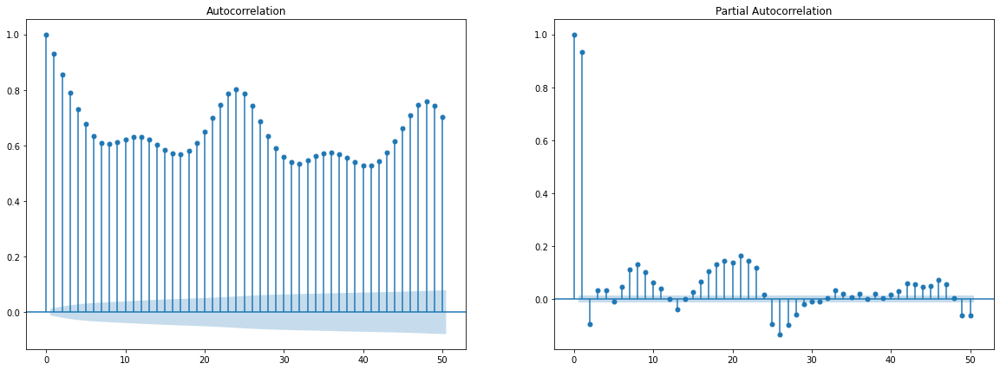

<IPython.core.display.Javascript object>

In [441]:
fig, ax = plt.subplots(1, 2, figsize=(20, 7))
sm.graphics.tsa.plot_acf(df_1E09474["Reading_Imp"].values.squeeze(), lags=50, ax=ax[0])
sm.graphics.tsa.plot_pacf(df_1E09474["Reading_Imp"].values.squeeze(), lags=50, ax=ax[1])
print("\033[1m  ACF and PACF Plots for Readings of Asset 1E09474  \033[0m")
plt.show()

  ACF and PACF Plots for Readings of Asset 1E09474 with Higher No. of Lags 


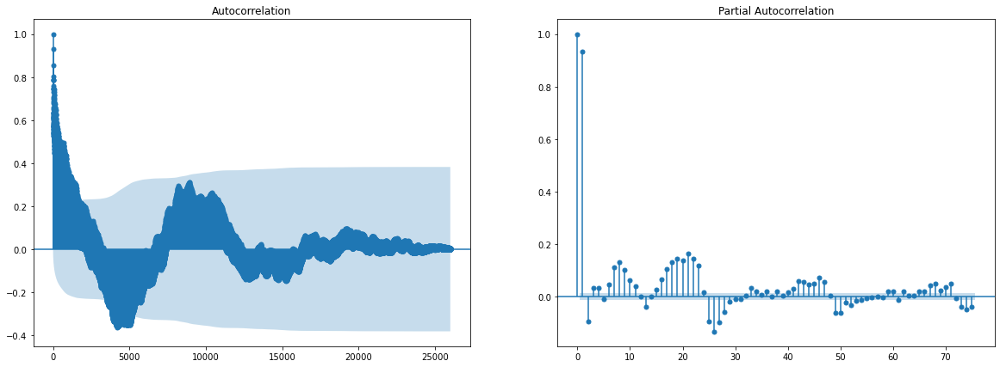

<IPython.core.display.Javascript object>

In [442]:
fig, ax = plt.subplots(1, 2, figsize=(20, 7))
sm.graphics.tsa.plot_acf(
    df_1E09474["Reading_Imp"].values.squeeze(), lags=26000, ax=ax[0]
)
sm.graphics.tsa.plot_pacf(df_1E09474["Reading_Imp"].values.squeeze(), lags=75, ax=ax[1])
print(
    "\033[1m  ACF and PACF Plots for Readings of Asset 1E09474 with Higher No. of Lags \033[0m"
)
plt.show()

  ACF Plots for Readings of Asset 1E09474 with 50 Lags and 26,000 Lags 


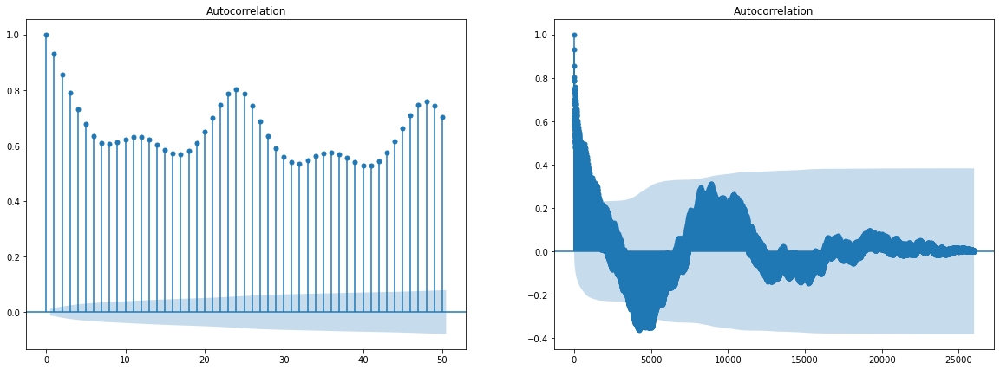

<IPython.core.display.Javascript object>

In [475]:
fig, ax = plt.subplots(1, 2, figsize=(20, 7))
sm.graphics.tsa.plot_acf(df_1E09474["Reading_Imp"].values.squeeze(), lags=50, ax=ax[0])
sm.graphics.tsa.plot_acf(
    df_1E09474["Reading_Imp"].values.squeeze(), lags=26000, ax=ax[1]
)

print(
    "\033[1m  ACF Plots for Readings of Asset 1E09474 with 50 Lags and 26,000 Lags \033[0m"
)
plt.show()

  ACF Plots for Readings of Asset 1E09474 with 50 Lags and 1,750 Lags 


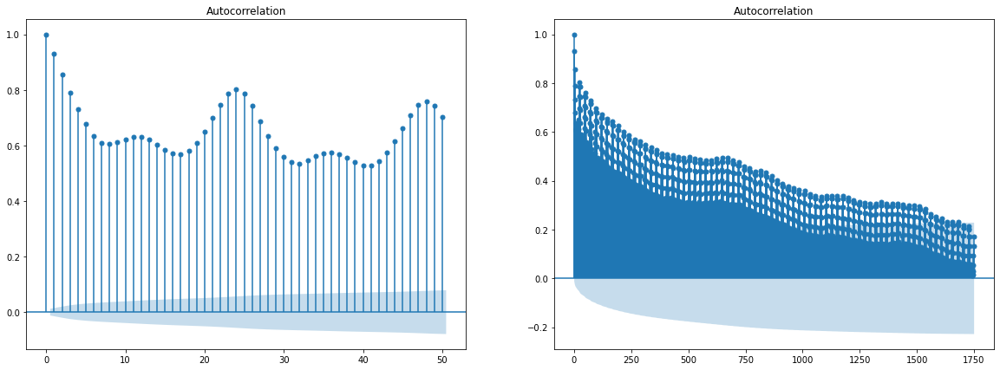

<IPython.core.display.Javascript object>

In [482]:
fig, ax = plt.subplots(1, 2, figsize=(20, 7))
sm.graphics.tsa.plot_acf(df_1E09474["Reading_Imp"].values.squeeze(), lags=50, ax=ax[0])
sm.graphics.tsa.plot_acf(
    df_1E09474["Reading_Imp"].values.squeeze(), lags=1750, ax=ax[1]
)

print(
    "\033[1m  ACF Plots for Readings of Asset 1E09474 with 50 Lags and 1,750 Lags \033[0m"
)
plt.show()

  ACF and PACF Plots for Readings of Asset 1E18034  


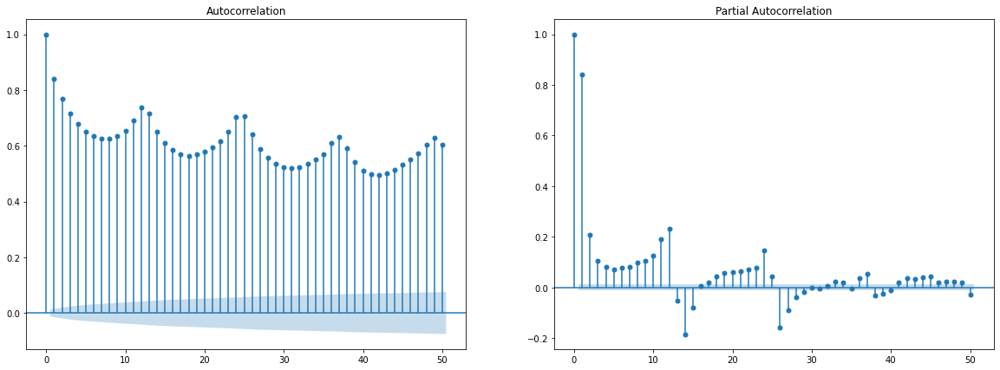

<IPython.core.display.Javascript object>

In [443]:
fig, ax = plt.subplots(1, 2, figsize=(20, 7))
sm.graphics.tsa.plot_acf(df_1E18034["Reading_Imp"].values.squeeze(), lags=50, ax=ax[0])
sm.graphics.tsa.plot_pacf(df_1E18034["Reading_Imp"].values.squeeze(), lags=50, ax=ax[1])
print("\033[1m  ACF and PACF Plots for Readings of Asset 1E18034  \033[0m")
plt.show()

  ACF and PACF Plots for Readings of Asset 1E18034 with Higher No. of Lags 


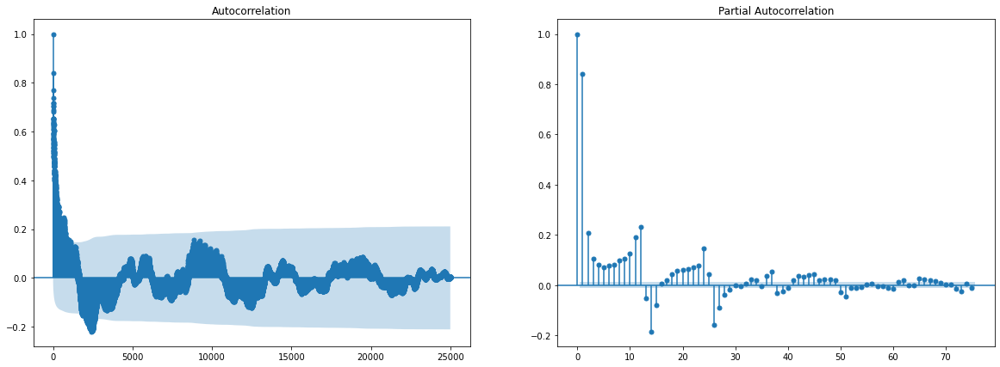

<IPython.core.display.Javascript object>

In [445]:
fig, ax = plt.subplots(1, 2, figsize=(20, 7))
sm.graphics.tsa.plot_acf(
    df_1E18034["Reading_Imp"].values.squeeze(), lags=25000, ax=ax[0]
)
sm.graphics.tsa.plot_pacf(df_1E18034["Reading_Imp"].values.squeeze(), lags=75, ax=ax[1])
print(
    "\033[1m  ACF and PACF Plots for Readings of Asset 1E18034 with Higher No. of Lags \033[0m"
)
plt.show()

  ACF Plots for Readings of Asset 1E18034 with 50 Lags and 25,000 Lags 


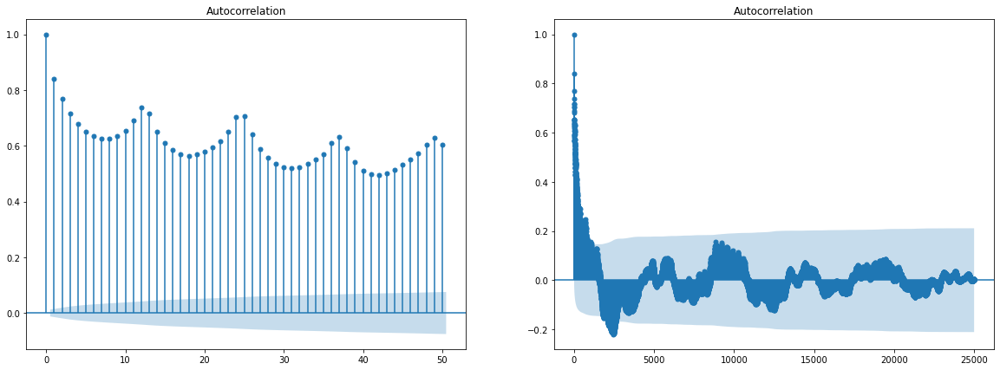

<IPython.core.display.Javascript object>

In [473]:
fig, ax = plt.subplots(1, 2, figsize=(20, 7))
sm.graphics.tsa.plot_acf(df_1E18034["Reading_Imp"].values.squeeze(), lags=50, ax=ax[0])
sm.graphics.tsa.plot_acf(
    df_1E18034["Reading_Imp"].values.squeeze(), lags=25000, ax=ax[1]
)

print(
    "\033[1m  ACF Plots for Readings of Asset 1E18034 with 50 Lags and 25,000 Lags \033[0m"
)
plt.show()

  ACF Plots for Readings of Asset 1E18034 with 50 Lags and 1,250 Lags 


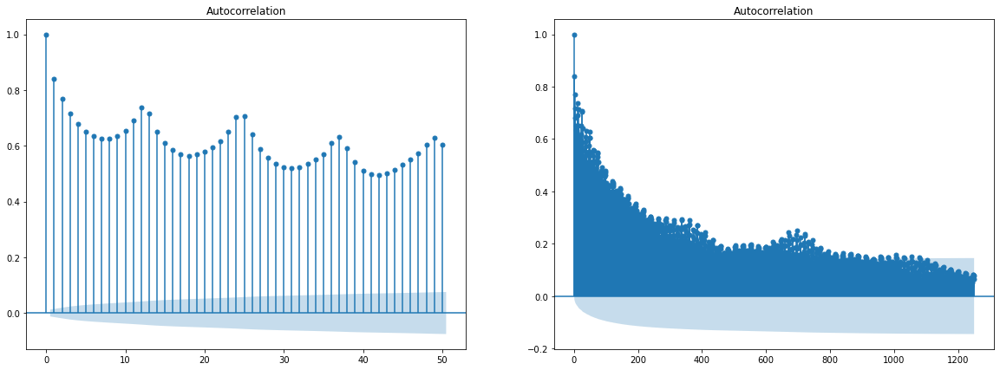

<IPython.core.display.Javascript object>

In [484]:
fig, ax = plt.subplots(1, 2, figsize=(20, 7))
sm.graphics.tsa.plot_acf(df_1E18034["Reading_Imp"].values.squeeze(), lags=50, ax=ax[0])
sm.graphics.tsa.plot_acf(
    df_1E18034["Reading_Imp"].values.squeeze(), lags=1250, ax=ax[1]
)

print(
    "\033[1m  ACF Plots for Readings of Asset 1E18034 with 50 Lags and 1,250 Lags \033[0m"
)
plt.show()

  ACF and PACF Plots for Readings of Asset 3E03007  


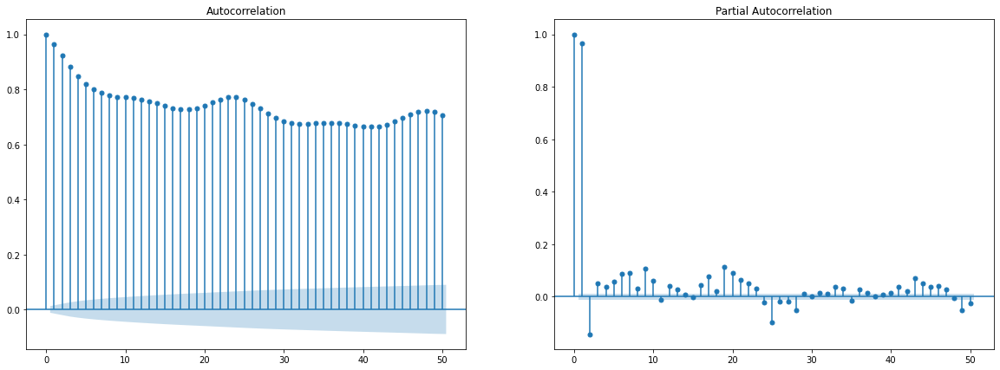

<IPython.core.display.Javascript object>

In [446]:
fig, ax = plt.subplots(1, 2, figsize=(20, 7))
sm.graphics.tsa.plot_acf(df_3E03007["Reading_Imp"].values.squeeze(), lags=50, ax=ax[0])
sm.graphics.tsa.plot_pacf(df_3E03007["Reading_Imp"].values.squeeze(), lags=50, ax=ax[1])
print("\033[1m  ACF and PACF Plots for Readings of Asset 3E03007  \033[0m")
plt.show()

  ACF and PACF Plots for Readings of Asset 3E03007 with Higher No. of Lags 


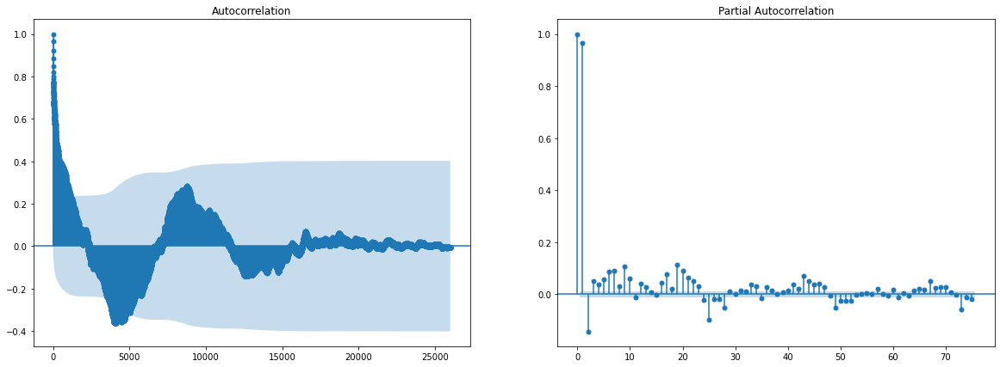

<IPython.core.display.Javascript object>

In [476]:
fig, ax = plt.subplots(1, 2, figsize=(20, 7))
sm.graphics.tsa.plot_acf(
    df_3E03007["Reading_Imp"].values.squeeze(), lags=26000, ax=ax[0]
)
sm.graphics.tsa.plot_pacf(df_3E03007["Reading_Imp"].values.squeeze(), lags=75, ax=ax[1])
print(
    "\033[1m  ACF and PACF Plots for Readings of Asset 3E03007 with Higher No. of Lags \033[0m"
)
plt.show()

  ACF Plots for Readings of Asset 3E03007 with 50 Lags and 26,000 Lags 


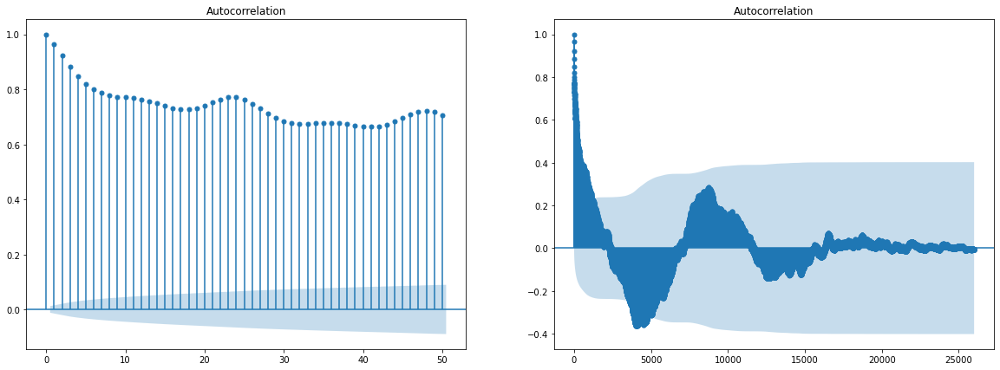

<IPython.core.display.Javascript object>

In [477]:
fig, ax = plt.subplots(1, 2, figsize=(20, 7))
sm.graphics.tsa.plot_acf(df_3E03007["Reading_Imp"].values.squeeze(), lags=50, ax=ax[0])
sm.graphics.tsa.plot_acf(
    df_3E03007["Reading_Imp"].values.squeeze(), lags=26000, ax=ax[1]
)

print(
    "\033[1m  ACF Plots for Readings of Asset 3E03007 with 50 Lags and 26,000 Lags \033[0m"
)
plt.show()

  ACF Plots for Readings of Asset 3E03007 with 50 Lags and 1,500 Lags 


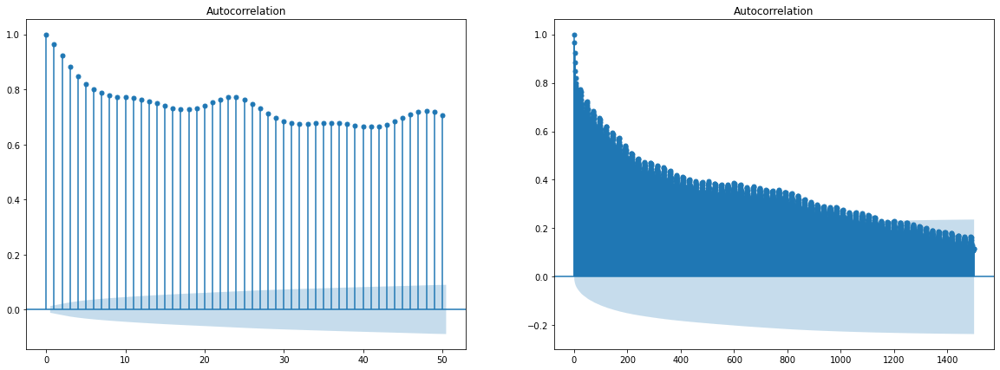

<IPython.core.display.Javascript object>

In [486]:
fig, ax = plt.subplots(1, 2, figsize=(20, 7))
sm.graphics.tsa.plot_acf(df_3E03007["Reading_Imp"].values.squeeze(), lags=50, ax=ax[0])
sm.graphics.tsa.plot_acf(
    df_3E03007["Reading_Imp"].values.squeeze(), lags=1500, ax=ax[1]
)

print(
    "\033[1m  ACF Plots for Readings of Asset 3E03007 with 50 Lags and 1,500 Lags \033[0m"
)
plt.show()

  ACF and PACF Plots for Readings of Asset 3E43383  


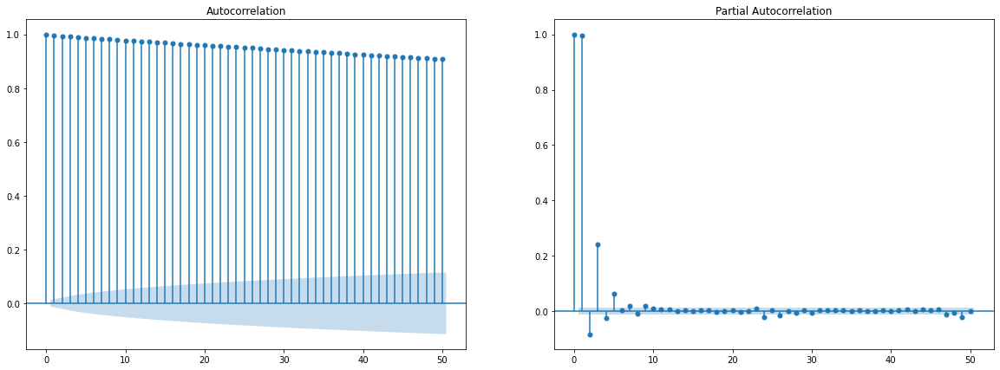

<IPython.core.display.Javascript object>

In [448]:
fig, ax = plt.subplots(1, 2, figsize=(20, 7))
sm.graphics.tsa.plot_acf(df_3E43383["Reading_Imp"].values.squeeze(), lags=50, ax=ax[0])
sm.graphics.tsa.plot_pacf(df_3E43383["Reading_Imp"].values.squeeze(), lags=50, ax=ax[1])
print("\033[1m  ACF and PACF Plots for Readings of Asset 3E43383  \033[0m")
plt.show()

  ACF and PACF Plots for Readings of Asset 3E43383 with Higher No. of Lags 


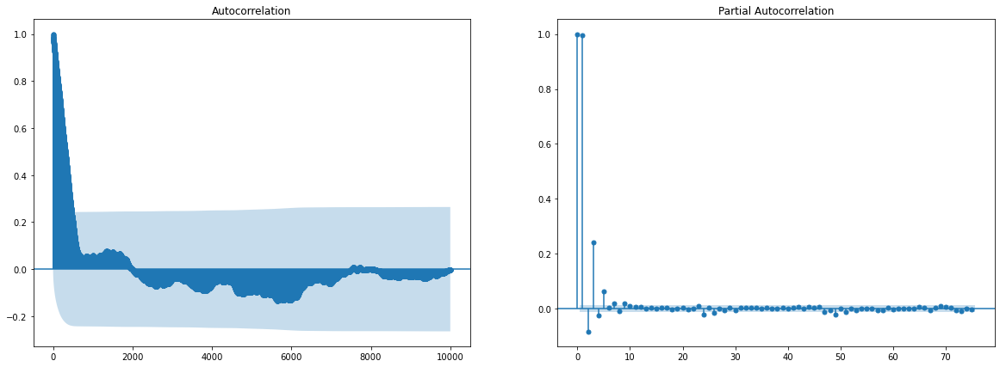

<IPython.core.display.Javascript object>

In [450]:
fig, ax = plt.subplots(1, 2, figsize=(20, 7))
sm.graphics.tsa.plot_acf(
    df_3E43383["Reading_Imp"].values.squeeze(), lags=10000, ax=ax[0]
)
sm.graphics.tsa.plot_pacf(df_3E43383["Reading_Imp"].values.squeeze(), lags=75, ax=ax[1])
print(
    "\033[1m  ACF and PACF Plots for Readings of Asset 3E43383 with Higher No. of Lags \033[0m"
)
plt.show()

  ACF Plots for Readings of Asset 3E43383 with 50 Lags and 26,000 Lags 


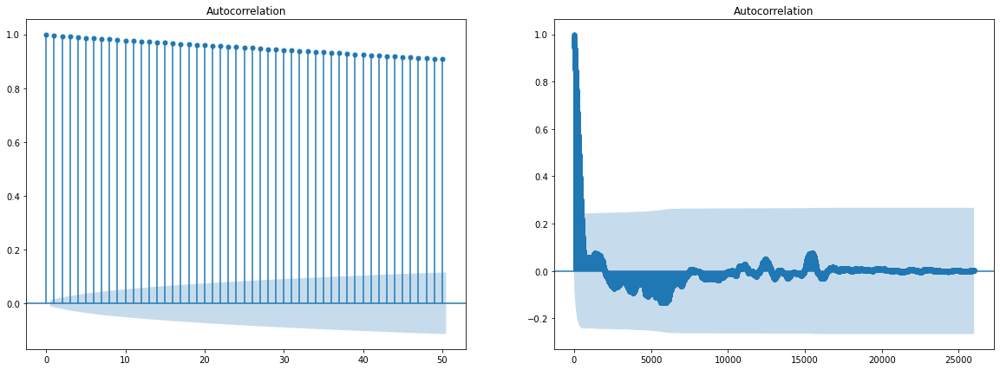

<IPython.core.display.Javascript object>

In [478]:
fig, ax = plt.subplots(1, 2, figsize=(20, 7))
sm.graphics.tsa.plot_acf(df_3E43383["Reading_Imp"].values.squeeze(), lags=50, ax=ax[0])
sm.graphics.tsa.plot_acf(
    df_3E43383["Reading_Imp"].values.squeeze(), lags=26000, ax=ax[1]
)

print(
    "\033[1m  ACF Plots for Readings of Asset 3E43383 with 50 Lags and 26,000 Lags \033[0m"
)
plt.show()

  ACF Plots for Readings of Asset 3E43383 with 50 Lags and 750 Lags 


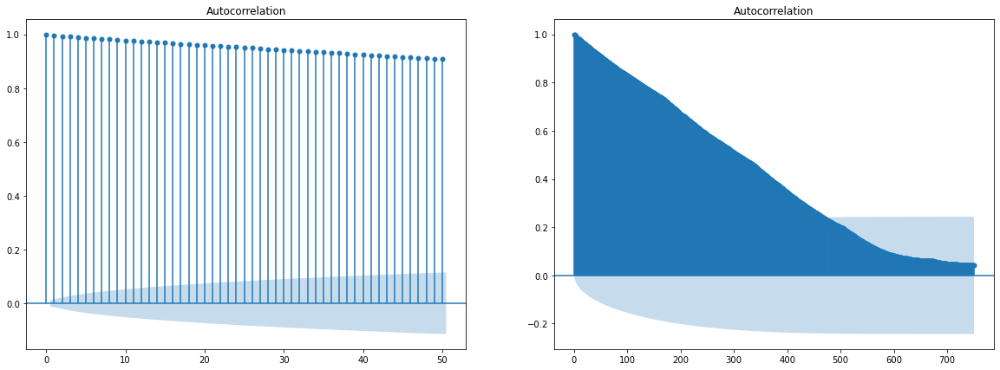

<IPython.core.display.Javascript object>

In [488]:
fig, ax = plt.subplots(1, 2, figsize=(20, 7))
sm.graphics.tsa.plot_acf(df_3E43383["Reading_Imp"].values.squeeze(), lags=50, ax=ax[0])
sm.graphics.tsa.plot_acf(df_3E43383["Reading_Imp"].values.squeeze(), lags=750, ax=ax[1])

print(
    "\033[1m  ACF Plots for Readings of Asset 3E43383 with 50 Lags and 750 Lags \033[0m"
)
plt.show()

  ACF Plots for Readings of Asset 3E43383 with 50 Lags and 750 Lags 


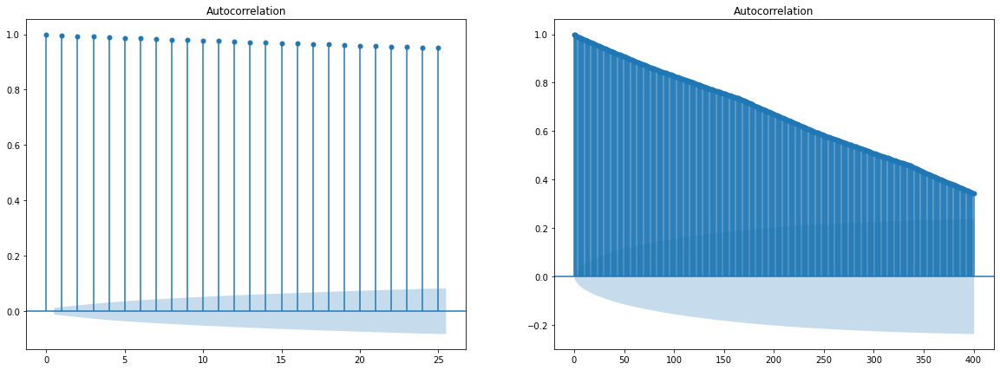

<IPython.core.display.Javascript object>

In [490]:
fig, ax = plt.subplots(1, 2, figsize=(20, 7))
sm.graphics.tsa.plot_acf(df_3E43383["Reading_Imp"].values.squeeze(), lags=25, ax=ax[0])
sm.graphics.tsa.plot_acf(df_3E43383["Reading_Imp"].values.squeeze(), lags=400, ax=ax[1])

print(
    "\033[1m  ACF Plots for Readings of Asset 3E43383 with 50 Lags and 750 Lags \033[0m"
)
plt.show()

<ipython-input-457-ce9cb9cc27f7>:4: FutureWarning: the 'freq'' keyword is deprecated, use 'period' instead
  result_1E09474 = seasonal_decompose(
<ipython-input-457-ce9cb9cc27f7>:11: FutureWarning: the 'freq'' keyword is deprecated, use 'period' instead
  result_1E18034 = seasonal_decompose(
<ipython-input-457-ce9cb9cc27f7>:18: FutureWarning: the 'freq'' keyword is deprecated, use 'period' instead
  result_3E03007 = seasonal_decompose(
<ipython-input-457-ce9cb9cc27f7>:25: FutureWarning: the 'freq'' keyword is deprecated, use 'period' instead
  result_3E43383 = seasonal_decompose(


Text(0, 0.5, '3E43383 Seasonal')

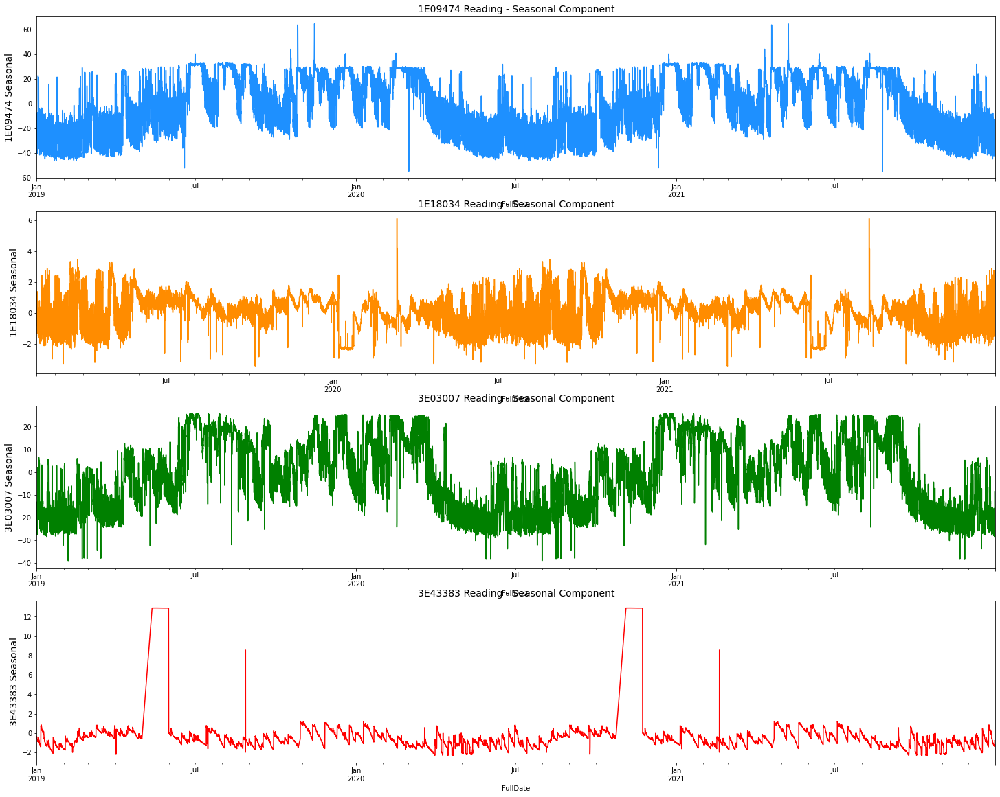

<IPython.core.display.Javascript object>

In [457]:
# Seasonal plot for each asset
f, ax = plt.subplots(nrows=4, ncols=1, figsize=(25, 20))

result_1E09474 = seasonal_decompose(
    df_1E09474["Reading_Imp"], model="additive", freq=13000
)
result_1E09474.seasonal.plot(ax=ax[0], color="dodgerblue", label="seasonal")
ax[0].set_title(f"1E09474 Reading - Seasonal Component", fontsize=14)
ax[0].set_ylabel(ylabel="1E09474 Seasonal", fontsize=14)

result_1E18034 = seasonal_decompose(
    df_1E18034["Reading_Imp"], model="additive", freq=12500
)
result_1E18034.seasonal.plot(ax=ax[1], color="darkorange", label="seasonal")
ax[1].set_title(f"1E18034 Reading - Seasonal Component", fontsize=14)
ax[1].set_ylabel(ylabel="1E18034 Seasonal", fontsize=14)

result_3E03007 = seasonal_decompose(
    df_3E03007["Reading_Imp"], model="additive", freq=13000
)
result_3E03007.seasonal.plot(ax=ax[2], color="green", label="seasonal")
ax[2].set_title(f"3E03007 Reading - Seasonal Component", fontsize=14)
ax[2].set_ylabel(ylabel="3E03007 Seasonal", fontsize=14)

result_3E43383 = seasonal_decompose(
    df_3E43383["Reading_Imp"], model="additive", freq=13000
)
result_3E43383.seasonal.plot(ax=ax[3], color="red", label="seasonal")
ax[3].set_title(f"3E43383 Reading - Seasonal Component", fontsize=14)
ax[3].set_ylabel(ylabel="3E43383 Seasonal", fontsize=14)

# model="additive", period=35040

Text(0, 0.5, '3E43383 Trend')

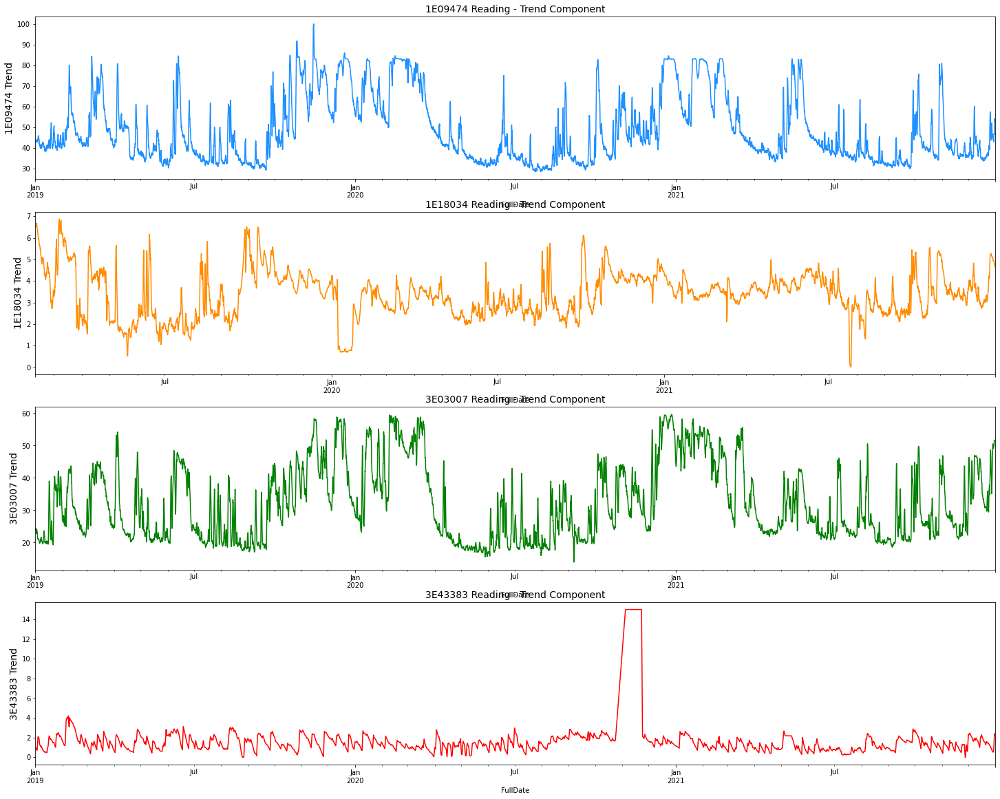

<IPython.core.display.Javascript object>

In [463]:
# Trend plot for each asset

f, ax = plt.subplots(nrows=4, ncols=1, figsize=(25, 20))

result_1E09474 = seasonal_decompose(df_1E09474["Reading_Imp"], model="additive")
result_1E09474.trend.plot(ax=ax[0], color="dodgerblue", label="trend")
ax[0].set_title(f"1E09474 Reading - Trend Component", fontsize=14)
ax[0].set_ylabel(ylabel="1E09474 Trend", fontsize=14)

result_1E18034 = seasonal_decompose(df_1E18034["Reading_Imp"], model="additive")
result_1E18034.trend.plot(ax=ax[1], color="darkorange", label="trend")
ax[1].set_title(f"1E18034 Reading - Trend Component", fontsize=14)
ax[1].set_ylabel(ylabel="1E18034 Trend", fontsize=14)

result_3E03007 = seasonal_decompose(df_3E03007["Reading_Imp"], model="additive")
result_3E03007.trend.plot(ax=ax[2], color="green", label="trend")
ax[2].set_title(f"3E03007 Reading - Trend Component", fontsize=14)
ax[2].set_ylabel(ylabel="3E03007 Trend", fontsize=14)

result_3E43383 = seasonal_decompose(df_3E43383["Reading_Imp"], model="additive")
result_3E43383.trend.plot(ax=ax[3], color="red", label="trend")
ax[3].set_title(f"3E43383 Reading - Trend Component", fontsize=14)
ax[3].set_ylabel(ylabel="3E43383 Trend", fontsize=14)

Text(0, 0.5, '3E43383 Residual')

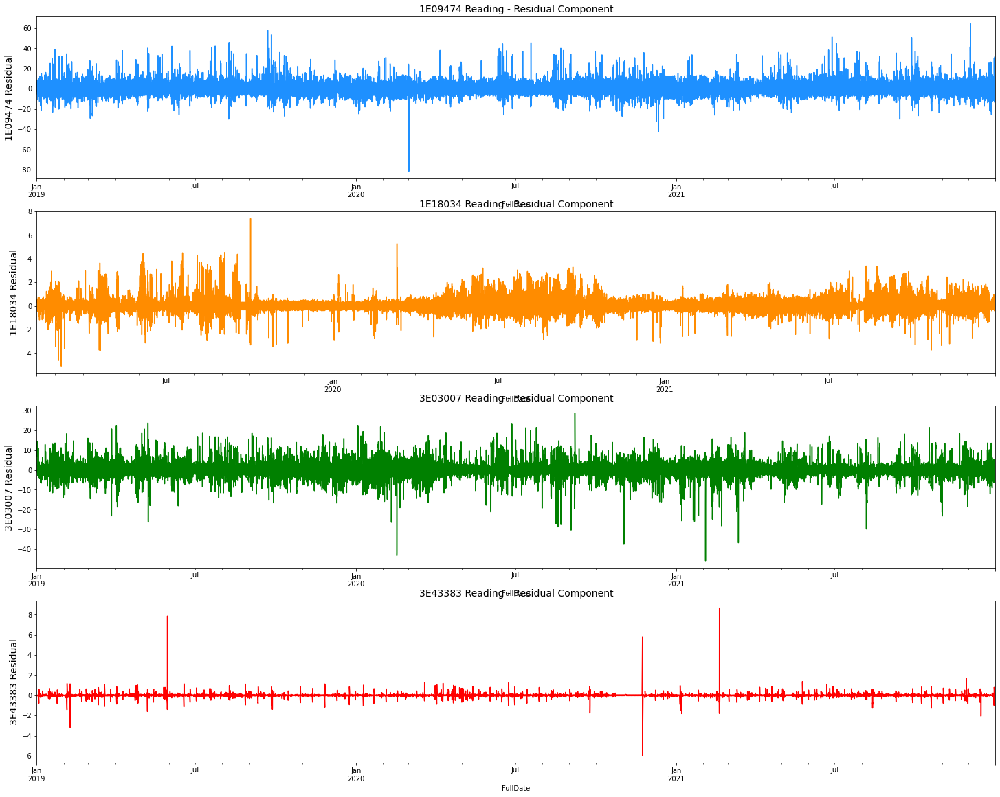

<IPython.core.display.Javascript object>

In [464]:
# result.plot()

f, ax = plt.subplots(nrows=4, ncols=1, figsize=(25, 20))

result_1E09474.resid.plot(ax=ax[0], color="dodgerblue", label="Residual")
ax[0].set_title(f"1E09474 Reading - Residual Component", fontsize=14)
ax[0].set_ylabel(ylabel="1E09474 Residual", fontsize=14)

result_1E18034.resid.plot(ax=ax[1], color="darkorange", label="Residual")
ax[1].set_title(f"1E18034 Reading - Residual Component", fontsize=14)
ax[1].set_ylabel(ylabel="1E18034 Residual", fontsize=14)

result_3E03007.resid.plot(ax=ax[2], color="green", label="Residual")
ax[2].set_title(f"3E03007 Reading - Residual Component", fontsize=14)
ax[2].set_ylabel(ylabel="3E03007 Residual", fontsize=14)

result_3E43383.resid.plot(ax=ax[3], color="red", label="Residual")
ax[3].set_title(f"3E43383 Reading - Residual Component", fontsize=14)
ax[3].set_ylabel(ylabel="3E43383 Residual", fontsize=14)

KPSS test is conducted with the following assumptions.
Null Hypothesis (HO): Series is trend stationary or series has no unit root.

Alternate Hypothesis(HA): Series is non-stationary or series has a unit root.

Conditions to Fail to Reject Null Hypothesis(HO)

If Test statistic < Critical Value and p-value < 0.05 – Fail to Reject Null Hypothesis(HO) i.e., time series does not have a unit root, meaning it is trend stationary.

In [465]:
def kpss_test(timeseries):
    print("Results of KPSS Test:")
    kpsstest = kpss(timeseries, regression="c", nlags="auto")
    kpss_output = pd.Series(
        kpsstest[0:3], index=["Test Statistic", "p-value", "#Lags Used"]
    )
    for key, value in kpsstest[3].items():
        kpss_output["Critical Value (%s)" % key] = value
    print(kpss_output)

<IPython.core.display.Javascript object>

In [466]:
# Call the function and run the test
print("KPSS Test for Readings of Asset 1E09474")
kpss_test(df_1E09474["Reading_Imp"])

KPSS Test for Readings of Asset 1E09474
Results of KPSS Test:
Test Statistic            1.178351
p-value                   0.010000
#Lags Used               89.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


C:\Users\admin\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1906: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(


<IPython.core.display.Javascript object>

Test Statistic > Critical Value at 5% and p-value < alpha=0.05. As a result, we reject the Null hypothesis in favor of an Alternative. Hence we conclude series is non-stationary.

For Asset 1E09474 time series, ADF concludes stationary and KPSS concludes non-stationary – The series is difference stationary. Differencing is to be used to make series stationary. 

In [467]:
print("KPSS Test for Readings of Asset 1E18034")
kpss_test(df_1E18034["Reading_Imp"])

KPSS Test for Readings of Asset 1E18034
Results of KPSS Test:
Test Statistic            0.518269
p-value                   0.037552
#Lags Used               90.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


<IPython.core.display.Javascript object>

Test Statistic > Critical Value at 5% and p-value < alpha=0.05. As a result, we reject the Null hypothesis in favor of an Alternative. Hence we conclude series is non-stationary.

For Asset 1E18034 time series, ADF concludes stationary and KPSS concludes non-stationary – The series is difference stationary. Differencing is to be used to make series stationary. 

In [468]:
print("KPSS Test for Readings of Asset 3E03007")
kpss_test(df_3E03007["Reading_Imp"])

KPSS Test for Readings of Asset 3E03007
Results of KPSS Test:
Test Statistic            0.647844
p-value                   0.018287
#Lags Used               92.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


<IPython.core.display.Javascript object>

Test Statistic > Critical Value at 5% and p-value < alpha=0.05. As a result, we reject the Null hypothesis in favor of an Alternative. Hence we conclude series is non-stationary.

For Asset 3E03007 time series, ADF concludes stationary and KPSS concludes non-stationary – The series is difference stationary. Differencing is to be used to make series stationary. 

In [469]:
# https://www.analyticsvidhya.com/blog/2021/06/statistical-tests-to-check-stationarity-in-time-series-part-1/#:~:text=The%20KPSS%20test%2C%20short%20for,spirit%20with%20the%20ADF%20test.
print("KPSS Test for Readings of Asset 3E43383")
kpss_test(df_3E43383["Reading_Imp"])

KPSS Test for Readings of Asset 3E43383
Results of KPSS Test:
Test Statistic            0.566985
p-value                   0.026580
#Lags Used               95.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


<IPython.core.display.Javascript object>

Test Statistic > Critical Value at 5% and p-value < alpha=0.05. As a result, we reject the Null hypothesis in favor of an Alternative. Hence we conclude series is non-stationary.

For Asset 3E43383 time series, ADF concludes stationary and KPSS concludes non-stationary – The series is difference stationary. Differencing is to be used to make series stationary. 

array([<AxesSubplot:xlabel='FullDate'>, <AxesSubplot:xlabel='FullDate'>,
       <AxesSubplot:xlabel='FullDate'>, <AxesSubplot:xlabel='FullDate'>],
      dtype=object)

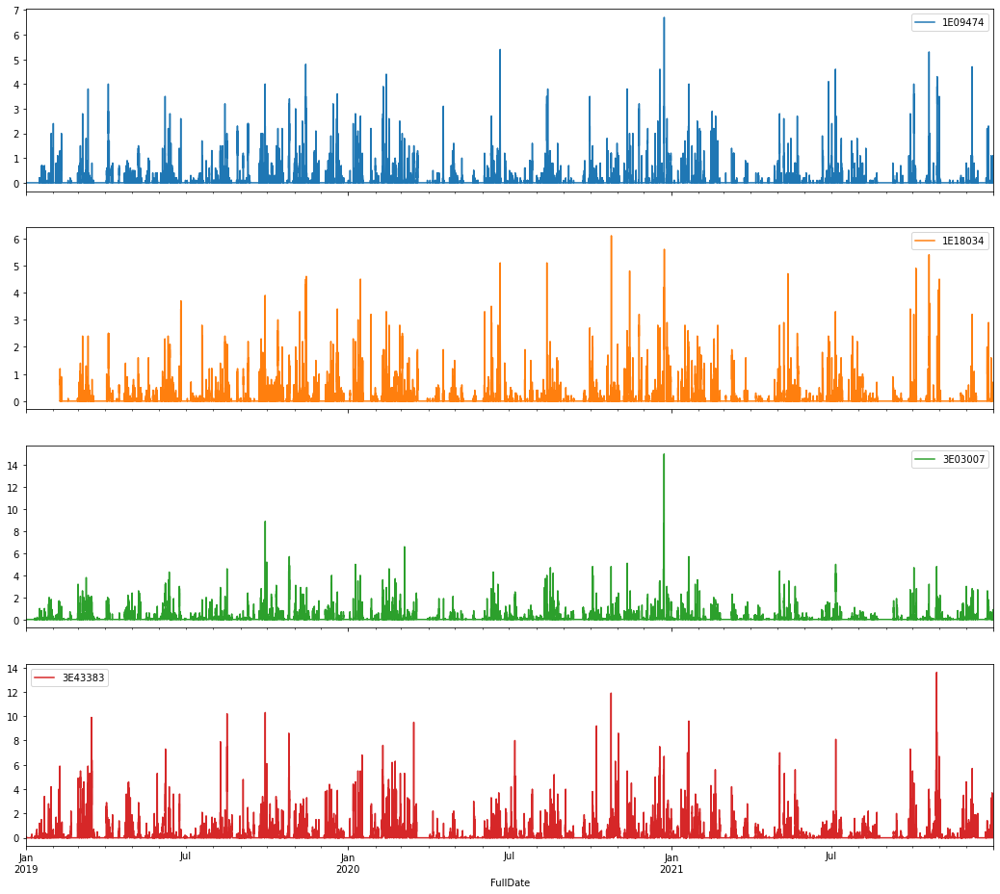

<IPython.core.display.Javascript object>

In [316]:
fulldf_hourly.pivot_table(index="FullDate", columns="AssetID", values="precipMM").plot(
    figsize=(18, 16), subplots=True
)

array([<AxesSubplot:xlabel='FullDate'>, <AxesSubplot:xlabel='FullDate'>,
       <AxesSubplot:xlabel='FullDate'>, <AxesSubplot:xlabel='FullDate'>],
      dtype=object)

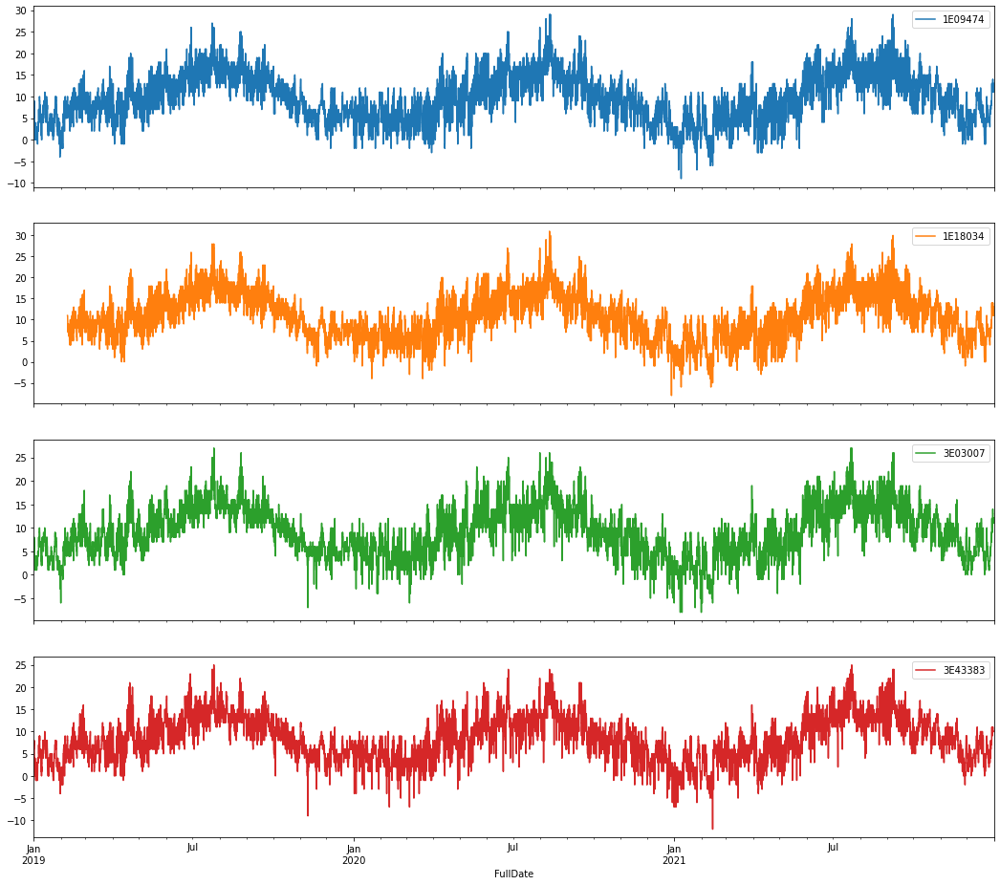

<IPython.core.display.Javascript object>

In [317]:
fulldf_hourly.pivot_table(index="FullDate", columns="AssetID", values="tempC").plot(
    figsize=(18, 16), subplots=True
)

array([<AxesSubplot:xlabel='FullDate'>, <AxesSubplot:xlabel='FullDate'>,
       <AxesSubplot:xlabel='FullDate'>, <AxesSubplot:xlabel='FullDate'>],
      dtype=object)

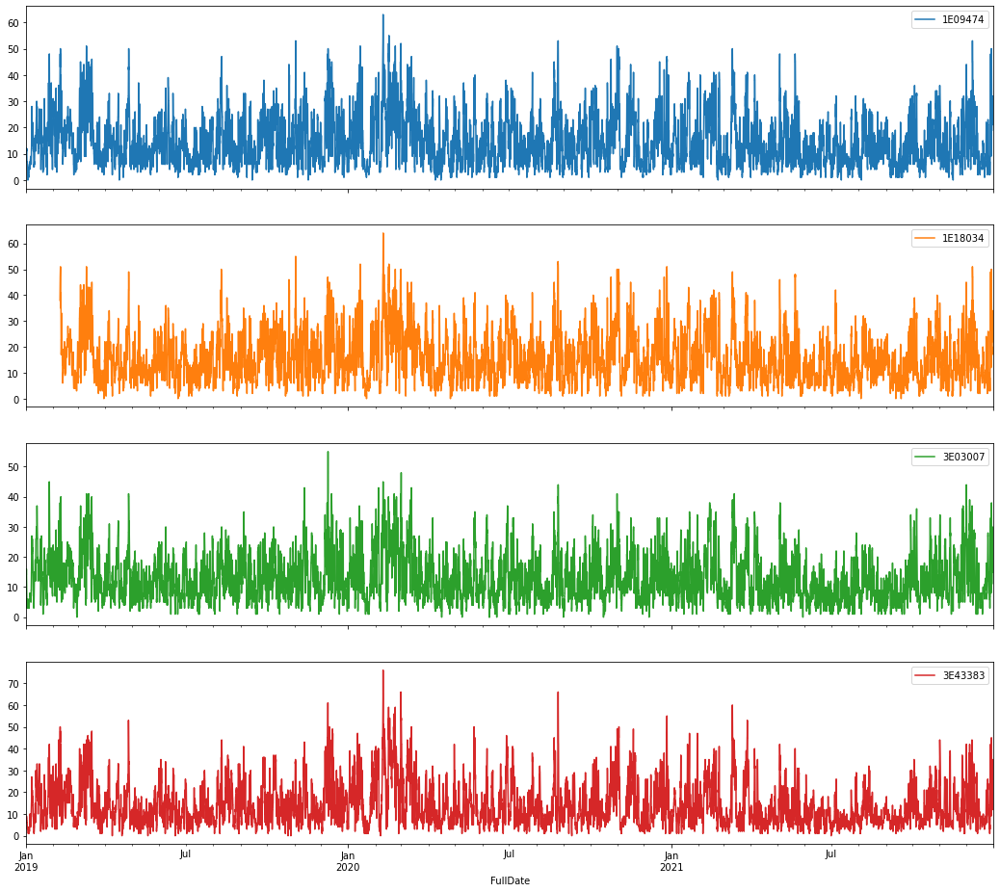

<IPython.core.display.Javascript object>

In [318]:
fulldf_hourly.pivot_table(
    index="FullDate", columns="AssetID", values="windspeedKmph"
).plot(figsize=(18, 16), subplots=True)

In [319]:
# Cheking the stationarity of weather data

<IPython.core.display.Javascript object>

In [740]:
df_1E09474.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 26304 entries, 2019-01-01 00:00:00 to 2021-12-31 23:00:00
Data columns (total 57 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   AssetID                26304 non-null  object        
 1   Date                   26304 non-null  datetime64[ns]
 2   Reading_Imp            26304 non-null  float64       
 3   Time                   26304 non-null  object        
 4   tempC                  26304 non-null  int64         
 5   windspeedKmph          26304 non-null  int64         
 6   winddirDegree          26304 non-null  int64         
 7   precipMM               26304 non-null  float64       
 8   humidity               26304 non-null  int64         
 9   visibility             26304 non-null  int64         
 10  pressure               26304 non-null  int64         
 11  cloudcover             26304 non-null  int64         
 12  HeatIndexC             26

<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'Correlation Heatmap')

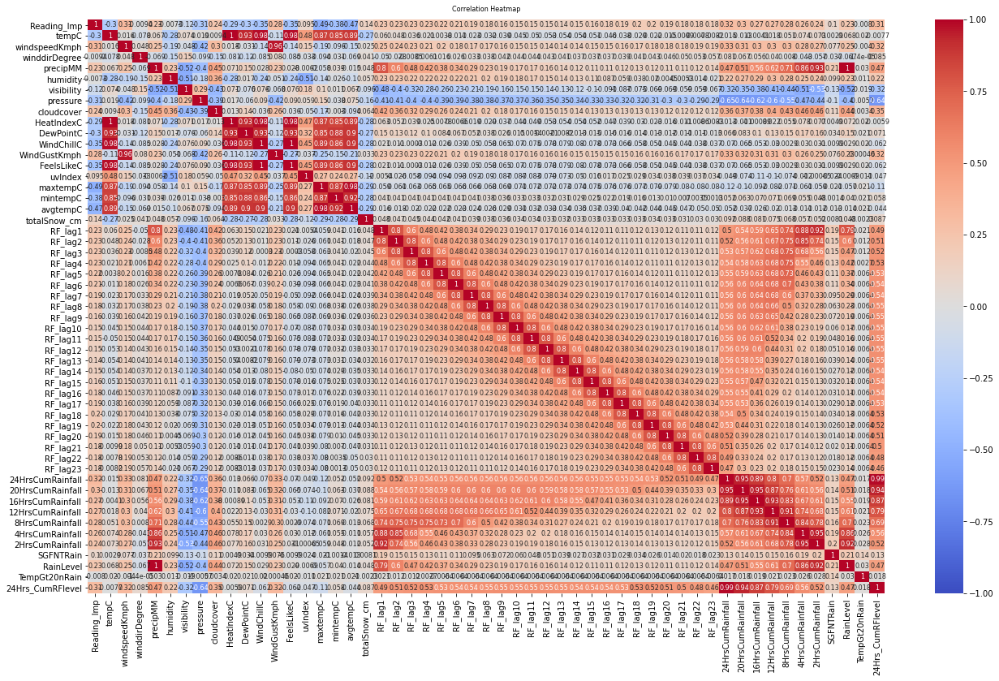

<IPython.core.display.Javascript object>

In [741]:
df = df_1E09474.drop(["AssetID", "Date", "Time", "OriginalWeatherRecord",], axis=1,)
plt.figure(figsize=(22, 13))
# cmap = sns.diverging_palette(320, 40, sep=50, as_cmap=True)
heatmap = sns.heatmap(
    df.corr(method="spearman"),
    vmin=-1,
    vmax=1,
    cmap="coolwarm",
    annot=True,
    annot_kws={"fontsize": 8},
)
heatmap.set_title("Correlation Heatmap", fontdict={"fontsize": 8}, pad=10)

Text(0.5, 1.0, 'Correlation Heatmap')

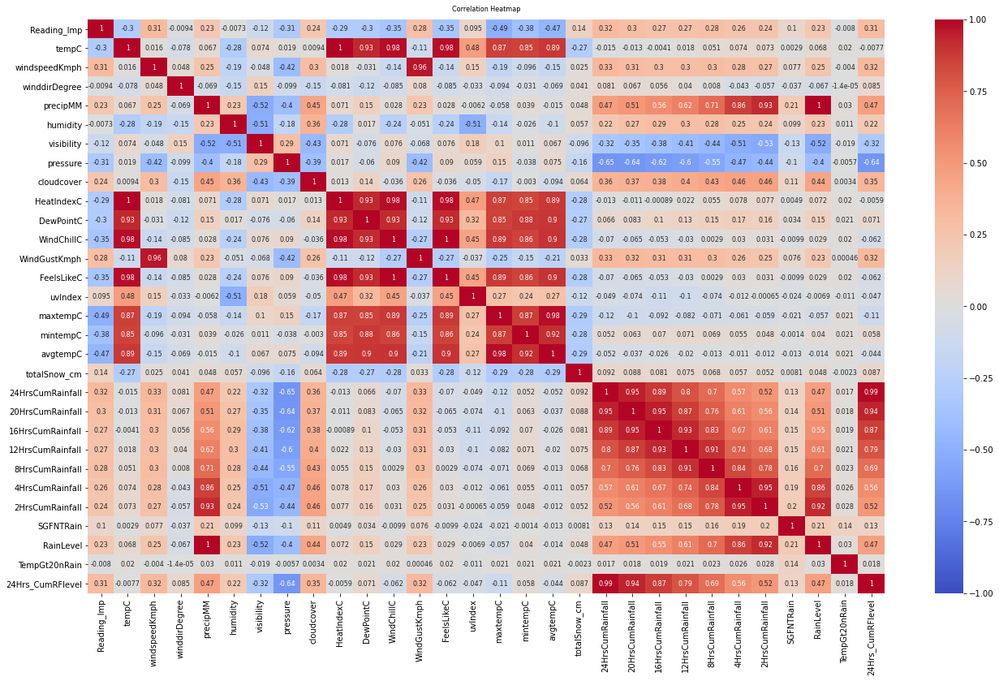

<IPython.core.display.Javascript object>

In [742]:
df2 = df.drop(LagCols, axis=1)
plt.figure(figsize=(22, 13))
# cmap = sns.diverging_palette(320, 40, sep=50, as_cmap=True)
heatmap = sns.heatmap(
    df2.corr(method="spearman"),
    vmin=-1,
    vmax=1,
    cmap="coolwarm",
    annot=True,
    annot_kws={"fontsize": 8},
)
heatmap.set_title("Correlation Heatmap", fontdict={"fontsize": 8}, pad=10)

In [782]:
df3 = df2.between_time("00:00", "00:59")
df4 = df2.between_time("06:00", "06:59")
df5 = df2.between_time("09:00", "09:59")
df6 = df2.between_time("12:00", "12:59")
df7 = df2.between_time("15:00", "15:59")
df8 = df2.between_time("18:00", "18:59")
df9 = df2.between_time("20:00", "20:59")
df10 = df2.between_time("22:00", "22:59")

<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'Correlation Heatmap')

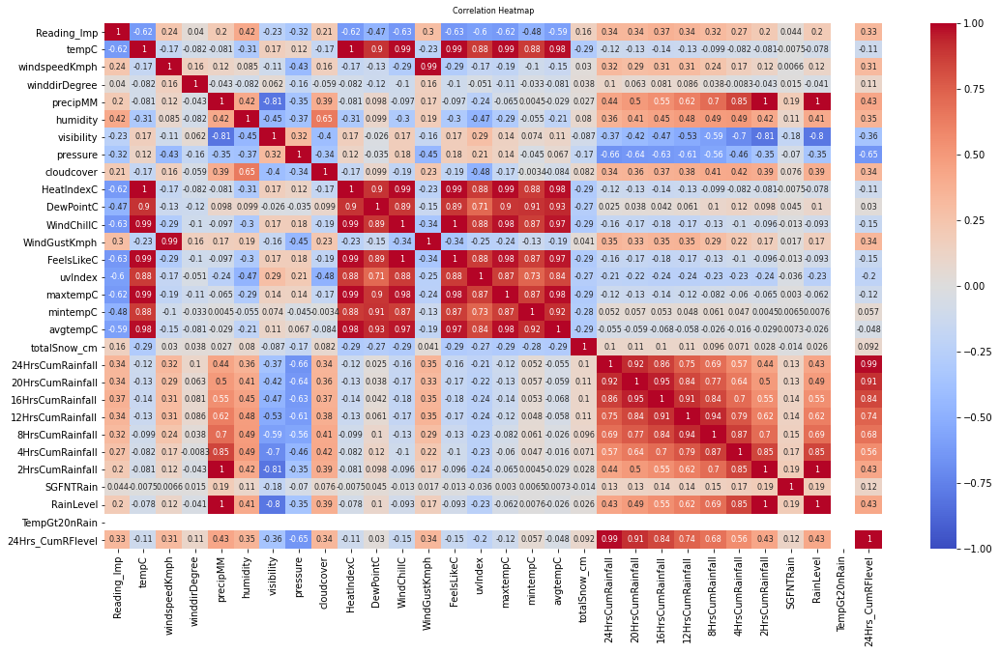

<IPython.core.display.Javascript object>

In [749]:
heatmap1 = sns.heatmap(
    df3.corr(method="spearman"),
    vmin=-1,
    vmax=1,
    cmap="coolwarm",
    annot=True,
    annot_kws={"fontsize": 8},
)
heatmap1.set_title("Correlation Heatmap - First Hour", fontdict={"fontsize": 8}, pad=10)

Text(0.5, 1.0, 'Correlation Heatmap - Seventh Hour')

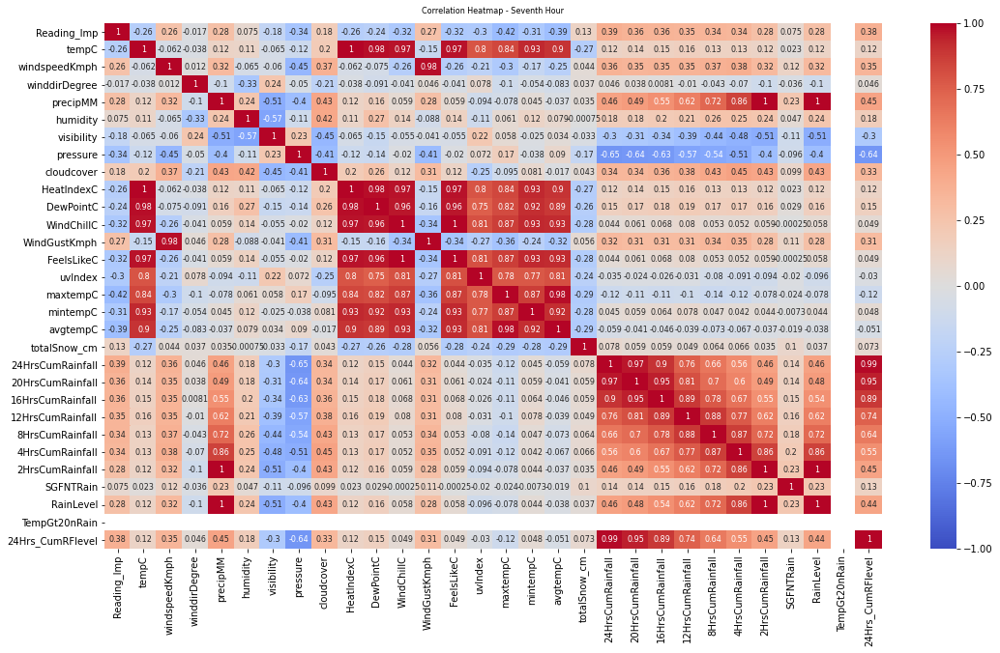

<IPython.core.display.Javascript object>

In [755]:
heatmap2 = sns.heatmap(
    df4.corr(method="spearman"),
    vmin=-1,
    vmax=1,
    cmap="coolwarm",
    annot=True,
    annot_kws={"fontsize": 8},
)
heatmap2.set_title(
    "Correlation Heatmap - Seventh Hour", fontdict={"fontsize": 8}, pad=10
)

In [760]:
# remove the high corelated columns since it effect to the model
df2 = df.drop(
    [
        "WindChillC",
        "HeatIndexC",
        "FeelsLikeC",
        "uvIndex",
        "maxtempC",
        "mintempC",
        "avgtempC",
    ],
    axis=1,
)
df2 = df2.drop(LagCols, axis=1)

<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'Correlation Heatmap - Seventh Hour')

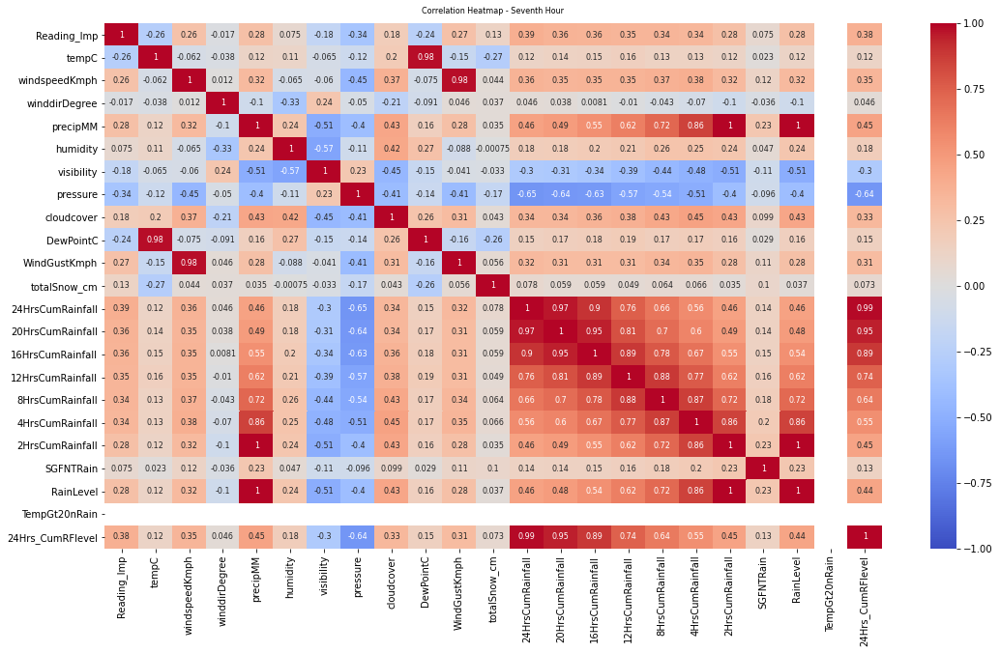

<IPython.core.display.Javascript object>

In [762]:
heatmap2 = sns.heatmap(
    df4.corr(method="spearman"),
    vmin=-1,
    vmax=1,
    cmap="coolwarm",
    annot=True,
    annot_kws={"fontsize": 8},
)
heatmap2.set_title(
    "Correlation Heatmap - Seventh Hour", fontdict={"fontsize": 8}, pad=10
)

Text(0.5, 1.0, 'Correlation Heatmap - Tenth Hour')

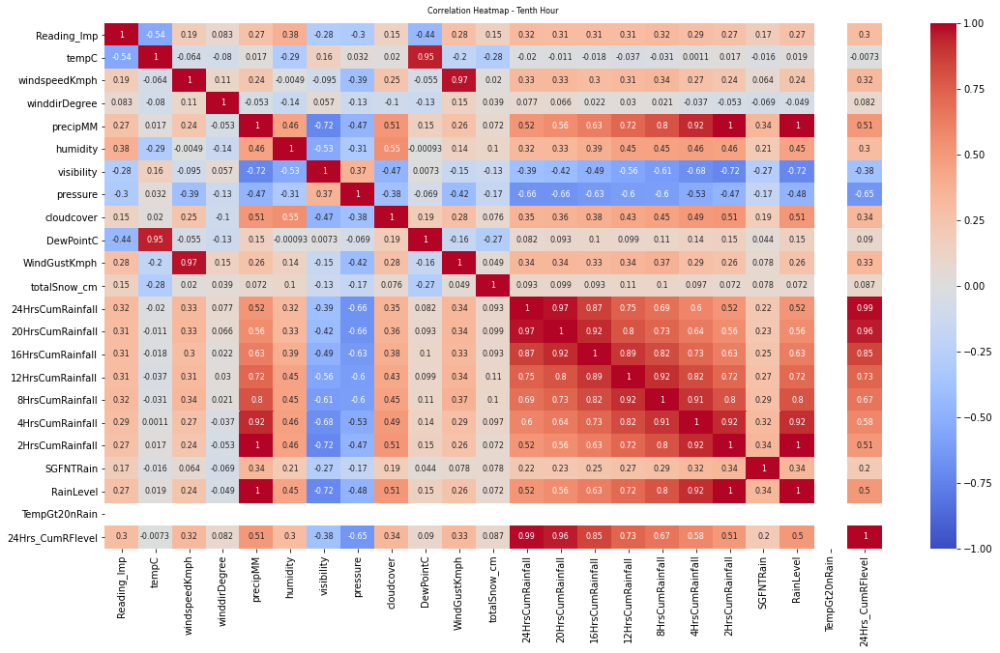

<IPython.core.display.Javascript object>

In [764]:
heatmap3 = sns.heatmap(
    df5.corr(method="spearman"),
    vmin=-1,
    vmax=1,
    cmap="coolwarm",
    annot=True,
    annot_kws={"fontsize": 8},
)
heatmap3.set_title("Correlation Heatmap - Tenth Hour", fontdict={"fontsize": 8}, pad=10)

In [765]:
df2 = df2.drop(["winddirDegree", "TempGt20nRain", "RainLevel", "SGFNTRain"], axis=1,)

<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'Correlation Heatmap - Thirteenth Hour')

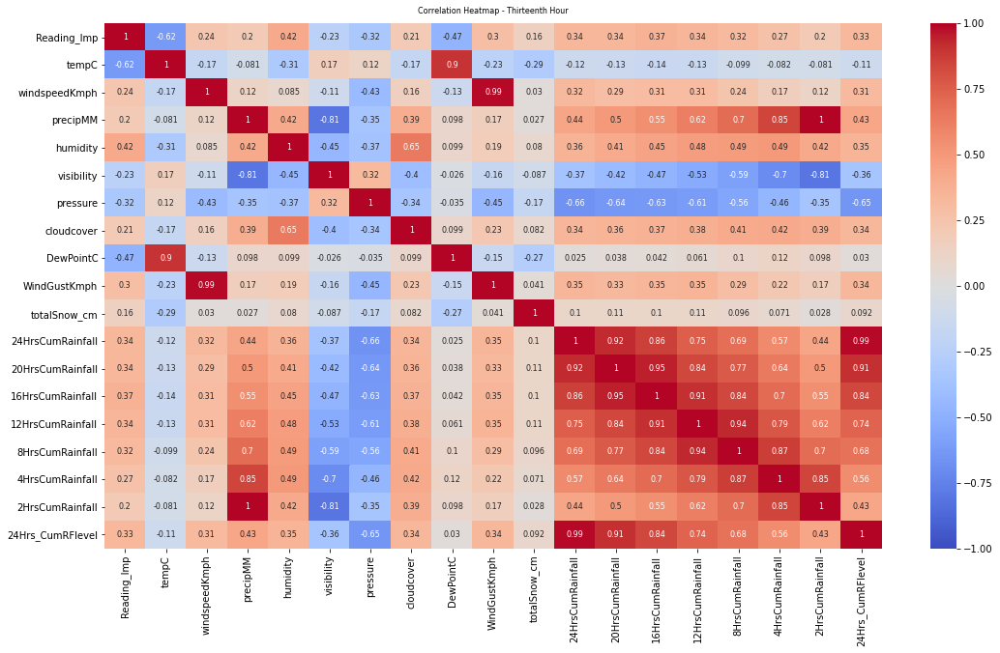

<IPython.core.display.Javascript object>

In [767]:
heatmap4 = sns.heatmap(
    df6.corr(method="spearman"),
    vmin=-1,
    vmax=1,
    cmap="coolwarm",
    annot=True,
    annot_kws={"fontsize": 8},
)
heatmap4.set_title(
    "Correlation Heatmap - Thirteenth Hour", fontdict={"fontsize": 8}, pad=10
)

Text(0.5, 1.0, 'Correlation Heatmap - Sixteenth Hour')

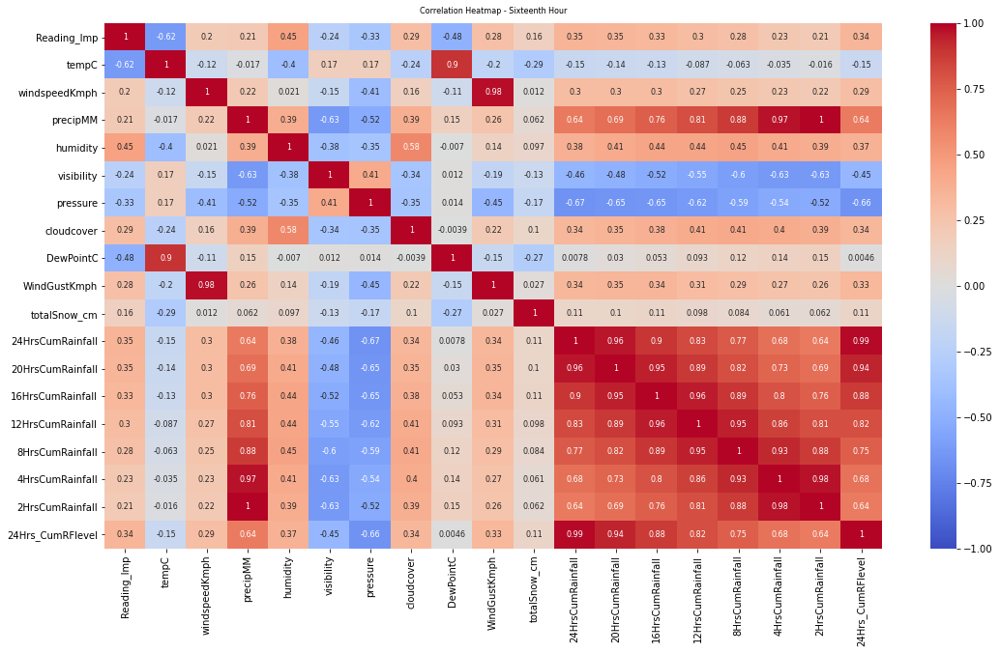

<IPython.core.display.Javascript object>

In [768]:
heatmap5 = sns.heatmap(
    df7.corr(method="spearman"),
    vmin=-1,
    vmax=1,
    cmap="coolwarm",
    annot=True,
    annot_kws={"fontsize": 8},
)
heatmap5.set_title(
    "Correlation Heatmap - Sixteenth Hour", fontdict={"fontsize": 8}, pad=10
)

In [769]:
df2 = df2.drop(
    [
        "windspeedKmph",
        "24Hrs_CumRFlevel",
        "2HrsCumRainfall",
        "4HrsCumRainfall",
        "8HrsCumRainfall",
    ],
    axis=1,
)

<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'Correlation Heatmap - Nineteenth Hour')

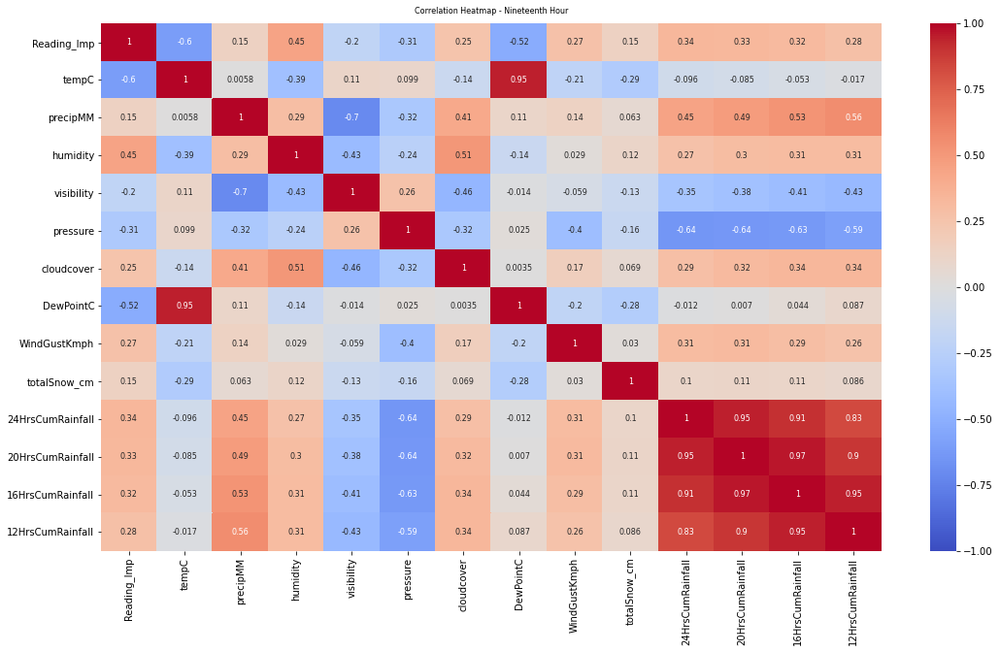

<IPython.core.display.Javascript object>

In [771]:
heatmap6 = sns.heatmap(
    df8.corr(method="spearman"),
    vmin=-1,
    vmax=1,
    cmap="coolwarm",
    annot=True,
    annot_kws={"fontsize": 8},
)
heatmap6.set_title(
    "Correlation Heatmap - Nineteenth Hour", fontdict={"fontsize": 8}, pad=10
)

In [773]:
df2 = df2.drop(["DewPointC", "20HrsCumRainfall", "16HrsCumRainfall"], axis=1,)

<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'Correlation Heatmap - Twenty First Hour')

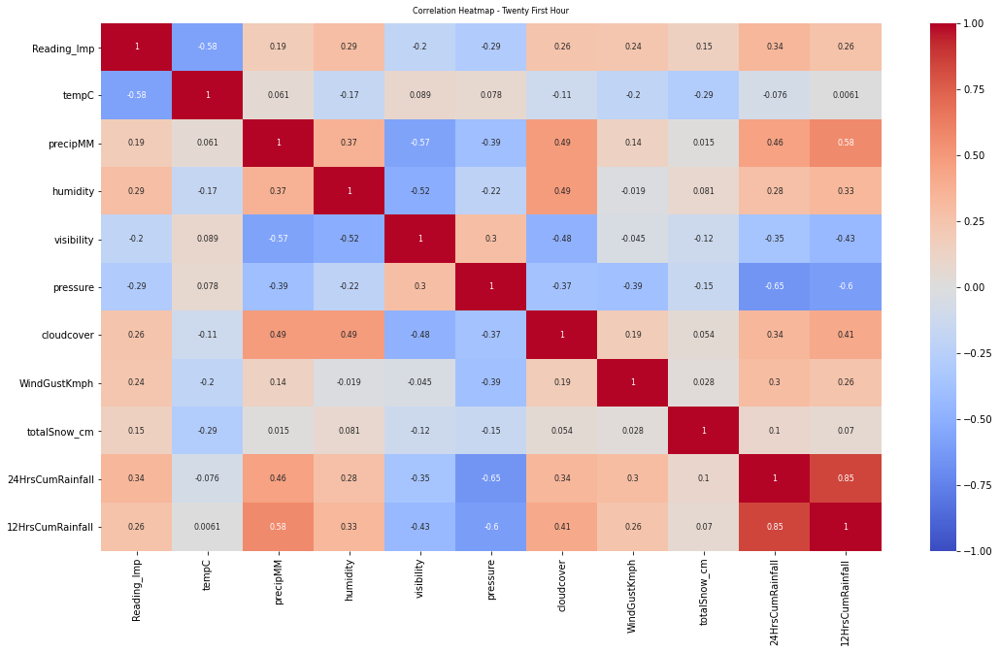

<IPython.core.display.Javascript object>

In [775]:
heatmap7 = sns.heatmap(
    df9.corr(method="spearman"),
    vmin=-1,
    vmax=1,
    cmap="coolwarm",
    annot=True,
    annot_kws={"fontsize": 8},
)
heatmap7.set_title(
    "Correlation Heatmap - Twenty First Hour", fontdict={"fontsize": 8}, pad=10
)

In [776]:
df2 = df2.drop(["12HrsCumRainfall"], axis=1)

<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'Correlation Heatmap - Twenty Fourth Hour')

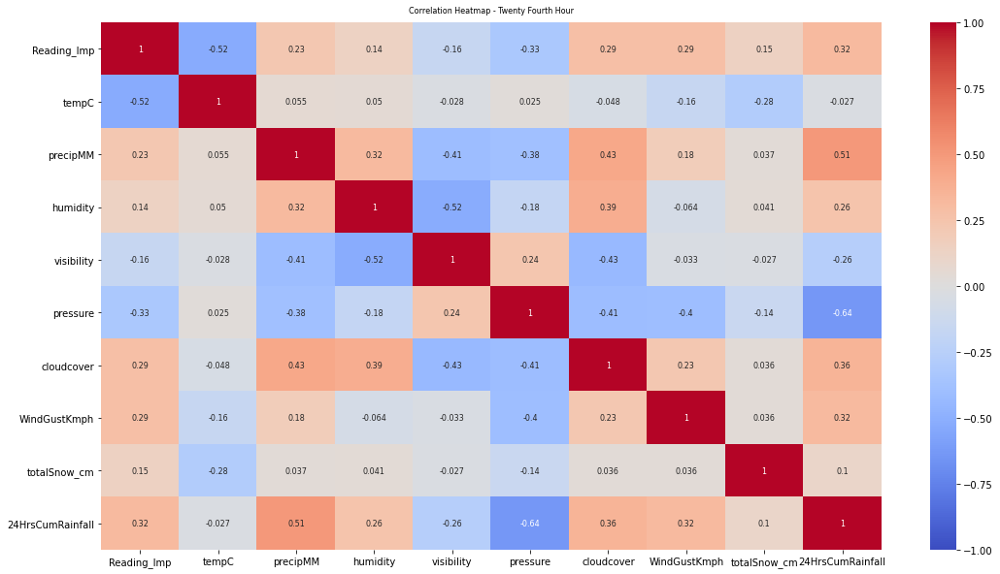

<IPython.core.display.Javascript object>

In [778]:
heatmap8 = sns.heatmap(
    df10.corr(method="spearman"),
    vmin=-1,
    vmax=1,
    cmap="coolwarm",
    annot=True,
    annot_kws={"fontsize": 8},
)
heatmap8.set_title(
    "Correlation Heatmap - Twenty Fourth Hour", fontdict={"fontsize": 8}, pad=10
)

Text(0.5, 1.0, 'Correlation Heatmap')

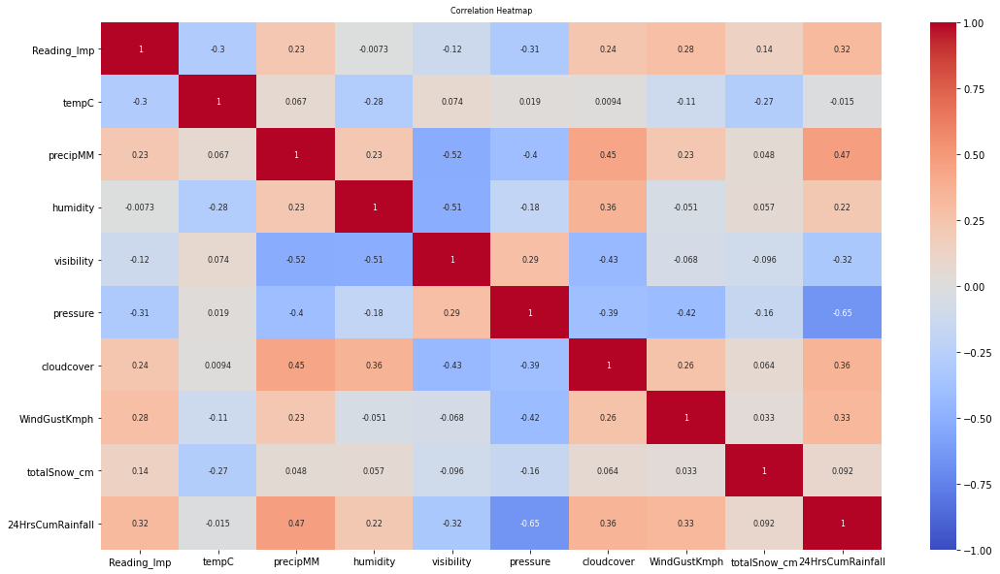

<IPython.core.display.Javascript object>

In [779]:
heatmap = sns.heatmap(
    df2.corr(method="spearman"),
    vmin=-1,
    vmax=1,
    cmap="coolwarm",
    annot=True,
    annot_kws={"fontsize": 8},
)
heatmap.set_title("Correlation Heatmap", fontdict={"fontsize": 8}, pad=10)

In [780]:
df2 = df2.drop(["visibility", "cloudcover"], axis=1)

<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'Correlation Heatmap')

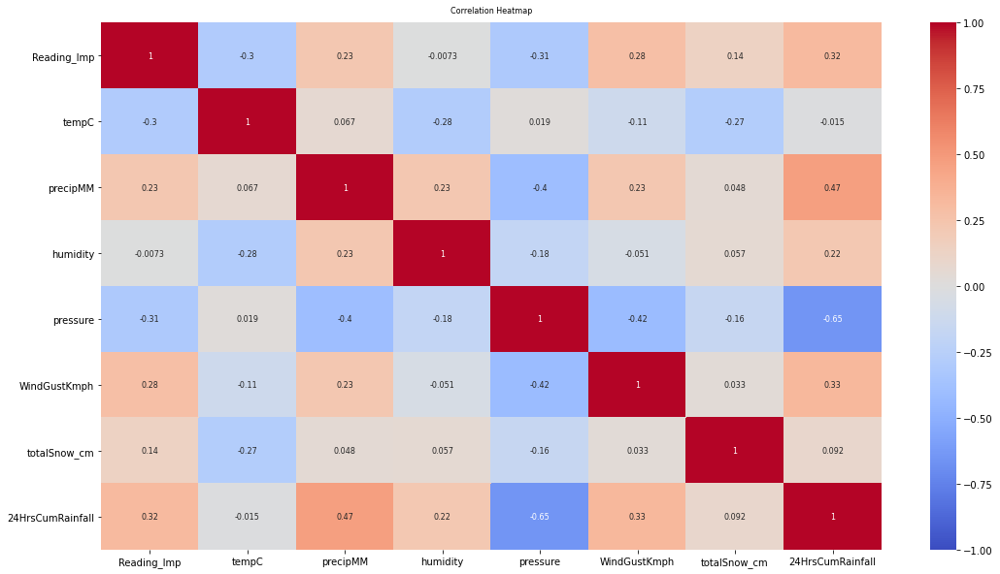

<IPython.core.display.Javascript object>

In [781]:
heatmap = sns.heatmap(
    df2.corr(method="spearman"),
    vmin=-1,
    vmax=1,
    cmap="coolwarm",
    annot=True,
    annot_kws={"fontsize": 8},
)
heatmap.set_title("Correlation Heatmap", fontdict={"fontsize": 8}, pad=10)

Text(0.5, 1.0, 'Correlation Heatmap - Twenty Fourth Hour')

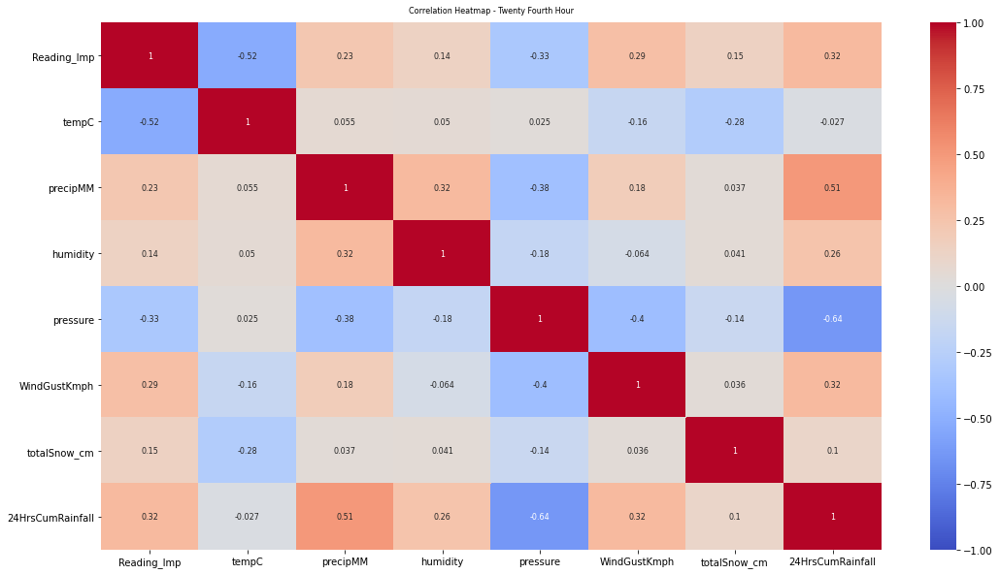

<IPython.core.display.Javascript object>

In [783]:
heatmap8 = sns.heatmap(
    df10.corr(method="spearman"),
    vmin=-1,
    vmax=1,
    cmap="coolwarm",
    annot=True,
    annot_kws={"fontsize": 8},
)
heatmap8.set_title(
    "Correlation Heatmap - Twenty Fourth Hour", fontdict={"fontsize": 8}, pad=10
)

Text(0.5, 1.0, 'Correlation Heatmap - Sixteenth Hour')

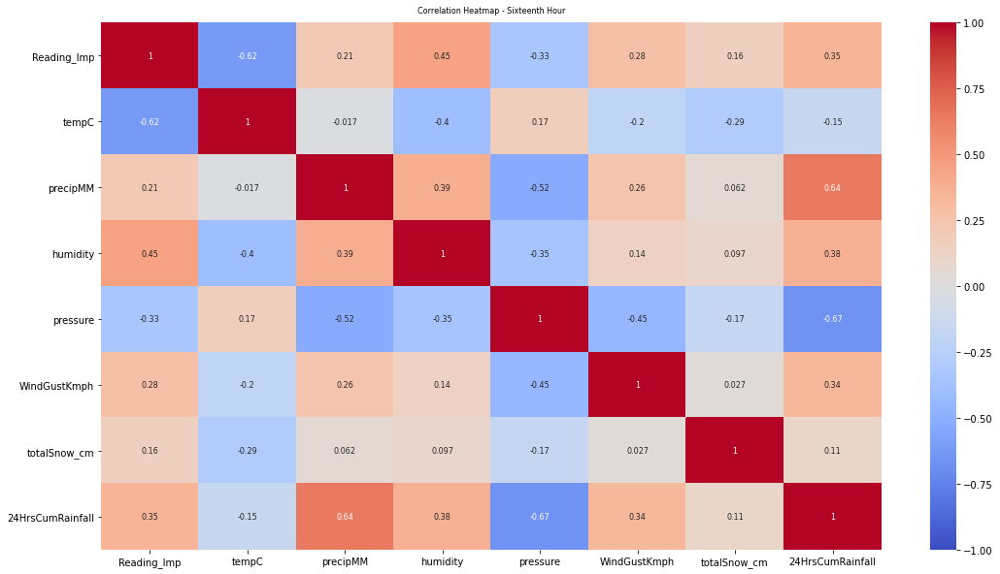

<IPython.core.display.Javascript object>

In [786]:
heatmap5 = sns.heatmap(
    df7.corr(method="spearman"),
    vmin=-1,
    vmax=1,
    cmap="coolwarm",
    annot=True,
    annot_kws={"fontsize": 8},
)
heatmap5.set_title(
    "Correlation Heatmap - Sixteenth Hour", fontdict={"fontsize": 8}, pad=10
)

Text(0.5, 1.0, 'Asset 1E18034 Correlation Heatmap')

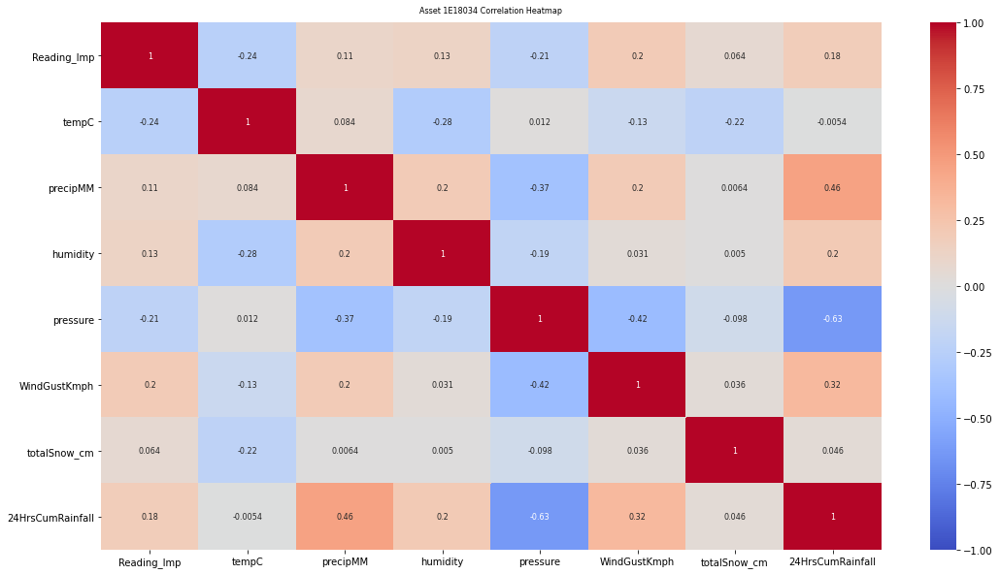

<IPython.core.display.Javascript object>

In [788]:
cdf_2 = df_1E18034[
    [
        "Reading_Imp",
        "tempC",
        "precipMM",
        "humidity",
        "pressure",
        "WindGustKmph",
        "totalSnow_cm",
        "24HrsCumRainfall",
    ]
].copy()
heatmap = sns.heatmap(
    cdf_2.corr(method="spearman"),
    vmin=-1,
    vmax=1,
    cmap="coolwarm",
    annot=True,
    annot_kws={"fontsize": 8},
)
heatmap.set_title("Asset 1E18034 Correlation Heatmap", fontdict={"fontsize": 8}, pad=10)

# <font color='blue'> Correlation </font>

Text(0.5, 1.0, 'Correlation Heatmap - Asset 1E09474')

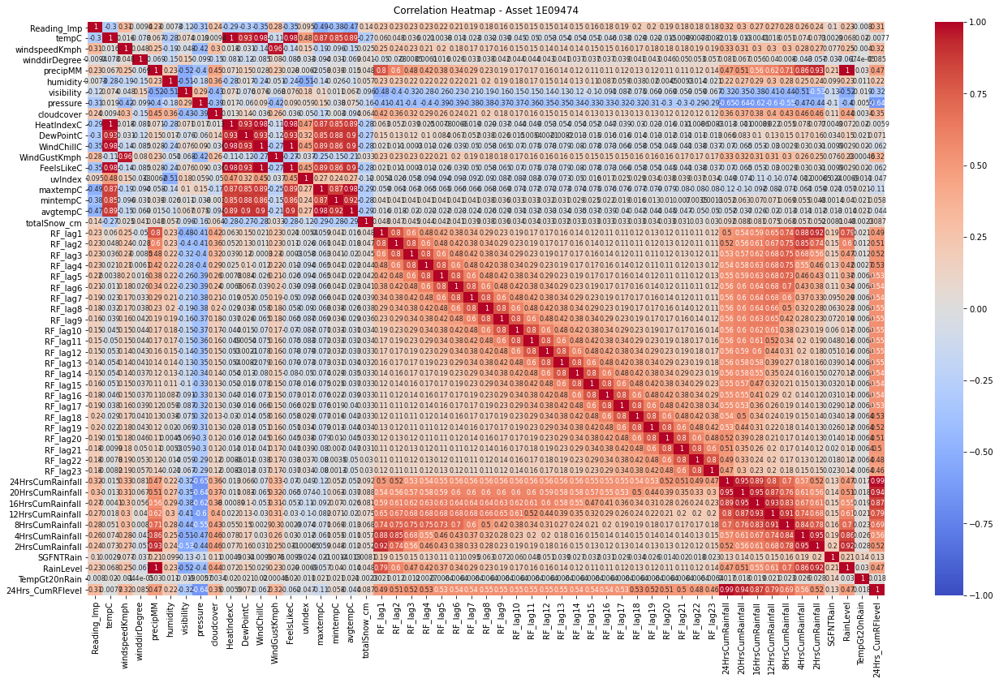

<IPython.core.display.Javascript object>

In [791]:
cdf1 = df_1E09474.drop(["AssetID", "Date", "Time", "OriginalWeatherRecord",], axis=1,)
plt.figure(figsize=(22, 13))
# cmap = sns.diverging_palette(320, 40, sep=50, as_cmap=True)
heatmap = sns.heatmap(
    cdf1.corr(method="spearman"),
    vmin=-1,
    vmax=1,
    cmap="coolwarm",
    annot=True,
    annot_kws={"fontsize": 8},
)
heatmap.set_title(
    "Correlation Heatmap - Asset 1E09474", fontdict={"fontsize": 12}, pad=10
)

Text(0.5, 1.0, 'Correlation Heatmap - Asset 1E18034')

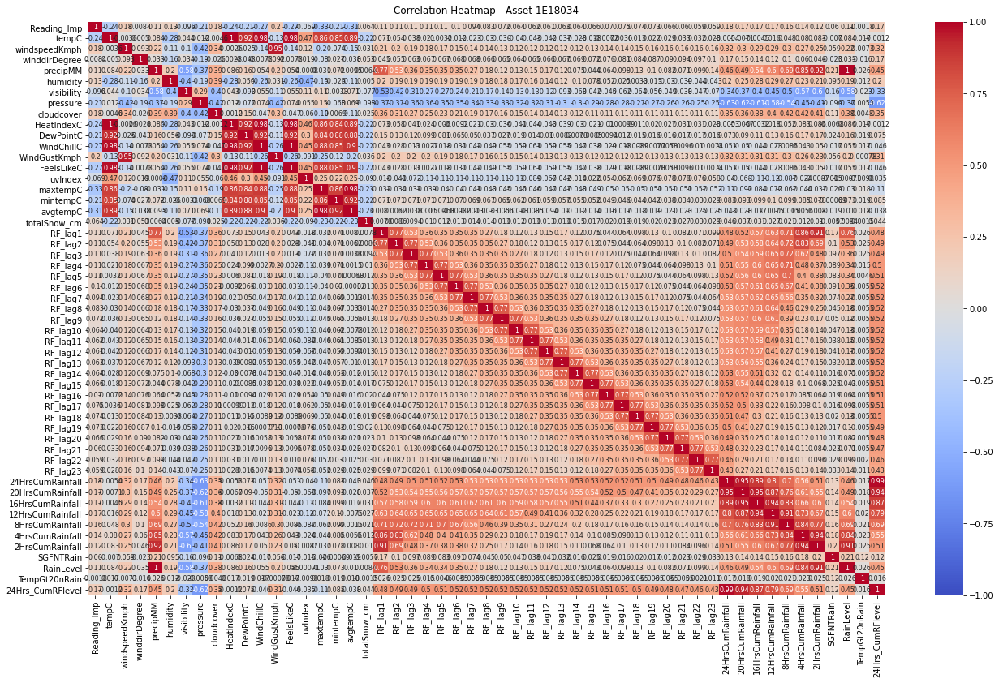

<IPython.core.display.Javascript object>

In [792]:
cdf2 = df_1E18034.drop(["AssetID", "Date", "Time", "OriginalWeatherRecord",], axis=1,)
plt.figure(figsize=(22, 13))
# cmap = sns.diverging_palette(320, 40, sep=50, as_cmap=True)
heatmap = sns.heatmap(
    cdf2.corr(method="spearman"),
    vmin=-1,
    vmax=1,
    cmap="coolwarm",
    annot=True,
    annot_kws={"fontsize": 8},
)
heatmap.set_title(
    "Correlation Heatmap - Asset 1E18034", fontdict={"fontsize": 12}, pad=10
)

Text(0.5, 1.0, 'Correlation Heatmap - Asset 3E03007')

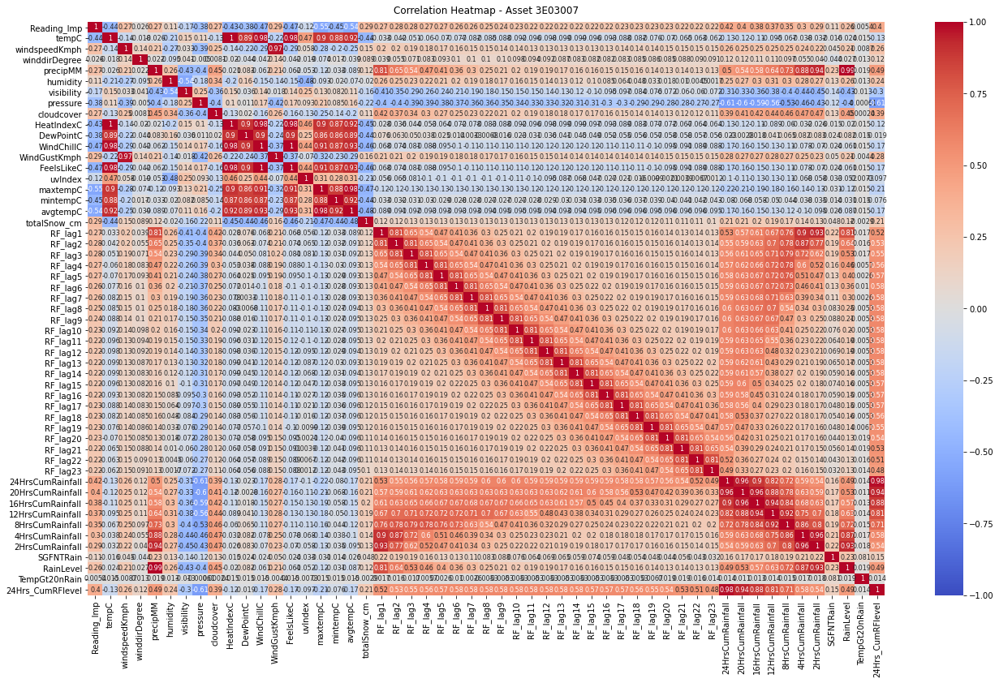

<IPython.core.display.Javascript object>

In [793]:
cdf3 = df_3E03007.drop(["AssetID", "Date", "Time", "OriginalWeatherRecord",], axis=1,)
plt.figure(figsize=(22, 13))
# cmap = sns.diverging_palette(320, 40, sep=50, as_cmap=True)
heatmap = sns.heatmap(
    cdf3.corr(method="spearman"),
    vmin=-1,
    vmax=1,
    cmap="coolwarm",
    annot=True,
    annot_kws={"fontsize": 8},
)
heatmap.set_title(
    "Correlation Heatmap - Asset 3E03007", fontdict={"fontsize": 12}, pad=10
)

Text(0.5, 1.0, 'Correlation Heatmap - Asset 3E43383')

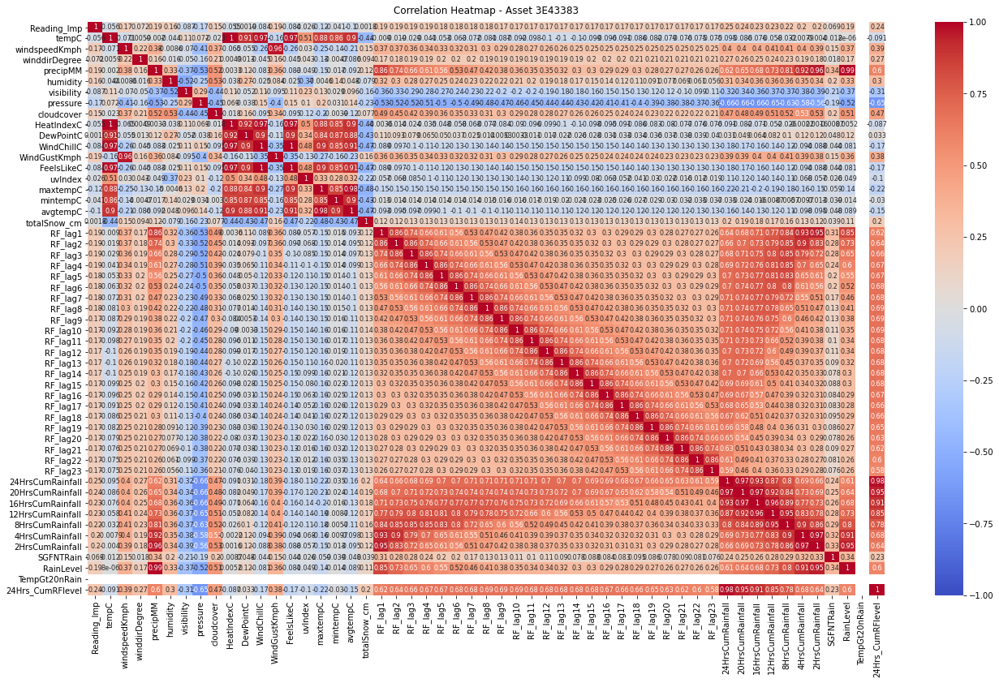

<IPython.core.display.Javascript object>

In [794]:
cdf4 = df_3E43383.drop(["AssetID", "Date", "Time", "OriginalWeatherRecord",], axis=1,)
plt.figure(figsize=(22, 13))
# cmap = sns.diverging_palette(320, 40, sep=50, as_cmap=True)
heatmap = sns.heatmap(
    cdf4.corr(method="spearman"),
    vmin=-1,
    vmax=1,
    cmap="coolwarm",
    annot=True,
    annot_kws={"fontsize": 8},
)
heatmap.set_title(
    "Correlation Heatmap - Asset 3E43383", fontdict={"fontsize": 12}, pad=10
)

Text(0.5, 1.0, 'Correlation Heatmap')

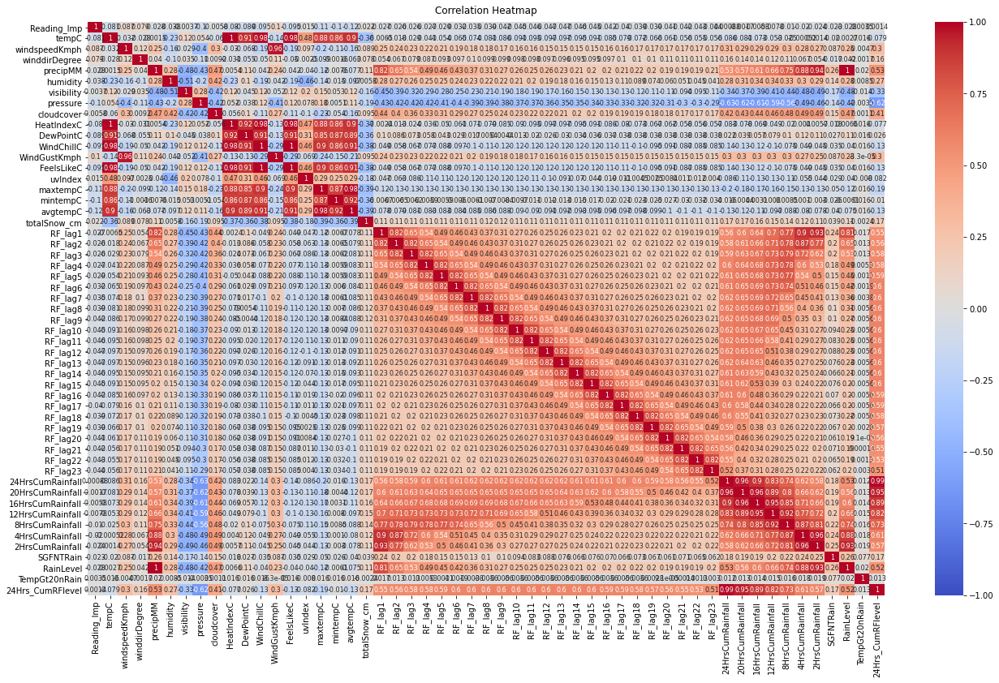

<IPython.core.display.Javascript object>

In [795]:
fulldf_hourly

cdf_full = fulldf_hourly.drop(
    ["AssetID", "Date", "Time", "OriginalWeatherRecord",], axis=1,
)
plt.figure(figsize=(22, 13))
# cmap = sns.diverging_palette(320, 40, sep=50, as_cmap=True)
heatmap = sns.heatmap(
    cdf_full.corr(method="spearman"),
    vmin=-1,
    vmax=1,
    cmap="coolwarm",
    annot=True,
    annot_kws={"fontsize": 8},
)
heatmap.set_title("Correlation Heatmap", fontdict={"fontsize": 12}, pad=10)

Text(0.5, 1.0, 'Correlation Heatmap - Reduced Features')

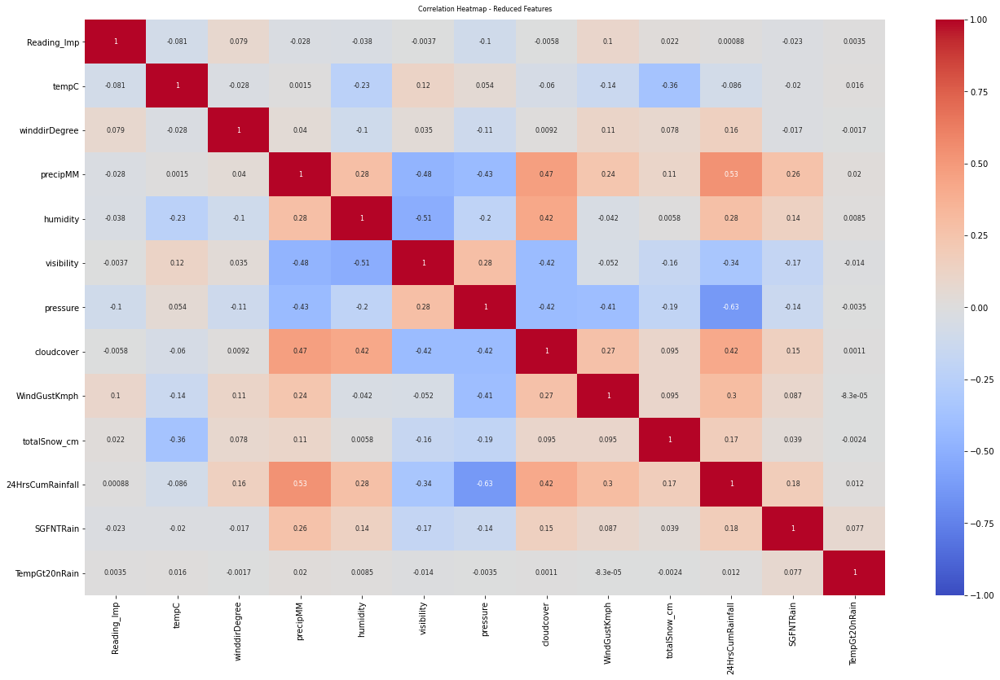

<IPython.core.display.Javascript object>

In [802]:
cdf_full2 = cdf_full.drop(LagCols, axis=1)
cdf_full2 = cdf_full2.drop(
    [
        "WindChillC",
        "HeatIndexC",
        "FeelsLikeC",
        "uvIndex",
        "maxtempC",
        "mintempC",
        "avgtempC",
        "DewPointC",
        "RainLevel",
        "windspeedKmph",
        "20HrsCumRainfall",
        "16HrsCumRainfall",
        "8HrsCumRainfall",
        "4HrsCumRainfall",
        "2HrsCumRainfall",
        "12HrsCumRainfall",
        "24Hrs_CumRFlevel",
    ],
    axis=1,
)
plt.figure(figsize=(22, 13))
# cmap = sns.diverging_palette(320, 40, sep=50, as_cmap=True)
heatmap = sns.heatmap(
    cdf_full2.corr(method="spearman"),
    vmin=-1,
    vmax=1,
    cmap="coolwarm",
    annot=True,
    annot_kws={"fontsize": 8},
)
heatmap.set_title(
    "Correlation Heatmap - Reduced Features", fontdict={"fontsize": 8}, pad=10
)

In [ ]:
df2 = df.drop(
    [
        "WindChillC",
        "HeatIndexC",
        "FeelsLikeC",
        "uvIndex",
        "maxtempC",
        "mintempC",
        "avgtempC",
    ],
    axis=1,
)
df2 = df2.drop(LagCols, axis=1)

In [ ]:
df3 = df2.between_time("00:00", "00:59")
df4 = df2.between_time("06:00", "06:59")
df5 = df2.between_time("09:00", "09:59")
df6 = df2.between_time("12:00", "12:59")
df7 = df2.between_time("15:00", "15:59")
df8 = df2.between_time("18:00", "18:59")
df9 = df2.between_time("20:00", "20:59")
df10 = df2.between_time("22:00", "22:59")